In [1]:
from pyspark.sql.functions import split, udf
from pyspark.sql import functions as sf
from pyspark.ml.clustering import KMeans
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
from pyspark.sql.functions import desc, row_number, monotonically_increasing_id
from pyspark.sql.window import Window
import numpy as np
import pandas as pd
import seaborn as sns
from pyspark.sql.functions import isnan, when, count, col
from pyspark.sql.functions import avg, col, when
from pyspark.sql.window import Window
from pyspark.mllib.stat import Statistics
from pyspark.sql.types import *
import plotly.express as px
import pyspark.sql.functions as f
from geopy.geocoders import Nominatim
import plotly.graph_objects as go
from pyspark.ml.regression import LinearRegression
from tqdm import tqdm
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.evaluation import ClusteringEvaluator
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from pyspark.ml import Pipeline
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.feature import IndexToString, StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.linalg import Vectors

%matplotlib inline

from pyspark import SparkContext
from pyspark.sql import SparkSession
# initialize a new Spark Context to use for the execution of the script
sc = SparkContext(appName="MY-APP-NAME", master="local[*]")

spark = SparkSession.builder \
    .master('local[*]') \
    .config("spark.driver.memory", "15g") \
    .appName("my_app") \
    .getOrCreate()

In [2]:
# importo dataset
df_rdd = sc.textFile('pollution_us_2000_2016.csv')

kdd_df = spark.read.options(inferSchema=True,
                            delimiter=',',
                            header=True).csv(df_rdd)

kdd_df = kdd_df.drop('Address', 'NO2 Units',
                     'O3 Units', 'SO2 Units',
                     'CO Units', '_c0')

kdd_df.show(2)

+----------+-----------+--------+-------+--------+-------+----------+---------+-----------------+----------------+-------+-------+----------------+---------------+------+--------+-----------------+----------------+-------+--------+----------------+---------------+------+
|State Code|County Code|Site Num|  State|  County|   City|Date Local| NO2 Mean|NO2 1st Max Value|NO2 1st Max Hour|NO2 AQI|O3 Mean|O3 1st Max Value|O3 1st Max Hour|O3 AQI|SO2 Mean|SO2 1st Max Value|SO2 1st Max Hour|SO2 AQI| CO Mean|CO 1st Max Value|CO 1st Max Hour|CO AQI|
+----------+-----------+--------+-------+--------+-------+----------+---------+-----------------+----------------+-------+-------+----------------+---------------+------+--------+-----------------+----------------+-------+--------+----------------+---------------+------+
|         4|         13|    3002|Arizona|Maricopa|Phoenix|2000-01-01|19.041667|             49.0|              19|     46| 0.0225|            0.04|             10|    34|     3.0|     

In [3]:
print('numero osservazioni:', kdd_df.count())

numero osservazioni: 1746661


In [4]:
kdd_df.printSchema()

root
 |-- State Code: integer (nullable = true)
 |-- County Code: integer (nullable = true)
 |-- Site Num: integer (nullable = true)
 |-- State: string (nullable = true)
 |-- County: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Date Local: string (nullable = true)
 |-- NO2 Mean: double (nullable = true)
 |-- NO2 1st Max Value: double (nullable = true)
 |-- NO2 1st Max Hour: integer (nullable = true)
 |-- NO2 AQI: integer (nullable = true)
 |-- O3 Mean: double (nullable = true)
 |-- O3 1st Max Value: double (nullable = true)
 |-- O3 1st Max Hour: integer (nullable = true)
 |-- O3 AQI: integer (nullable = true)
 |-- SO2 Mean: double (nullable = true)
 |-- SO2 1st Max Value: double (nullable = true)
 |-- SO2 1st Max Hour: integer (nullable = true)
 |-- SO2 AQI: double (nullable = true)
 |-- CO Mean: double (nullable = true)
 |-- CO 1st Max Value: double (nullable = true)
 |-- CO 1st Max Hour: integer (nullable = true)
 |-- CO AQI: double (nullable = true)



In [5]:
# Check Missing values

check_missing = kdd_df.select([count(when(col(c).contains('None') | \
                            col(c).contains('NULL') | \
                            (col(c) == '' ) | \
                            col(c).isNull() | \
                            isnan(c), c
                           )).alias(c)
                    for c in kdd_df.columns])

check_missing = check_missing.toPandas().T

check_missing.rename(columns={0:'Count'},
                     inplace = True)

check_missing.sort_values('Count',
                          ascending=False)

,Count
CO AQI,873323
SO2 AQI,872907
O3 1st Max Value,0
CO 1st Max Hour,0
CO 1st Max Value,0
CO Mean,0
SO2 1st Max Hour,0
SO2 1st Max Value,0
SO2 Mean,0
O3 AQI,0


**Sostituzione Missing values** --> eseguo un groupby su Site Num e DateLocal e salvo il risultato in una window (w) la quale verrà utilizza come discriminante per rimpiazzare i missing values

In [6]:
w = Window().partitionBy('Site Num', 'City', 'Date Local')

In [7]:
kdd_df = kdd_df.withColumn('CO AQI',
                           when(col('CO AQI').isNull(),
                               avg(col('CO AQI')).over(w)
                                   ).otherwise(col('CO AQI')))

kdd_df = kdd_df.withColumn('SO2 AQI',
                           when(col('SO2 AQI').isNull(),
                                avg(col('SO2 AQI')).over(w)
                                   ).otherwise(col('SO2 AQI')))

kdd_df.show(3)

+----------+-----------+--------+----------+---------+-----------+----------+---------+-----------------+----------------+-------+--------+----------------+---------------+------+--------+-----------------+----------------+-------+--------+----------------+---------------+------+
|State Code|County Code|Site Num|     State|   County|       City|Date Local| NO2 Mean|NO2 1st Max Value|NO2 1st Max Hour|NO2 AQI| O3 Mean|O3 1st Max Value|O3 1st Max Hour|O3 AQI|SO2 Mean|SO2 1st Max Value|SO2 1st Max Hour|SO2 AQI| CO Mean|CO 1st Max Value|CO 1st Max Hour|CO AQI|
+----------+-----------+--------+----------+---------+-----------+----------+---------+-----------------+----------------+-------+--------+----------------+---------------+------+--------+-----------------+----------------+-------+--------+----------------+---------------+------+
|         6|         73|       1|California|San Diego|Chula Vista|2000-05-13|16.347826|             35.0|               5|     33|0.041708|           0.063| 

In [8]:
check_missing = kdd_df.select([count(when(col(c).contains('None') | \
                            col(c).contains('NULL') | \
                            (col(c) == '' ) | \
                            col(c).isNull() | \
                            isnan(c), c
                           )).alias(c)
                    for c in kdd_df.columns])

check_missing = check_missing.toPandas().T

check_missing.rename(columns={0:'Count'},
                     inplace = True)

check_missing.sort_values('Count',
                          ascending=False)

,Count
CO AQI,399
O3 1st Max Value,0
CO 1st Max Hour,0
CO 1st Max Value,0
CO Mean,0
SO2 AQI,0
SO2 1st Max Hour,0
SO2 1st Max Value,0
SO2 Mean,0
O3 AQI,0


In [9]:
# drop delle 399 righe con Nan non rimpiazzabili
kdd_df = kdd_df.na.drop()
kdd_df.count()

1746262

## Studio Correlazione

Vado adesso ad indagare la correlazione fra le varie colonne

In [10]:
kdd_df_quant = kdd_df.select([(c)
                   for (c,c_type) in kdd_df.dtypes
                   if c_type not in ('timestamp', 'string', 'date')])

kdd_df_quant.count()

1746262

In [11]:
### DA RUNNARE SOLO LA PRIMA VOLTA ###

#kdd_df_quant.write.csv('kdd_df_quant.csv')

In [12]:
carico_rdd= sc.textFile('kdd_df_quant.csv')

kdd_quant = carico_rdd.map(lambda l: l.split(","))

In [13]:
kdd_quant.take(1)

[['6',
  '73',
  '1',
  '24.217391',
  '50.0',
  '21',
  '47',
  '0.029542',
  '0.054',
  '10',
  '46',
  '2.521739',
  '3.0',
  '9',
  '4.0',
  '1.126087',
  '2.0',
  '6',
  '16.0']]

In [14]:
corr_matr = Statistics.corr(kdd_quant,
                            method="pearson")

In [15]:
corr_matr_pandas = pd.DataFrame(corr_matr)

corr_matr_pandas.rename(columns={0 : 'StateCode', 1: 'CountryCode', 2: 'SiteNum', 3: 'NO2Mean', 4: 'NO21stMaxValue',
                                5: 'NO21stMaxHour', 6: 'NO2AQI', 7: 'O3Mean', 8: 'O31stMaxValue', 9: 'O31stMaxHour',
                                10: 'O3AQI', 11: 'SO2Mean', 12: 'SO21stMaxValue', 13: 'SO2MaxHour', 14: 'SO2AQI',
                                15: 'COMean', 16: 'Co1stMaxValue', 17: 'CO1stMaxHour', 18: 'COAQI'}, index={0 : 'StateCode', 1: 'CountryCode', 2: 'SiteNum', 3: 'NO2Mean', 4: 'NO21stMaxValue',
                                5: 'NO21stMaxHour', 6: 'NO2AQI', 7: 'O3Mean', 8: 'O31stMaxValue', 9: 'O31stMaxHour',
                                10: 'O3AQI', 11: 'SO2Mean', 12: 'SO21stMaxValue', 13: 'SO2MaxHour', 14: 'SO2AQI',
                                15: 'COMean', 16: 'Co1stMaxValue', 17: 'CO1stMaxHour', 18: 'COAQI'}, inplace=True)

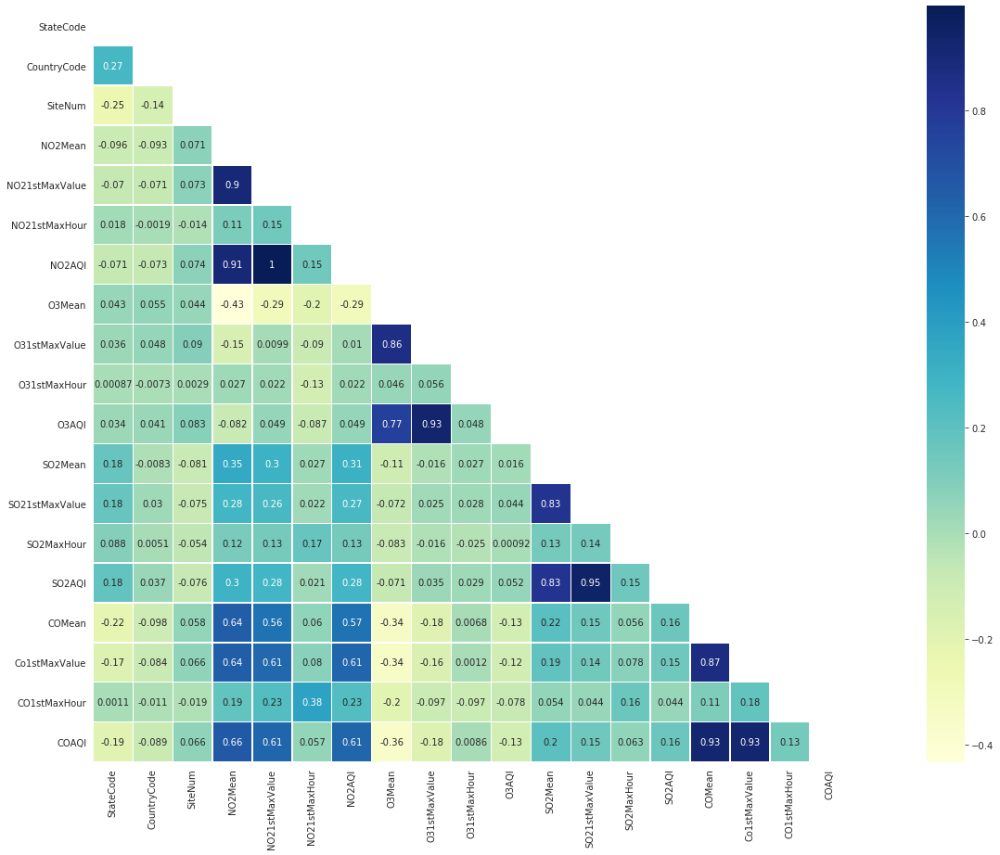

In [16]:
mask = np.zeros_like(corr_matr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("whitegrid"):
    f, ax = plt.subplots(figsize=(30, 15))
    ax = sns.heatmap(corr_matr_pandas, 
                     mask=mask, 
                     square=True, 
                     annot=True,
                    cmap="YlGnBu",
                    linewidth=0.3)

## Geo Visualization - 'NO2 AQI', 'O3 AQI', 'SO2 AQI', 'CO AQI'

Preparo il dataset

In [17]:
kdd_df_filter = kdd_df.select(['State', 'Date Local',
                               'NO2 AQI', 'O3 AQI',
                               'SO2 AQI', 'CO AQI'])

kdd_df_filter.show()

+----------+----------+-------+------+-------+------+
|     State|Date Local|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|
+----------+----------+-------+------+-------+------+
|California|2000-05-13|     33|    61|    3.0|  11.0|
|California|2000-05-13|     33|    61|    3.0|  11.0|
|California|2000-05-13|     33|    61|    3.0|  11.0|
|California|2000-05-13|     33|    61|    3.0|  11.0|
|California|2001-01-18|     43|    26|    7.0|  24.0|
|California|2001-01-18|     43|    26|    7.0|  24.0|
|California|2001-01-18|     43|    26|    7.0|  24.0|
|California|2001-01-18|     43|    26|    7.0|  24.0|
|California|2001-01-24|     36|    28|   37.0|  20.0|
|California|2001-01-24|     36|    28|   37.0|  20.0|
|California|2001-01-24|     36|    28|   37.0|  20.0|
|California|2001-01-24|     36|    28|   37.0|  20.0|
|California|2001-05-21|     13|    67|    4.0|   7.0|
|California|2001-05-21|     13|    67|    4.0|   7.0|
|California|2001-05-21|     13|    67|    4.0|   7.0|
|California|2001-05-21|     

In [18]:
# per usare plotly choropleth maps, I nomi degli stati devono essere encodati. 
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY',
}

# Analisi - granularità : Stagionale per anno

In [19]:
# per grafico annuale
"""kdd_df_filter = kdd_df_filter.withColumn('year', split(kdd_df_filter['Date Local'], '-').getItem(0))
kdd_df_filter = kdd_df_filter.select(['State', 'year','NO2 AQI', 'O3 AQI', 'SO2 AQI', 'CO AQI'])
kdd_df_filter.show(truncate=False)"""

kdd_df_filter = kdd_df_filter.withColumn('year',
                                         split(kdd_df_filter['Date Local'], '-'
                                              ).getItem(0))

kdd_df_filter = kdd_df_filter.withColumn('month',
                                         split(kdd_df_filter['Date Local'], '-'
                                              ).getItem(1))

kdd_df_filter = kdd_df_filter.select(['State', 'year',
                                      'month','NO2 AQI',
                                      'O3 AQI', 'SO2 AQI', 'CO AQI'])

def seasonalize(value):
    if int(value) >= 1 and int(value) < 3 or int(value)== 12: return 1 #inverno
    elif int(value)>= 3 and int(value) < 6: return 2 #primavera
    elif int(value)>=6 and int(value)<9: return 3 #estate
    else: return 4 #autunno

udfSeasonalize = udf(seasonalize, IntegerType())

kdd_df_filter = kdd_df_filter.withColumn('season',
                                         udfSeasonalize("month"))

kdd_df_filter = kdd_df_filter.withColumn('season_year',
                                         sf.concat(sf.col("year"),
                                                   sf.lit('-'),
                                                   sf.col("season")))

kdd_df_filter.show(truncate=False)

+----------+----+-----+-------+------+-------+------+------+-----------+
|State     |year|month|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|season|season_year|
+----------+----+-----+-------+------+-------+------+------+-----------+
|California|2000|05   |33     |61    |3.0    |11.0  |2     |2000-2     |
|California|2000|05   |33     |61    |3.0    |11.0  |2     |2000-2     |
|California|2000|05   |33     |61    |3.0    |11.0  |2     |2000-2     |
|California|2000|05   |33     |61    |3.0    |11.0  |2     |2000-2     |
|California|2001|01   |43     |26    |7.0    |24.0  |1     |2001-1     |
|California|2001|01   |43     |26    |7.0    |24.0  |1     |2001-1     |
|California|2001|01   |43     |26    |7.0    |24.0  |1     |2001-1     |
|California|2001|01   |43     |26    |7.0    |24.0  |1     |2001-1     |
|California|2001|01   |36     |28    |37.0   |20.0  |1     |2001-1     |
|California|2001|01   |36     |28    |37.0   |20.0  |1     |2001-1     |
|California|2001|01   |36     |28    |37.0   |20.0 

### VISUALIZZAZIONE DEI TREND GLOBALI NEGLI USA

In [20]:
trends= kdd_df_filter.withColumn('year_month',
                                  sf.concat(sf.col('year'),
                                            sf.lit('-'),
                                            sf.col('month')))

trends = trends.groupby("year_month").mean()
trends = trends.sort('year_month')
trends.show(5)
trends = trends.toPandas()

+----------+-----------------+------------------+------------------+------------------+-----------+
|year_month|     avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|avg(season)|
+----------+-----------------+------------------+------------------+------------------+-----------+
|   2000-01|36.68499607227023|19.501178318931657|12.750196386488609|16.916732128829537|        1.0|
|   2000-02|35.07083333333333|26.644166666666667|11.909583333333334|            12.715|        1.0|
|   2000-03|32.33385926159672| 33.24928999684443|12.188387503944462| 9.527926790785736|        2.0|
|   2000-04|30.92960570282914|37.588995321897976|14.028068612163064| 7.854087770104701|        2.0|
|   2000-05|28.75594466061392| 45.67617812364894|14.237354085603112| 6.674664937310852|        2.0|
+----------+-----------------+------------------+------------------+------------------+-----------+
only showing top 5 rows



#### TREND GENERALE DELL'INQUINANTE CO

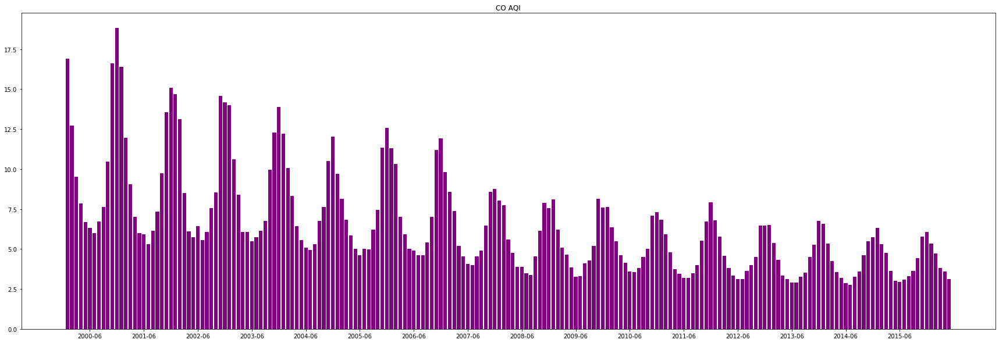

In [21]:
fig, ax1 = plt.subplots(1,1, figsize = (30,10))
ax1.bar(trends['year_month'],trends['avg(CO AQI)'], color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

#### TREND GENERALE DELL'INQUINANTE SO2

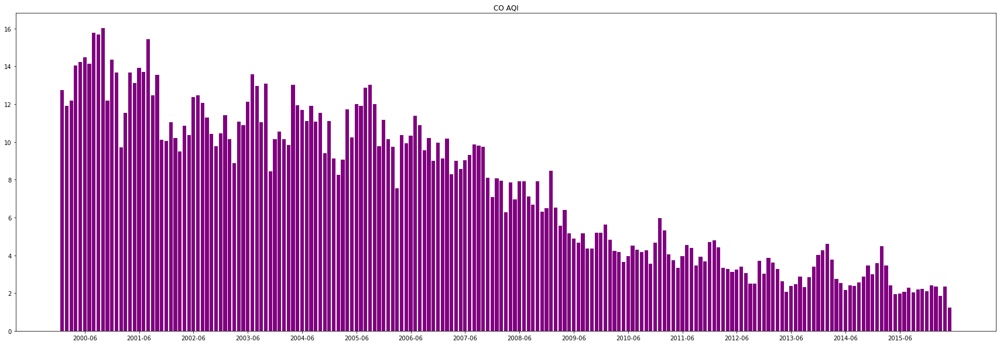

In [22]:
fig, ax1 = plt.subplots(1,1, figsize = (30,10))
ax1.bar(trends['year_month'],trends['avg(SO2 AQI)'], color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

#### TREND GENERALE DELL'INQUINANTE O3

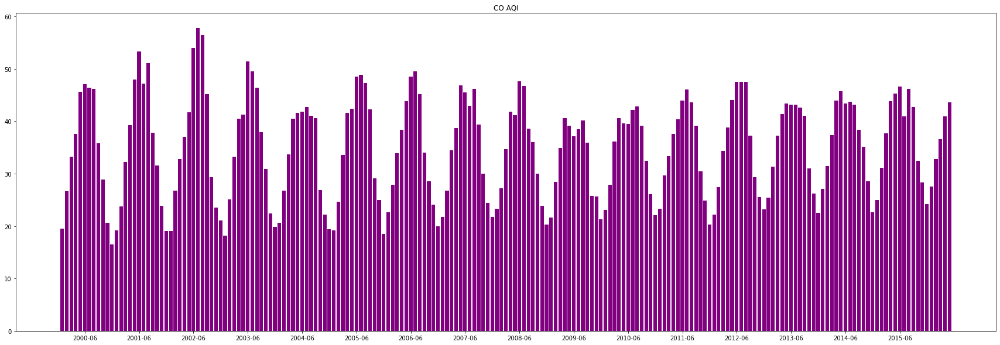

In [23]:
fig, ax1 = plt.subplots(1,1, figsize = (30,10))
ax1.bar(trends['year_month'],trends['avg(O3 AQI)'], color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

#### TREND GENERALE DELL'INQUINANTE NO2

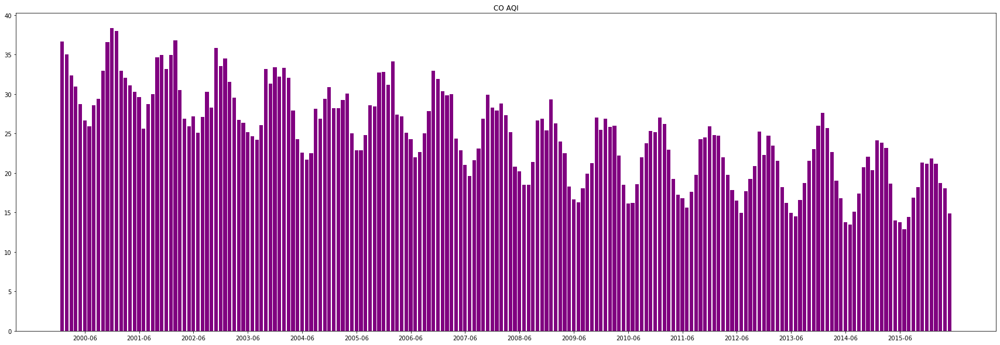

In [24]:
fig, ax1 = plt.subplots(1,1, figsize = (30,10))
ax1.bar(trends['year_month'],trends['avg(NO2 AQI)'], color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

In [25]:
kdd_df_filter.filter(kdd_df_filter['month']==12).show()

+----------+----+-----+-------+------+-------+------+------+-----------+
|     State|year|month|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|season|season_year|
+----------+----+-----+-------+------+-------+------+------+-----------+
|California|2002|   12|     46|    30|    6.0|  18.0|     1|     2002-1|
|California|2002|   12|     46|    30|    6.0|  18.0|     1|     2002-1|
|California|2002|   12|     46|    30|    6.0|  18.0|     1|     2002-1|
|California|2002|   12|     46|    30|    6.0|  18.0|     1|     2002-1|
|New Jersey|2013|   12|     16|    25|    1.0|   2.0|     1|     2013-1|
|New Jersey|2013|   12|     16|    25|    1.0|   2.0|     1|     2013-1|
|New Jersey|2013|   12|     16|    25|    1.0|   2.0|     1|     2013-1|
|New Jersey|2013|   12|     16|    25|    1.0|   2.0|     1|     2013-1|
|California|2013|   12|     29|    22|    1.0|   8.0|     1|     2013-1|
|California|2013|   12|     29|    22|    1.0|   8.0|     1|     2013-1|
|California|2013|   12|     29|    22|    1.0|   8.

#### Conversione nomi di Stato in Codice Stato Abbreviato

In [26]:
def translate(mapping):
    def translate_(col):
        return mapping.get(col)
    return udf(translate_, StringType())
 
kdd_df_filter = kdd_df_filter.withColumn("State_abbr",
                                         translate(us_state_abbrev)("State"))

# drop Distict of Columbia & Country of Mexico perchè non presenti in chlorophet
kdd_df_filter = kdd_df_filter.filter(kdd_df_filter.State != 'Country Of Mexico')
kdd_df_filter = kdd_df_filter.filter(kdd_df_filter.State != 'District Of Columbia')

kdd_df_filter = kdd_df_filter.drop('State',
                                   'month')

kdd_df_filter.show(2)

+----+-------+------+-------+------+------+-----------+----------+
|year|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|season|season_year|State_abbr|
+----+-------+------+-------+------+------+-----------+----------+
|2000|     33|    61|    3.0|  11.0|     2|     2000-2|        CA|
|2000|     33|    61|    3.0|  11.0|     2|     2000-2|        CA|
+----+-------+------+-------+------+------+-----------+----------+
only showing top 2 rows



Raggruppiamo i dati per Stato e per stagione ed anno, calcolando i valori medi di tutti gli inquinanti

In [27]:
kdd_df_aggr = kdd_df_filter.groupby('State_abbr', 'season_year'
                                   ).mean()

kdd_df_aggr_maxval = kdd_df_filter.groupby('State_abbr', 'season_year'
                                          ).max()

kdd_df_aggr.show(2)

+----------+-----------+------------------+------------------+-----------------+-----------------+-----------+
|State_abbr|season_year|      avg(NO2 AQI)|       avg(O3 AQI)|     avg(SO2 AQI)|      avg(CO AQI)|avg(season)|
+----------+-----------+------------------+------------------+-----------------+-----------------+-----------+
|        TX|     2012-2|19.945553539019965|40.831215970961885|2.716878402903811|2.513611615245009|        2.0|
|        NY|     2014-1| 32.34705882352941|21.429411764705883|7.429411764705883|5.376470588235295|        1.0|
+----------+-----------+------------------+------------------+-----------------+-----------------+-----------+
only showing top 2 rows



In [28]:
kdd_df_aggr_pd = kdd_df_aggr.toPandas()
kdd_df_aggr_pd.sort_values(by='season_year',
                           inplace=True)

kdd_df_arr_maxval_pd = kdd_df_aggr_maxval.toPandas()
kdd_df_arr_maxval_pd.sort_values(by='season_year',
                                 inplace=True)

#### Ozono (O3) variazione (stagionale) dal 2000 al 2016

In [29]:
# Plotly choropleth che mostra la variazione di ozono dal 2000 al 2016
fig_O3 = px.choropleth(kdd_df_aggr_pd,
                       locations = 'State_abbr',
                       animation_frame="season_year", 
                       color='avg(O3 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                       color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                 (0.1, "yellow"), (0.2, "yellow"),
                                                 (0.2, "orange"),  (0.3, "orange"),
                                                 (0.3, "red"),  (0.4, "red"),
                                                 (0.4, "purple"),  (0.6, "purple"),
                                                 (0.6, "maroon"),  (1.00, "maroon"),
                                                 ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi dell\'indice di qualità dell\'aria (AQI) per season-year del O3',
                        height=600,
                        )

fig_O3.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

NOTA: Durante i periodi invernali i livelli di Ozono sono nella norma. Durante i periodi estivi invece questi tendono ad aumentare in più del 50% degli stati, per poi diminuire a ridosso della stagione autunnale.

#### Variazione SO2 stagionale dal 2000 al 2016

In [30]:
# Plotly choropleth che mostra la variazione di anidride solforosa dal 2000 al 2016
fig_SO2 = px.choropleth(kdd_df_aggr_pd,
                        locations = 'State_abbr',
                        animation_frame="season_year",
                        color='avg(SO2 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                        color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                  (0.1, "yellow"), (0.2, "yellow"),
                                                  (0.2, "orange"),  (0.3, "orange"),
                                                  (0.3, "red"),  (0.4, "red"),
                                                  (0.4, "purple"),  (0.6, "purple"),
                                                  (0.6, "maroon"),  (1.00, "maroon"),
                                                  ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi dell\'indice di qualità dell\'aria (AQI) per season-year del SO2', 
                        height=600,
                        )

fig_SO2.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

#### CO Variazione stagionale 2000 al 2016

In [31]:
# Plotly choropleth che mostra la variazione di monossido di carbonio dal 2000 al 2016
fig_CO = px.choropleth(kdd_df_aggr_pd,
                       locations = 'State_abbr',
                       animation_frame="season_year",
                       color='avg(CO AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                       color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                 (0.1, "yellow"), (0.2, "yellow"),
                                                 (0.2, "orange"),  (0.3, "orange"),
                                                 (0.3, "red"),  (0.4, "red"),
                                                 (0.4, "purple"),  (0.6, "purple"),
                                                 (0.6, "maroon"),  (1.00, "maroon"),
                                        ],
                       range_color = (0, 500),
                       locationmode='USA-states',
                       scope="usa",
                       title='Valori medi dell\'indice di qualità dell\'aria (AQI) per season-year del CO',
                       height=600,
                       )

fig_CO.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

#### NO2 Variazione Stagionale dal 2000 al 2016

In [32]:
# Plotly choropleth che mostra la variazione di nitrito dal 2000 al 2016
fig_NO2 = px.choropleth(kdd_df_aggr_pd, 
                        locations = 'State_abbr',
                        animation_frame="season_year",
                        color='avg(NO2 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                        color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                  (0.1, "yellow"), (0.2, "yellow"),
                                                  (0.2, "orange"),  (0.3, "orange"),
                                                  (0.3, "red"),  (0.4, "red"),
                                                  (0.4, "purple"),  (0.6, "purple"),
                                                  (0.6, "maroon"),  (1.00, "maroon"),
                                                  ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi dell\'indice di qualità dell\'aria (AQI) per season-year del NO2',
                        height=600,
                        )
 
fig_NO2.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

## Analisi giornaliera dei mesi estivi del 2015 (anno più recente)

Abbiamo notato che durante i mesi estivi abbiamo un aumento degli AQI di O3.
Vediamo come varia di giorno in giorno per un mese estivo del 2015. 

In [33]:
daypoll_summer = kdd_df.select(['State', 'Date Local',
                                'NO2 AQI', 'O3 AQI',
                                'SO2 AQI', 'CO AQI'])

daypoll_summer = daypoll_summer.withColumn('year',
                                           split(daypoll_summer['Date Local'], '-'
                                                ).getItem(0))

daypoll_summer = daypoll_summer.withColumn('month',
                                           split(daypoll_summer['Date Local'], '-'
                                                ).getItem(1))

daypoll_summer = daypoll_summer.withColumn('day',
                                           split(daypoll_summer['Date Local'], '-'
                                                ).getItem(2))

daypoll_summer = daypoll_summer.withColumn("State_abbr",
                                           translate(us_state_abbrev)("State"))

daypoll_summer = daypoll_summer.select(['State_abbr', 'year',
                                        'month','day','NO2 AQI',
                                        'O3 AQI', 'SO2 AQI', 'CO AQI'])

daypoll_summer.show(2)

+----------+----+-----+---+-------+------+-------+------+
|State_abbr|year|month|day|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|
+----------+----+-----+---+-------+------+-------+------+
|        CA|2000|   05| 13|     33|    61|    3.0|  11.0|
|        CA|2000|   05| 13|     33|    61|    3.0|  11.0|
+----------+----+-----+---+-------+------+-------+------+
only showing top 2 rows



## July 2015: plot di ogni inquinante

In [34]:
daypoll_july15 = daypoll_summer.filter(daypoll_summer['month'] == 7
                                      ).filter(daypoll_summer['year'] == 2015
                                              ).groupby('State_abbr','day'
                                                       ).mean()

daypoll_july15 = daypoll_july15.sort('day')

In [35]:
fig_CO = px.choropleth(daypoll_july15.toPandas(),
                       locations = 'State_abbr',
                       animation_frame="day",
                       color='avg(CO AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                       color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                 (0.1, "yellow"), (0.2, "yellow"),
                                                 (0.2, "orange"),  (0.3, "orange"),
                                                 (0.3, "red"),  (0.4, "red"),
                                                 (0.4, "purple"),  (0.6, "purple"),
                                                 (0.6, "maroon"),  (1.00, "maroon"),
                                                 ],
                       range_color = (0, 500),
                       locationmode='USA-states',
                       scope="usa",
                       title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nel Luglio 2015 per CO',
                       height=600,
                      )

# Modifying legend 
fig_CO.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

In [36]:
fig_O3 = px.choropleth(daypoll_july15.toPandas(),
                       locations = 'State_abbr',
                       animation_frame="day", # showing changes through the years
                       color='avg(O3 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                       color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                 (0.1, "yellow"), (0.2, "yellow"),
                                                 (0.2, "orange"),  (0.3, "orange"),
                                                 (0.3, "red"),  (0.4, "red"),
                                                 (0.4, "purple"),  (0.6, "purple"),
                                                 (0.6, "maroon"),  (1.00, "maroon"),
                                                 ],
                       range_color = (0, 500),
                       locationmode='USA-states',
                       scope="usa",
                       title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nel Luglio 2015 per O3',
                       height=600,
                      )

# Modifying legend 
fig_O3.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

In [37]:
fig_SO2 = px.choropleth(daypoll_july15.toPandas(),
                        locations = 'State_abbr',
                        animation_frame="day", # showing changes through the years
                        color='avg(SO2 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                        color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                  (0.1, "yellow"), (0.2, "yellow"),
                                                  (0.2, "orange"),  (0.3, "orange"),
                                                  (0.3, "red"),  (0.4, "red"),
                                                  (0.4, "purple"),  (0.6, "purple"),
                                                  (0.6, "maroon"),  (1.00, "maroon"),
                                                  ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nel Luglio 2015 per SO2',
                        height=600,
                        )

# Modifying legend 
fig_SO2.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

In [38]:
fig_NO2 = px.choropleth(daypoll_july15.toPandas(),
                        locations = 'State_abbr',
                        animation_frame="day", # showing changes through the years
                        color='avg(NO2 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                        color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                  (0.1, "yellow"), (0.2, "yellow"),
                                                  (0.2, "orange"),  (0.3, "orange"),
                                                  (0.3, "red"),  (0.4, "red"),
                                                  (0.4, "purple"),  (0.6, "purple"),
                                                  (0.6, "maroon"),  (1.00, "maroon"),
                                                  ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nel Luglio 2015 per NO2',
                        height=600,
                        )

# Modifying legend 
fig_NO2.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

## August 2015: plot di ogni inquinante

In [39]:
daypoll_aug15 = daypoll_summer.filter(daypoll_summer['month'] == 7
                                     ).filter(daypoll_summer['year'] == 2015
                                             ).groupby('State_abbr','day'
                                                      ).mean()

daypoll_aug15 = daypoll_aug15.sort('day')

In [40]:
fig_CO = px.choropleth(daypoll_aug15.toPandas(),
                       locations = 'State_abbr',
                       animation_frame="day", # showing changes through the years
                       color='avg(CO AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                       color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                 (0.1, "yellow"), (0.2, "yellow"),
                                                 (0.2, "orange"),  (0.3, "orange"),
                                                 (0.3, "red"),  (0.4, "red"),
                                                 (0.4, "purple"),  (0.6, "purple"),
                                                 (0.6, "maroon"),  (1.00, "maroon"),
                                                 ],
                       range_color = (0, 500),
                       locationmode='USA-states',
                       scope="usa",
                       title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nell\'Agosto 2015 per CO',
                       height=600,
                      )

# Modifying legend 
fig_CO.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

In [41]:
fig_O3 = px.choropleth(daypoll_aug15.toPandas(),
                       locations = 'State_abbr',
                       animation_frame="day", # showing changes through the years
                       color='avg(O3 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                       color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                 (0.1, "yellow"), (0.2, "yellow"),
                                                 (0.2, "orange"),  (0.3, "orange"),
                                                 (0.3, "red"),  (0.4, "red"),
                                                 (0.4, "purple"),  (0.6, "purple"),
                                                 (0.6, "maroon"),  (1.00, "maroon"),
                                                 ],
                       range_color = (0, 500),
                       locationmode='USA-states',
                       scope="usa",
                       title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nell\'Agosto 2015 per O3',
                       height=600,
                      )

# Modifying legend 
fig_O3.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

In [42]:
fig_SO2 = px.choropleth(daypoll_aug15.toPandas(),
                        locations = 'State_abbr',
                        animation_frame="day", # showing changes through the years
                        color='avg(SO2 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                        color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                  (0.1, "yellow"), (0.2, "yellow"),
                                                  (0.2, "orange"),  (0.3, "orange"),
                                                  (0.3, "red"),  (0.4, "red"),
                                                  (0.4, "purple"),  (0.6, "purple"),
                                                  (0.6, "maroon"),  (1.00, "maroon"),
                                                  ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nell\'Agosto 2015 per SO2',
                        height=600,
                        )

# Modifying legend 
fig_SO2.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

In [43]:
fig_NO2 = px.choropleth(daypoll_aug15.toPandas(),
                        locations = 'State_abbr',
                        animation_frame="day", # showing changes through the years
                        color='avg(NO2 AQI)',
                       # Creiamo una scala fissa (scala ufficiale EPA)
                        color_continuous_scale = [(0.00, "green"),   (0.1, "green"),
                                                  (0.1, "yellow"), (0.2, "yellow"),
                                                  (0.2, "orange"),  (0.3, "orange"),
                                                  (0.3, "red"),  (0.4, "red"),
                                                  (0.4, "purple"),  (0.6, "purple"),
                                                  (0.6, "maroon"),  (1.00, "maroon"),
                                                  ],
                        range_color = (0, 500),
                        locationmode='USA-states',
                        scope="usa",
                        title='Valori medi giornalieri dell\'indice di qualità dell\'aria (AQI) nell\'Agosto 2015 per NO2',
                        height=600,
                        )

# Modifying legend 
fig_NO2.update_layout(coloraxis_colorbar=dict(
    title="Indice di qualità dell'aria (AQI)",
    ticks="outside", 
    dtick=50
))

### Osservazione delle variazioni di O3 nelle singole città (plot geografico)

In [44]:
# create dataset
gbc = kdd_df.select('Date Local', 'City',
                    'NO2 AQI','O3 AQI',
                    'SO2 AQI','CO AQI')#graph by city

gbc = gbc.withColumn('year',
                     split(gbc['Date Local'], '-'
                          ).getItem(0))

gbc = gbc.withColumn('month',
                     split(gbc['Date Local'], '-'
                          ).getItem(1))

gbc = gbc.withColumn('season',
                     udfSeasonalize("month"))

gbc = gbc.withColumn('season_year',
                     sf.concat(sf.col("year"),
                               sf.lit('-'),
                               sf.col("season")))

gbc = gbc.drop('Date Local')
gbc = gbc.drop('year')
gbc = gbc.drop('month')
gbc = gbc.drop('season')

#rimuovo i valori "not in a city" in quanto non geolocalizzabili
gbc = gbc.groupby('season_year', 'City'
                 ).mean()

gbc = gbc.filter(gbc['City'] != 'Not in a city')
gbc.show(2)

+-----------+-----------+------------------+-----------------+-----------------+-----------------+
|season_year|       City|      avg(NO2 AQI)|      avg(O3 AQI)|     avg(SO2 AQI)|      avg(CO AQI)|
+-----------+-----------+------------------+-----------------+-----------------+-----------------+
|     2008-2|    Benicia|12.347826086956522|37.22826086956522|5.554347826086956|3.152173913043478|
|     2005-3|Baton Rouge|25.426966292134832|41.59550561797753|9.752808988764045|7.348314606741573|
+-----------+-----------+------------------+-----------------+-----------------+-----------------+
only showing top 2 rows



### Procedura di geo-coding per estrarre latitudine e longitudine delle varie città

In [45]:
nominatim = Nominatim(user_agent="my_app")
geolocator = Nominatim(user_agent='myapplication')

col_names = ['City','latitude','longitude']
geodata = []

cities = (gbc.select('City'
                    ).distinct()
         ).toPandas()['City']

for city in cities:
    location = geolocator.geocode(city, timeout=1)
    if location:
        geodata.append((city, location.latitude, location.longitude))
    
sp_df = spark.createDataFrame(geodata, col_names)

new_gbc = gbc.join(sp_df,'City')
new_gbc.show(2)

+---------+-----------+-----------------+------------------+------------------+------------------+-----------------+-------------------+
|     City|season_year|     avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|         latitude|          longitude|
+---------+-----------+-----------------+------------------+------------------+------------------+-----------------+-------------------+
|Fairbanks|     2014-1|28.93548387096774| 11.03225806451613|              23.0| 11.03225806451613|64.82897449999999|-147.66991691593407|
|Fairbanks|     2015-4|17.40740740740741|12.481481481481481|12.296296296296296|5.7407407407407405|64.82897449999999|-147.66991691593407|
+---------+-----------+-----------------+------------------+------------------+------------------+-----------------+-------------------+
only showing top 2 rows



# Osservo come variano i livelli di ozono (O3) - Analisi per città e stagione (2012)
### Estate 2012

In [46]:
### aqi = 'avg(O3 AQI)'
season = '2012-3' 
aqi = 'avg(O3 AQI)'

df = new_gbc.filter(new_gbc['season_year']== season).toPandas() #summer
df['text'] = df['City'] +' '+ str(aqi)+': ' + df[aqi].astype(str)

fig = go.Figure(data=go.Scattergeo(
                locationmode = 'USA-states',
                lon = df['longitude'],
                lat = df['latitude'],
                text = df['text'],
                mode = 'markers',
                marker = dict(
                    size = 15,
                    opacity = 0.6,
                    reversescale = False,
                    autocolorscale = False,
                    symbol = 'circle',
                    line = dict(
                        width=1,
                        color='rgba(102, 102, 102)'
                    ),
                    colorscale=[(0.00, "green"),(0.1, "green"),
                                (0.1, "yellow"), (0.2, "yellow"),
                                (0.2, "orange"),  (0.3, "orange"),
                                (0.3, "red"),  (0.4, "red"),
                                (0.4, "purple"),  (0.6, "purple"),
                                (0.6, "maroon"),  (1.00, "maroon")],
                    cmin = 0,
                    cmax=500,
                    color = df[aqi],
                    colorbar_title="Indice di qualità dell'aria (AQI)"
                )))

fig.update_layout(
        title = str(season) +' '+ aqi,
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

### Primavera 2012

In [47]:
aqi = 'avg(O3 AQI)'
season = '2012-2' 

df = new_gbc.filter(new_gbc['season_year']== season).toPandas() #summer
df['text'] = df['City'] +' '+ str(aqi)+': ' + df[aqi].astype(str)

fig = go.Figure(data=go.Scattergeo(
                locationmode = 'USA-states',
                lon = df['longitude'],
                lat = df['latitude'],
                text = df['text'],
                mode = 'markers',
                marker = dict(
                    size = 15,
                    opacity = 0.6,
                    reversescale = False,
                    autocolorscale = False,
                    symbol = 'circle',
                        line = dict(
                        width=1,
                        color='rgba(102, 102, 102)'
                        ),
                    colorscale=[(0.00, "green"),   (0.1, "green"),
                                (0.1, "yellow"), (0.2, "yellow"),
                                (0.2, "orange"),  (0.3, "orange"),
                                (0.3, "red"),  (0.4, "red"),
                                (0.4, "purple"),  (0.6, "purple"),
                                (0.6, "maroon"),  (1.00, "maroon")],
                    cmin = 0,
                    cmax=500,
                    color = df[aqi],
                    colorbar_title="Indice di qualità dell'aria (AQI)"
                )))

fig.update_layout(
        title = str(season) +' '+ aqi,
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

### Inverno 2012

In [48]:
aqi = 'avg(O3 AQI)'
season = '2012-1' 

df = new_gbc.filter(new_gbc['season_year']== season).toPandas() #summer
df['text'] = df['City'] +' '+ str(aqi)+': ' + df[aqi].astype(str)

fig = go.Figure(data=go.Scattergeo(
                locationmode = 'USA-states',
                lon = df['longitude'],
                lat = df['latitude'],
                text = df['text'],
                mode = 'markers',
                marker = dict(
                    size = 15,
                    opacity = 0.5,
                    reversescale = False,
                    autocolorscale = False,
                    symbol = 'circle',
                    line = dict(
                        width=1,
                        color='rgba(102, 102, 102)'
                    ),
                colorscale=[(0.00, "green"),   (0.1, "green"),
                            (0.1, "yellow"), (0.2, "yellow"),
                            (0.2, "orange"),  (0.3, "orange"),
                            (0.3, "red"),  (0.4, "red"),
                            (0.4, "purple"),  (0.6, "purple"),
                            (0.6, "maroon"),  (1.00, "maroon")],
                cmin = 0,
                cmax=500,
                color = df[aqi],
                colorbar_title="Indice di qualità dell'aria (AQI)"
                )))

fig.update_layout(
        title = str(season) +' '+ aqi,
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

### Autunno 2012

In [49]:
aqi = 'avg(O3 AQI)'
season = '2012-4' 

df = new_gbc.filter(new_gbc['season_year']== season).toPandas() #summer
df['text'] = df['City'] +' '+ str(aqi)+': ' + df[aqi].astype(str)

fig = go.Figure(data=go.Scattergeo(
                locationmode = 'USA-states',
                lon = df['longitude'],
                lat = df['latitude'],
                text = df['text'],
                mode = 'markers',
                marker = dict(
                    size = 15,
                    opacity = 0.6,
                    reversescale = False,
                    autocolorscale = False,
                    symbol = 'circle',
                    line = dict(
                        width=1,
                        color='rgba(102, 102, 102)'
                    ),
                    colorscale=[(0.00, "green"),   (0.1, "green"),
                                (0.1, "yellow"), (0.2, "yellow"),
                                (0.2, "orange"),  (0.3, "orange"),
                                (0.3, "red"),  (0.4, "red"),
                                (0.4, "purple"),  (0.6, "purple"),
                                (0.6, "maroon"),  (1.00, "maroon")],
                cmin = 0,
                cmax=500,
                color = df[aqi],
                colorbar_title="Indice di qualità dell'aria (AQI)"
                )))

fig.update_layout(
        title = str(season) +' '+ aqi,
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

# Controllo quante osservazioni ci sono per Stato

In [50]:
count_obs = kdd_df_filter.groupby('State_abbr').count().sort('count')
count_obs.show()

+----------+-----+
|State_abbr|count|
+----------+-----+
|        WA|  962|
|        WI| 1516|
|        ID| 1828|
|        AK| 1974|
|        AL| 3126|
|        MN| 3506|
|        DE| 3630|
|        TN| 5838|
|        RI| 6320|
|        SC| 6536|
|        NM| 7128|
|        GA| 7720|
|        MI| 8182|
|        SD| 8306|
|        UT| 8668|
|        NH| 9292|
|        NV| 9692|
|        ND|11018|
|        OR|11794|
|        WY|13042|
+----------+-----+
only showing top 20 rows



In [51]:
fig = px.bar(count_obs.toPandas(), x='State_abbr', y='count')
fig.show()

In [52]:
ObsByYear = kdd_df_filter.select('*'
                                ).groupby('State_abbr','year'
                                         ).mean()
ObsByYear.show()

+----------+----+------------------+------------------+------------------+------------------+------------------+
|State_abbr|year|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|       avg(season)|
+----------+----+------------------+------------------+------------------+------------------+------------------+
|        CA|2001|30.483824161650904| 34.29852751504729| 6.309696546288334|10.541344224706219|2.5458942390369734|
|        CT|2007|26.345724907063197| 43.13382899628253| 7.263940520446097| 4.533457249070632|2.8271375464684017|
|        CO|2003|40.935749588138385|31.573311367380562|19.098846787479406|10.222405271828666| 2.499176276771005|
|        IN|2006|24.304597701149426|  35.0632183908046|25.867816091954023| 8.666666666666666| 2.839080459770115|
|        NY|2004|33.246176615688206|29.059694129255057|21.855944745929946| 6.835717809570794|2.4356191415885546|
|        KS|2006| 22.64187866927593|37.303326810176124|11.524951076320939| 6.657045009784736| 2.

### Media di valori degli inquinanti per anno negli USA

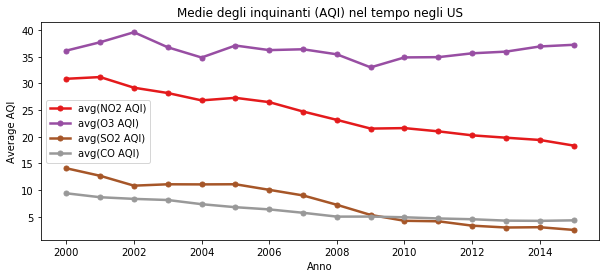

In [53]:
# Plot the aggregate decrease of all pollutants
mean_pollByYear = kdd_df_filter.select('*'
                                      ).where(kdd_df_filter['year'] != 2016
                                             ).sort('year'
                                                   ).groupby('year'
                                                            ).mean()

mean_pollByYear = mean_pollByYear.drop('avg(season)')
mean_pollByYear = mean_pollByYear.toPandas()

f, ax = plt.subplots(figsize=[10,4])
mean_pollByYear.plot(x= 'year',
                     colormap='Set1',
                     marker='.',
                     markersize=10,
                     ax =ax,linewidth=2.5)

ax.set_title('Medie degli inquinanti (AQI) nel tempo negli US')  
ax.set(xlabel="Anno",
       ylabel="Average AQI")

plt.show()

### Quali sono le città che inquinano di più negli USA?

In [54]:
avg_city = kdd_df.select('City', 'SO2 AQI',
                         'NO2 AQI', 'CO AQI', 'O3 AQI'
                        ).groupby('City'
                                 ).mean()

In [55]:
fig = px.bar(avg_city.sort(col('avg(O3 AQI)').desc()
                          ).toPandas().iloc[:30,:],
             x='City',
             y='avg(O3 AQI)',
             title='AVG O3 AQI nelle città')

fig.show()

In [56]:
fig = px.bar(avg_city.sort(col('avg(NO2 AQI)').desc()).toPandas().iloc[:30,:],
             x='City',
             y='avg(NO2 AQI)',
             title='AVG NO2 AQI nelle città')

fig.show()

In [57]:
fig = px.bar(avg_city.sort(col('avg(SO2 AQI)').desc()
                          ).toPandas().iloc[:30,:],
             x='City',
             y='avg(SO2 AQI)',
             title='AVG SO2 AQI nelle città')

fig.show()

In [58]:
fig = px.bar(avg_city.sort(col('avg(CO AQI)').desc()).toPandas().iloc[:30,:],
             x='City',
             y='avg(CO AQI)',
             title='AVG CO AQI nelle città')

fig.show()

# ANALISI DEGLI INQUINANTI IN CALIFORNIA (CA)

Dato che il maggior numero di osservazioni sono state effettuate in California, abbiamo deciso di andare a fondo ed analizzare i trend di questo stato.

### Analizziamo il numero di osservazioni fatti in CA per anno

In [59]:
CA_obsByYear = kdd_df_filter.select('State_abbr','year'
                                   ).where(kdd_df_filter['State_abbr'] == 'CA'
                                          ).groupby('State_abbr','year'
                                                   ).count().sort('year')

CA_obsByYear.show()

fig = px.bar(CA_obsByYear.toPandas(),
             x='year',
             y='count',
             title='Osservazioni in CA per anno')

fig.show()

+----------+----+-----+
|State_abbr|year|count|
+----------+----+-----+
|        CA|2000|34786|
|        CA|2001|37216|
|        CA|2002|38930|
|        CA|2003|36852|
|        CA|2004|33804|
|        CA|2005|34684|
|        CA|2006|34176|
|        CA|2007|37066|
|        CA|2008|41040|
|        CA|2009|35684|
|        CA|2010|33236|
|        CA|2011|37376|
|        CA|2012|32934|
|        CA|2013|35816|
|        CA|2014|34082|
|        CA|2015|32842|
|        CA|2016| 5500|
+----------+----+-----+



### Analizziamo le emissioni della CA nel corso degli anni

In [60]:
CA_pollutByYear = kdd_df_aggr.select('*'
                                    ).where(kdd_df_aggr['State_abbr']=='CA'
                                           ).sort('season_year')

CA_pollutByYear.show()

# NO2
CA_NO2 = CA_pollutByYear.select('season_year', 'avg(NO2 AQI)')

fig_NO2 = px.bar(CA_NO2.toPandas(),
                 x='season_year',
                 y='avg(NO2 AQI)',
                 title='avg(NO2 AQI) in CA per anno')

fig_NO2.show()

# O3
CA_O3 = CA_pollutByYear.select('season_year','avg(O3 AQI)')

fig_O3 = px.bar(CA_O3.toPandas(),
                x='season_year',
                y='avg(O3 AQI)',
                title='avg(O3 AQI) in CA per anno') #cambia colore

fig_O3.show()

# SO2
CA_SO2 = CA_pollutByYear.select('season_year','avg(SO2 AQI)')

fig_SO2 = px.bar(CA_SO2.toPandas(),
                 x='season_year',
                 y='avg(SO2 AQI)',
                 title='avg(SO2 AQI) in CA per anno') #cambia colore

fig_SO2.show()

# CO
CA_CO = CA_pollutByYear.select('season_year','avg(CO AQI)')

fig_CO = px.bar(CA_CO.toPandas(),
                x='season_year',
                y='avg(CO AQI)',
                title='avg(CO AQI) in CA per anno') #cambia colore

fig_CO.show()

+----------+-----------+------------------+------------------+------------------+------------------+-----------+
|State_abbr|season_year|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|avg(season)|
+----------+-----------+------------------+------------------+------------------+------------------+-----------+
|        CA|     2000-1|36.128924833491915|  20.4790675547098| 6.049238820171265| 17.95944338725024|        1.0|
|        CA|     2000-2|28.369152385363595| 39.50926354793886| 5.870194534506716| 8.709240389069013|        2.0|
|        CA|     2000-3|23.170829616413915| 40.39384478144514| 5.830954504906332| 6.306645851917932|        3.0|
|        CA|     2000-4|32.684294506496464|29.907681787098245| 6.386368816959197| 12.38420332801459|        4.0|
|        CA|     2001-1|  34.2226345083488| 21.77643784786642| 5.643359616573902|16.232877241805816|        1.0|
|        CA|     2001-2|28.572954496902373| 40.54838709677419|6.0197607348857085| 8.314462721640

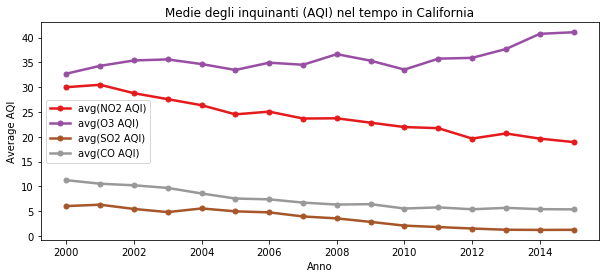

In [61]:
# Plot the aggregate decrease of all pollutants - CALIFORNIA
CAmean_pollByYear = kdd_df_filter.select('*'
                                        ).where(kdd_df_filter['State_abbr']=='CA'
                                               ).where(kdd_df_filter['year'] != 2016
                                                      ).sort('year'
                                                            ).groupby('year'
                                                                     ).mean()

CAmean_pollByYear = CAmean_pollByYear.drop('avg(season)')
CAmean_pollByYear = CAmean_pollByYear.toPandas()

f, ax = plt.subplots(figsize=[10,4])
CAmean_pollByYear.plot(x= 'year',
                       colormap='Set1',
                       marker='.',
                       markersize=10,
                       ax =ax,linewidth=2.5)

ax.set_title('Medie degli inquinanti (AQI) nel tempo in California')
ax.set(xlabel="Anno",
       ylabel="Average AQI")

plt.show()

Abbiamo rimosso l'anno 2016 in quanto aveva soltanto osservazioni fino a Marzo e quindi calcolando la media degli inquinanti risultava un calo che non rispecchia la realtà.

### Analisi della stagionalità degli inquinanti in California

In [62]:
from pyspark.sql import functions as sf

kdd_df_seas = kdd_df.select(['State', 'Date Local',
                             'NO2 AQI', 'O3 AQI',
                             'SO2 AQI', 'CO AQI']
                           ).where(kdd_df['State']=='California')

kdd_df_seas = kdd_df_seas.withColumn('year',
                                     split(kdd_df_seas['Date Local'], '-'
                                          ).getItem(0))

kdd_df_seas = kdd_df_seas.withColumn('month',
                                     split(kdd_df_seas['Date Local'], '-'
                                          ).getItem(1))

season_df= kdd_df_seas.withColumn('year_month',
                                  sf.concat(sf.col('year'),
                                            sf.lit('-'),
                                            sf.col('month')))

season_df = season_df.select('year_month','NO2 AQI',
                             'O3 AQI','SO2 AQI','CO AQI'
                            ).sort('year_month'
                                  ).groupby('year_month'
                                           ).mean()

season_df.show()

+----------+------------------+------------------+------------------+------------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+------------------+------------------+------------------+------------------+
|   2000-01| 36.08187134502924| 18.76169590643275|            6.0625|18.739766081871345|
|   2000-02| 29.98613251155624| 27.00924499229584|4.2734976887519265| 12.28697996918336|
|   2000-03| 30.72998643147897|   35.219131614654| 5.786635006784261|10.311058344640434|
|   2000-04|29.001396648044693| 39.93994413407821| 5.424581005586592|  8.86731843575419|
|   2000-05| 25.26345609065156| 43.55099150141643| 6.409348441926346| 6.876770538243626|
|   2000-06|22.198601398601397| 41.66293706293706| 4.993473193473195| 6.453263403263404|
|   2000-07|21.474642392717815| 38.61768530559168| 5.372778500216733|  5.55353272648461|
|   2000-08|25.808707124010553| 40.99868073878628|  7.08575197889182| 6.932387862796833|
|   2000-09| 30.26457

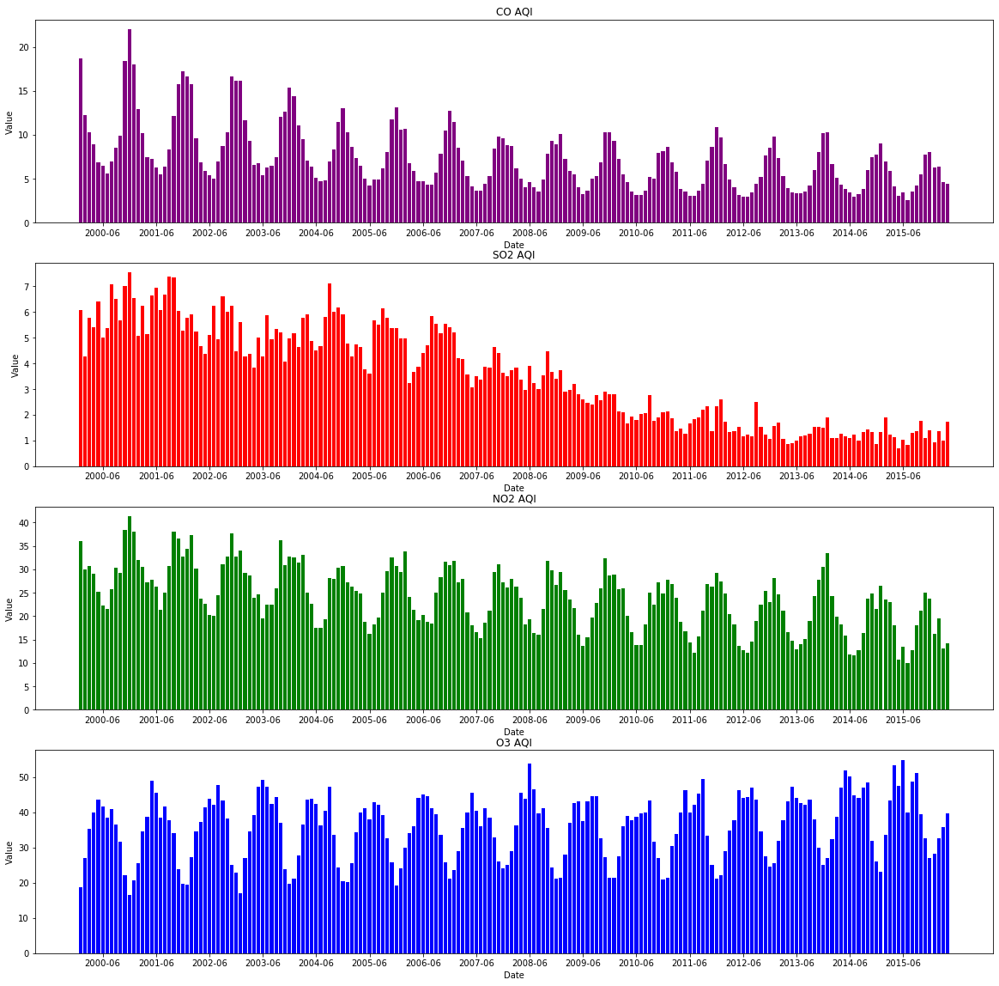

In [63]:
season_df_pd = season_df.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2, ax3, ax4:
    ax.set(xlabel='Date')
    ax.set(ylabel='Value')

ax1.bar(season_df_pd['year_month'],
        season_df_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax2.bar(season_df_pd['year_month'],
        season_df_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax3.bar(season_df_pd['year_month'],
        season_df_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax4.bar(season_df_pd['year_month'],
        season_df_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

plt.show()

- SO2 in calo -- cali paradiso green
- NO2 in aumento durante estate --- mare??
- CO presenta stagionalità in calo - picchi massimi nel 2000

# Analizziamo inquinamento delle top 5 città con più rilevazioni in California

In [64]:
cal_df = kdd_df.select(['State', 'City',
                        'Date Local', 'NO2 AQI',
                        'O3 AQI', 'SO2 AQI', 'CO AQI']
                      ).where(kdd_df['State'] == 'California')
cal_df.take(1)

[Row(State='California', City='Chula Vista', Date Local='2000-05-13', NO2 AQI=33, O3 AQI=61, SO2 AQI=3.0, CO AQI=11.0)]

In [65]:
cal_dfs = cal_df.withColumn('year',
                            split(cal_df['Date Local'], '-'
                                 ).getItem(0))

cal_dfs = cal_dfs.withColumn('month',
                             split(cal_df['Date Local'], '-'
                                  ).getItem(1))
cal_dfs.take(3)

[Row(State='California', City='Chula Vista', Date Local='2000-05-13', NO2 AQI=33, O3 AQI=61, SO2 AQI=3.0, CO AQI=11.0, year='2000', month='05'),
 Row(State='California', City='Chula Vista', Date Local='2000-05-13', NO2 AQI=33, O3 AQI=61, SO2 AQI=3.0, CO AQI=11.0, year='2000', month='05'),
 Row(State='California', City='Chula Vista', Date Local='2000-05-13', NO2 AQI=33, O3 AQI=61, SO2 AQI=3.0, CO AQI=11.0, year='2000', month='05')]

In [66]:
cal_dfs_ym = cal_dfs.withColumn('year_month',
                                sf.concat(sf.col('year'),
                                          sf.lit('-'),
                                          sf.col('month')))

cal_dfs_ym = cal_dfs_ym.select('year_month', 'NO2 AQI',
                               'O3 AQI','SO2 AQI','CO AQI'
                              ).sort('year_month'
                                    ).groupby('year_month'
                                             ).mean()

cal_dfs_ym.show()

+----------+------------------+------------------+------------------+------------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+------------------+------------------+------------------+------------------+
|   2000-01| 36.08187134502924| 18.76169590643275|            6.0625|18.739766081871345|
|   2000-02| 29.98613251155624| 27.00924499229584|4.2734976887519265| 12.28697996918336|
|   2000-03| 30.72998643147897|   35.219131614654| 5.786635006784261|10.311058344640434|
|   2000-04|29.001396648044693| 39.93994413407821| 5.424581005586592|  8.86731843575419|
|   2000-05| 25.26345609065156| 43.55099150141643| 6.409348441926346| 6.876770538243626|
|   2000-06|22.198601398601397| 41.66293706293706| 4.993473193473195| 6.453263403263404|
|   2000-07|21.474642392717815| 38.61768530559168| 5.372778500216733|  5.55353272648461|
|   2000-08|25.808707124010553| 40.99868073878628|  7.08575197889182| 6.932387862796833|
|   2000-09| 30.26457

In [67]:
cal_dfs_pd = cal_dfs_ym.toPandas()

In [68]:
CA_city_obs = cal_df.select('State','City'
                           ).groupby('City'
                                    ).count().sort('count')

CA_city_obs = CA_city_obs.filter(col('City')!= 'Not in a city')

In [69]:
fig = px.bar(CA_city_obs.toPandas(),
             x='City',
             y='count',
             title='Num osservazioni nelle città della California')

fig.show()

TOP FOUR CITIES: 
- LOS ANGELES
- RUBIDOUX
- CONCORD
- SAN DIEGO

### RUBIDOUX

In [70]:
rubidoux_df = kdd_df.select(['City', 'State',
                             'Date Local', 'NO2 AQI',
                             'O3 AQI', 'SO2 AQI', 'CO AQI']
                           ).where(kdd_df['City'] =='Rubidoux'
                                  ).sort('Date Local')

In [71]:
rubidoux_df = rubidoux_df.withColumn('year',
                                     split(rubidoux_df['Date Local'], '-'
                                          ).getItem(0))

rubidoux_df = rubidoux_df.withColumn('month',
                                     split(rubidoux_df['Date Local'], '-'
                                          ).getItem(1))

rubidoux_df= rubidoux_df.withColumn('year_month',
                                    sf.concat(sf.col('year'),
                                              sf.lit('-'),
                                              sf.col('month')))

rubidoux_df = rubidoux_df.select('year_month','NO2 AQI',
                                 'O3 AQI','SO2 AQI','CO AQI'
                                ).sort('year_month'
                                      ).groupby('year_month'
                                               ).mean()

rubidoux_df.show()

+----------+------------------+------------------+------------------+------------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+------------------+------------------+------------------+------------------+
|   2000-01| 40.32258064516129|16.258064516129032| 6.709677419354839|21.516129032258064|
|   2000-02|              32.0|23.413793103448278|1.0344827586206897|14.379310344827585|
|   2000-03|23.612903225806452|37.806451612903224|11.838709677419354|13.225806451612904|
|   2000-04|              42.0|52.766666666666666|2.1333333333333333|14.166666666666666|
|   2000-05|33.806451612903224|  82.3225806451613|1.7096774193548387| 11.32258064516129|
|   2000-06|26.666666666666668| 79.53333333333333|               4.8|              10.6|
|   2000-07| 37.87096774193548| 80.51612903225806| 5.645161290322581| 10.35483870967742|
|   2000-08|47.483870967741936| 88.64516129032258|               9.0| 12.03225806451613|
|   2000-10|35.096774

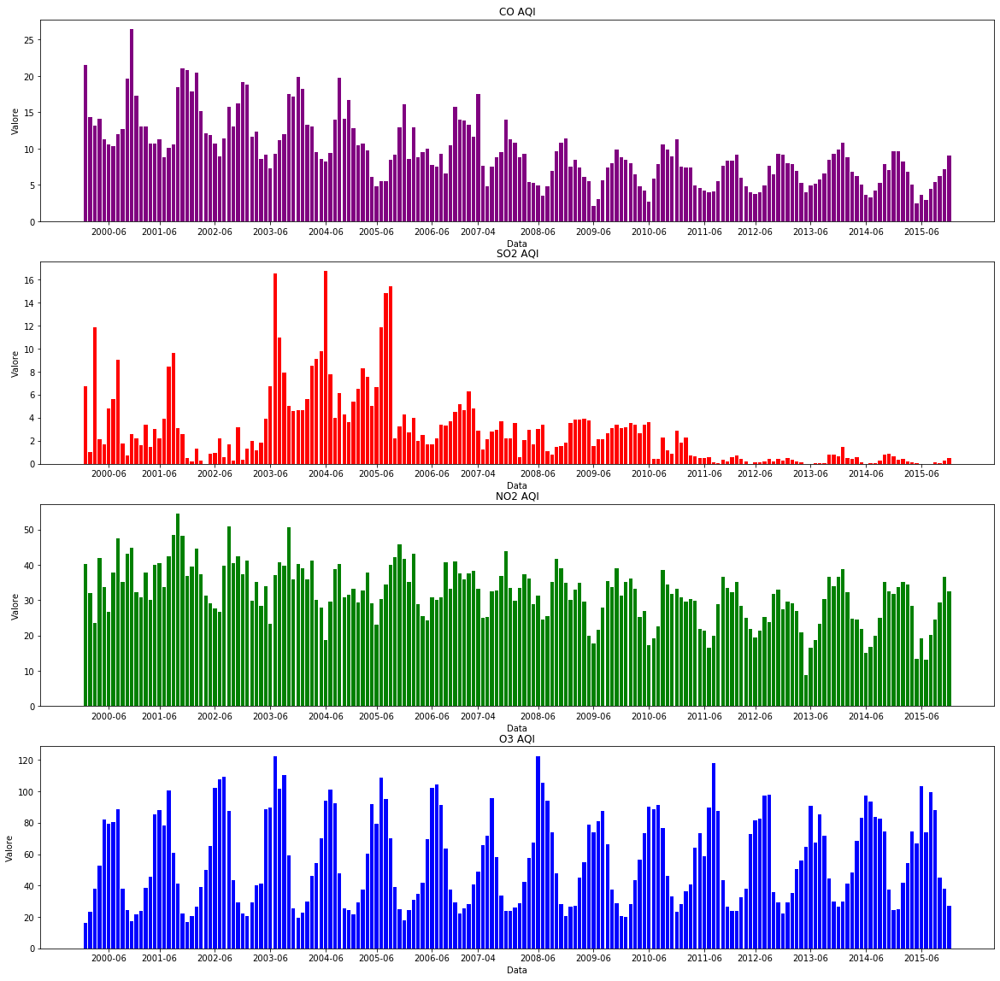

In [72]:
rubidoux_df_pd = rubidoux_df.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(rubidoux_df_pd['year_month'],
        rubidoux_df_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-04','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax2.bar(rubidoux_df_pd['year_month'],
        rubidoux_df_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-04','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax3.bar(rubidoux_df_pd['year_month'],
        rubidoux_df_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-04','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax4.bar(rubidoux_df_pd['year_month'],
        rubidoux_df_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-04','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

plt.show()

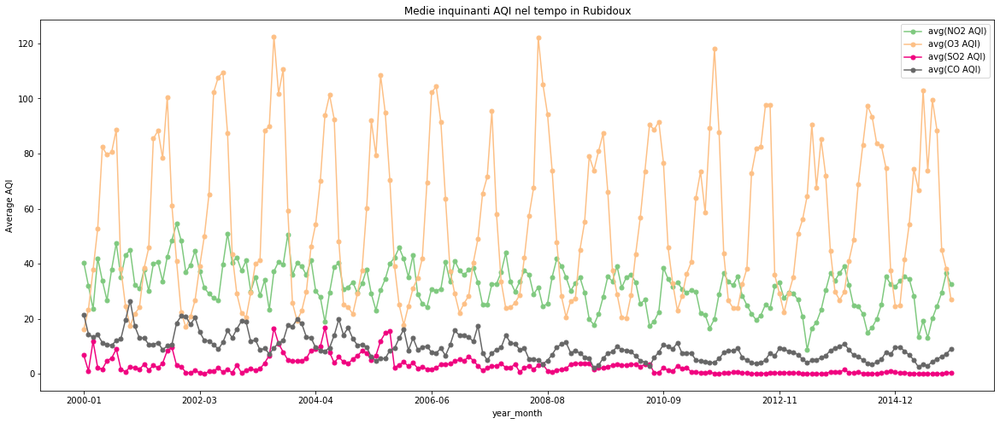

In [73]:
# Plot the aggregate decrease of all pollutants - RUBIDOUX
rubidoux_df_mean = rubidoux_df.select("*"
                                     ).sort('year_month')
rubidoux_df_mean_pd = rubidoux_df_mean.toPandas()

f, ax = plt.subplots(figsize=[20,8])
rubidoux_df_mean_pd.plot(x='year_month',
                         colormap='Accent',
                         marker='.',
                         markersize=10,
                         ax=ax,
                         linewidth=1.5)
ax.set_title('Medie inquinanti AQI nel tempo in Rubidoux')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### LOS ANGELES

In [74]:
losangeles_df = cal_df.select(['City','Date Local','NO2 AQI',
                               'O3 AQI', 'SO2 AQI', 'CO AQI']
                             ).where(cal_df['City'] =='Los Angeles')

losangeles_df = losangeles_df.sort('Date Local')

In [75]:
losangeles_dfs = losangeles_df.withColumn('year',
                                          split(losangeles_df['Date Local'], '-'
                                               ).getItem(0))

losangeles_dfs = losangeles_dfs.withColumn('month',
                                           split(losangeles_df['Date Local'], '-'
                                                ).getItem(1))

losangeles_dfs= losangeles_dfs.withColumn('year_month',
                                          sf.concat(sf.col('year'),
                                                    sf.lit('-'),
                                                    sf.col('month')))

losangeles_dfs = losangeles_dfs.select('year_month','NO2 AQI',
                                       'O3 AQI','SO2 AQI','CO AQI'
                                      ).sort('year_month'
                                            ).groupby('year_month'
                                                     ).mean()
losangeles_dfs.show()

+----------+-----------------+------------------+------------------+------------------+
|year_month|     avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+-----------------+------------------+------------------+------------------+
|   2000-03|54.74193548387097|29.096774193548388| 4.419354838709677|19.032258064516128|
|   2000-04|             62.8|35.233333333333334| 4.133333333333334|15.933333333333334|
|   2000-05|56.38709677419355| 50.96774193548387| 6.741935483870968|13.225806451612904|
|   2000-06|             50.9|              42.8|3.1333333333333333|11.133333333333333|
|   2000-07|50.67741935483871|39.935483870967744| 7.064516129032258| 12.67741935483871|
|   2000-08|60.32258064516129| 47.16129032258065| 8.193548387096774|16.419354838709676|
|   2000-09|61.86666666666667|              33.7|               4.6| 9.533333333333333|
|   2000-10|55.41935483870968|26.580645161290324| 5.193548387096774|17.129032258064516|
|   2000-11|             67.4|14

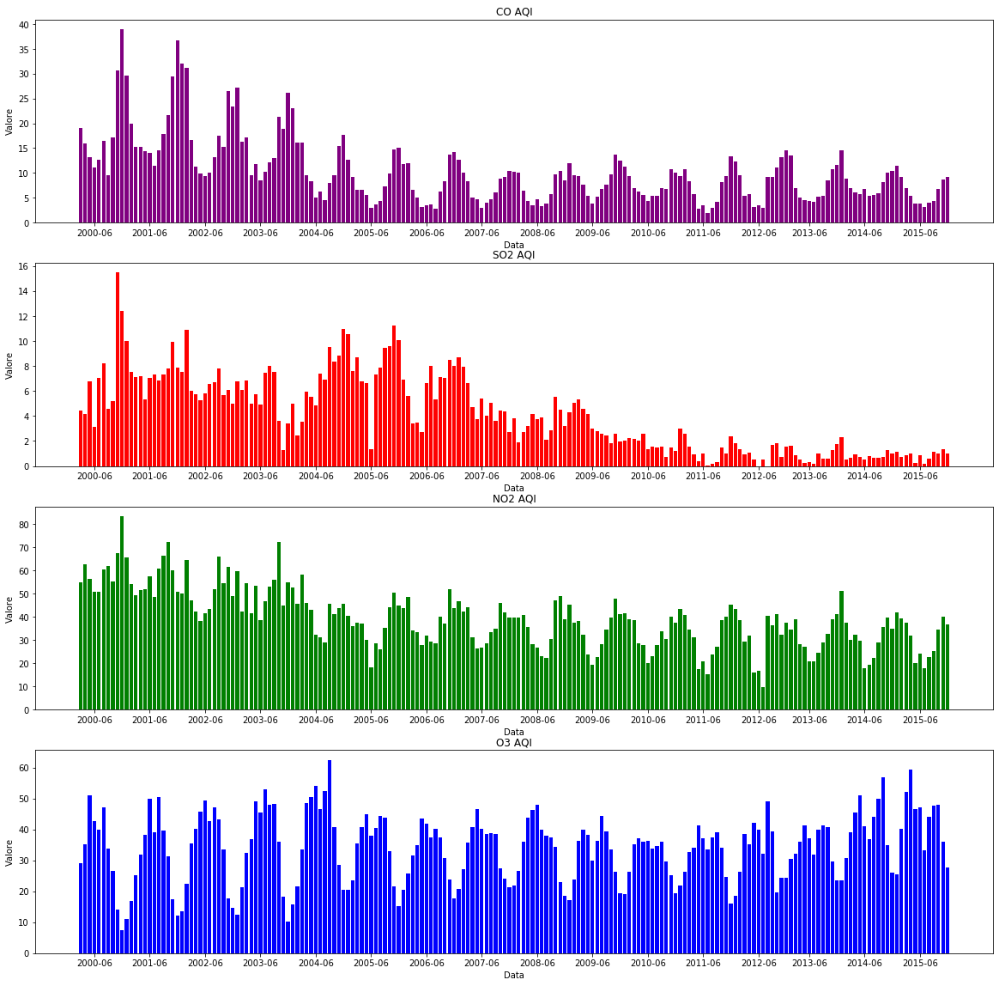

In [76]:
losangeles_dfs_pd = losangeles_dfs.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax2.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax3.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax4.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

plt.show()

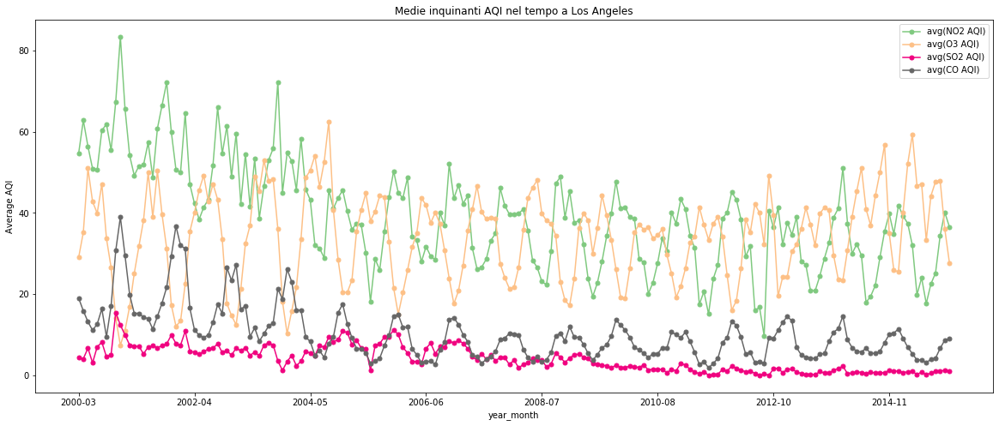

In [77]:
# Plot the aggregate decrease of all pollutants - LOS ANGELES
LAmean_poll = losangeles_dfs.select("*"
                                   ).sort('year_month')
LAmean_poll_pd = LAmean_poll.toPandas()

f, ax = plt.subplots(figsize=[20,8])
LAmean_poll_pd.plot(x='year_month',
                    colormap='Accent',
                    marker='.',
                    markersize=10,
                    ax=ax,
                    linewidth=1.5)
ax.set_title('Medie inquinanti AQI nel tempo a Los Angeles')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### CONCORD

In [78]:
concord_df = cal_df.select(['City','Date Local','NO2 AQI',
                            'O3 AQI', 'SO2 AQI', 'CO AQI']
                          ).where(cal_df['City'] =='Concord')

concord_df = concord_df.sort('Date Local')

In [79]:
concord_df = concord_df.withColumn('year',
                                   split(concord_df['Date Local'], '-'
                                        ).getItem(0))

concord_df = concord_df.withColumn('month',
                                   split(concord_df['Date Local'], '-'
                                        ).getItem(1))

concord_df= concord_df.withColumn('year_month',
                                  sf.concat(sf.col('year'),
                                            sf.lit('-'),
                                            sf.col('month')))

concord_df = concord_df.select('year_month','NO2 AQI',
                               'O3 AQI', 'SO2 AQI', 'CO AQI'
                              ).sort('year_month'
                                    ).groupby('year_month'
                                             ).mean()

concord_df.show()

+----------+------------------+------------------+------------------+------------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+------------------+------------------+------------------+------------------+
|   2000-01|29.419354838709676|15.483870967741936| 3.935483870967742|16.129032258064516|
|   2000-02| 28.06896551724138| 24.75862068965517| 4.310344827586207|12.586206896551724|
|   2000-03|28.580645161290324| 31.06451612903226| 5.838709677419355| 8.580645161290322|
|   2000-04|23.466666666666665| 33.96666666666667| 5.033333333333333| 7.466666666666667|
|   2000-05|22.225806451612904| 38.96774193548387| 5.161290322580645| 6.903225806451613|
|   2000-06| 23.37037037037037| 35.55555555555556| 6.037037037037037| 7.111111111111111|
|   2000-07|16.483870967741936|29.258064516129032| 4.580645161290323| 6.225806451612903|
|   2000-08|22.516129032258064| 37.61290322580645| 4.870967741935484| 7.096774193548387|
|   2000-09|31.333333

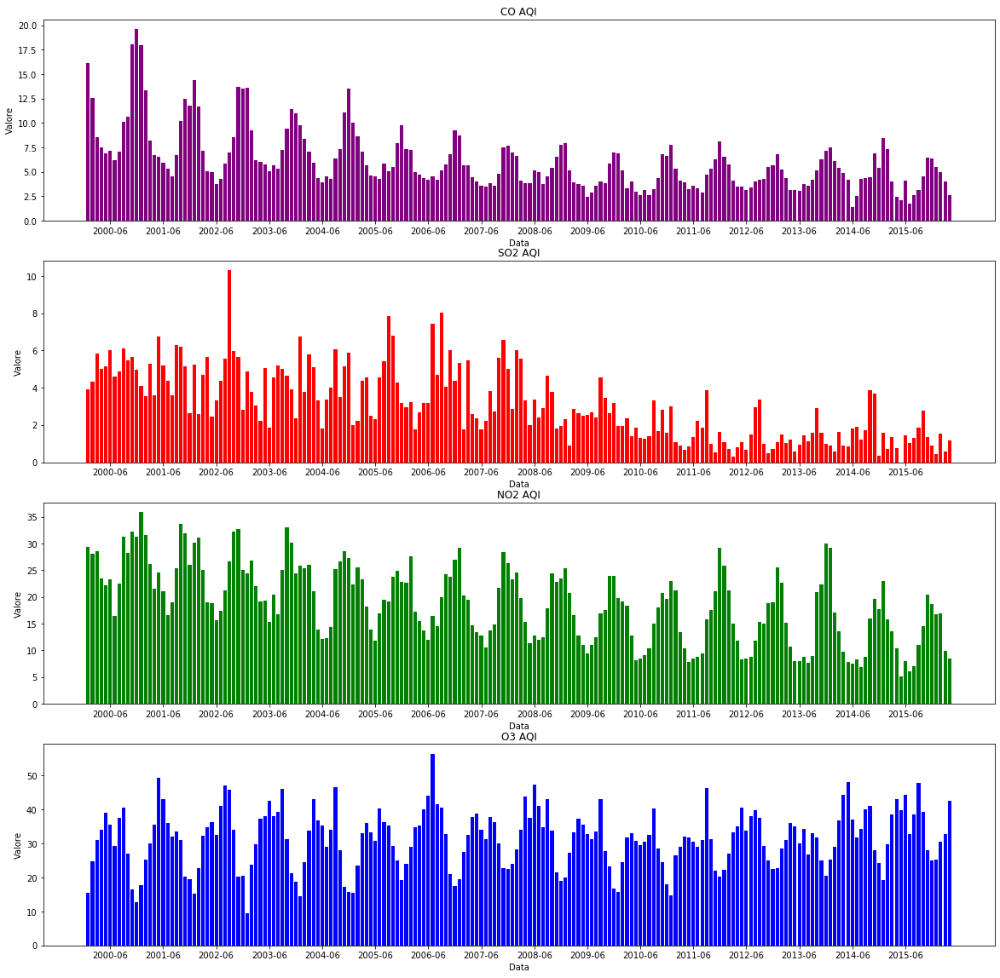

In [80]:
concord_df_pd = concord_df.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(concord_df_pd['year_month'],
        concord_df_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax2.bar(concord_df_pd['year_month'],
        concord_df_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax3.bar(concord_df_pd['year_month'],
        concord_df_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax4.bar(concord_df_pd['year_month'],
        concord_df_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

plt.show()

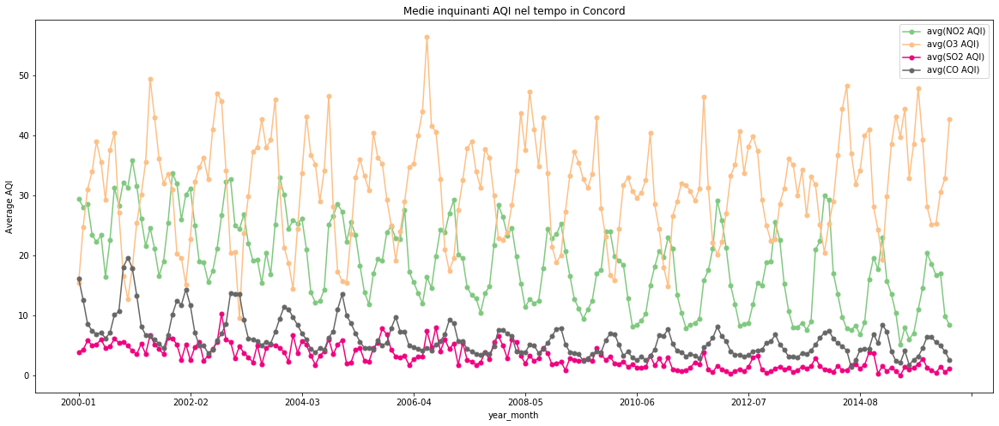

In [81]:
# Plot the aggregate decrease of all pollutants -CONCORD
concord_df_poll = concord_df.select("*"
                                   ).sort('year_month')
concord_df_poll_pd = concord_df_poll.toPandas()

f, ax = plt.subplots(figsize=[20,8])
concord_df_poll_pd.plot(x='year_month',
                        colormap='Accent',
                        marker='.',
                        markersize=10,
                        ax=ax,
                        linewidth=1.5)
ax.set_title('Medie inquinanti AQI nel tempo in Concord')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### SAN FRANCISCO - (era interessante osservarne i valori)

In [82]:
santfr_df = cal_df.select(['City','Date Local','NO2 AQI',
                           'O3 AQI', 'SO2 AQI', 'CO AQI']
                         ).where(cal_df['City'] =='San Francisco')

santfr_df = santfr_df.sort('Date Local')

In [83]:
santfr_df = santfr_df.withColumn('year',
                                 split(santfr_df['Date Local'], '-'
                                      ).getItem(0))

santfr_df = santfr_df.withColumn('month',
                                 split(santfr_df['Date Local'], '-'
                                      ).getItem(1))

santfr_df= santfr_df.withColumn('year_month',
                                sf.concat(sf.col('year'),
                                          sf.lit('-'),
                                          sf.col('month')))

santfr_df = santfr_df.select('year_month','NO2 AQI',
                             'O3 AQI','SO2 AQI','CO AQI'
                            ).sort('year_month'
                                  ).groupby('year_month'
                                           ).mean()

santfr_df.show()

+----------+------------------+------------------+------------------+------------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+------------------+------------------+------------------+------------------+
|   2000-01| 36.03225806451613| 13.64516129032258| 6.483870967741935|15.838709677419354|
|   2000-02|35.793103448275865| 20.96551724137931| 4.896551724137931|12.586206896551724|
|   2000-03|              35.0| 24.70967741935484| 6.548387096774194| 11.32258064516129|
|   2000-04|              30.5|28.433333333333334| 4.666666666666667| 9.066666666666666|
|   2000-05|27.612903225806452|              26.0| 5.129032258064516| 8.258064516129032|
|   2000-06| 21.20689655172414|22.551724137931036| 4.827586206896552| 7.862068965517241|
|   2000-07| 13.64516129032258| 16.06451612903226|3.2580645161290325| 5.612903225806452|
|   2000-08| 21.29032258064516|17.483870967741936| 4.387096774193548| 7.935483870967742|
|   2000-09| 33.93103

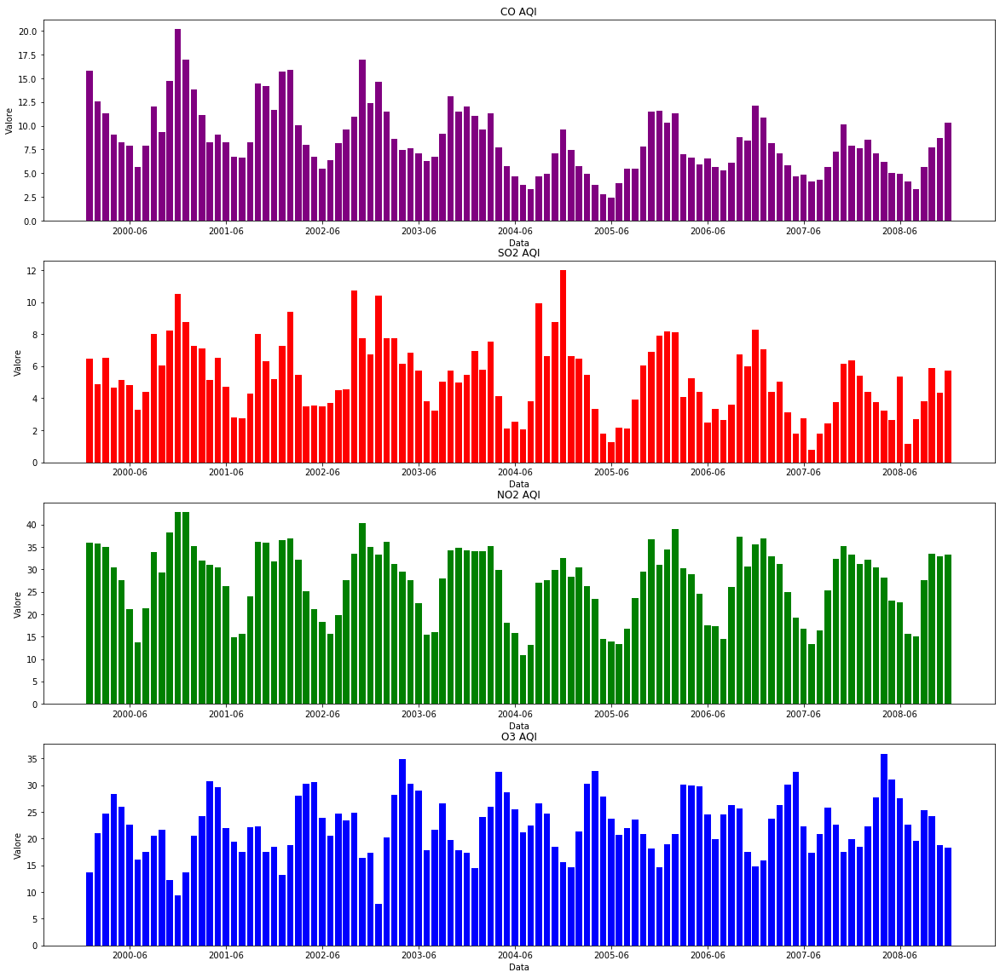

In [84]:
santfr_df_pd = santfr_df.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(santfr_df_pd['year_month'],
        santfr_df_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06'])

ax2.bar(santfr_df_pd['year_month'],
        santfr_df_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06'])

ax3.bar(santfr_df_pd['year_month'],
        santfr_df_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06'])

ax4.bar(santfr_df_pd['year_month'],
        santfr_df_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06'])

plt.show()

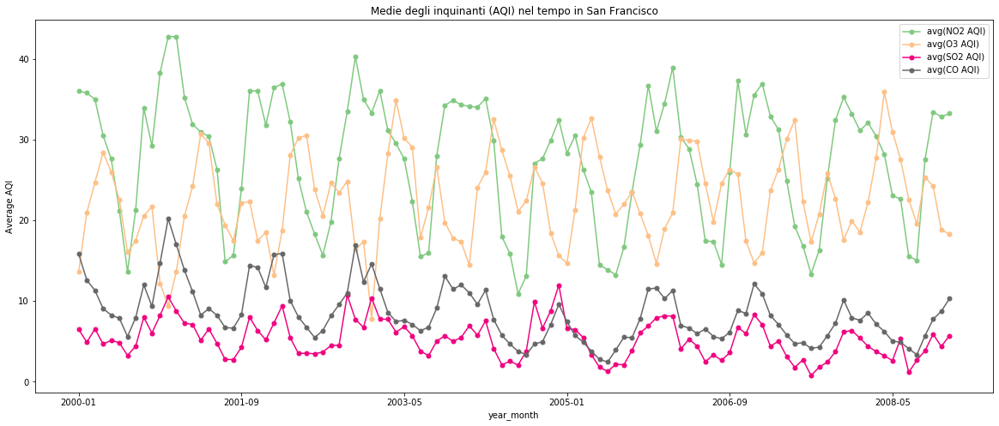

In [85]:
# Plot the aggregate decrease of all pollutants -SAN FRANCISCO
santfr_df_poll = santfr_df.select("*"
                                 ).sort('year_month')
santfr_df_poll_pd = santfr_df_poll.toPandas()

f, ax = plt.subplots(figsize=[20,8])
santfr_df_poll_pd.plot(x='year_month',
                       colormap='Accent',
                       marker='.',
                       markersize=10,
                       ax=ax,
                       linewidth=1.5)
ax.set_title('Medie degli inquinanti (AQI) nel tempo in San Francisco')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### FONTANA - (scelta perchè è una delle top inquinanti per O3)

In [86]:
fontana_df = cal_df.select(['City','Date Local','NO2 AQI',
                            'O3 AQI', 'SO2 AQI', 'CO AQI']
                          ).where(cal_df['City'] =='Fontana')

fontana_df = fontana_df.sort('Date Local')

In [87]:
fontana_df = fontana_df.withColumn('year',
                                   split(fontana_df['Date Local'], '-'
                                        ).getItem(0))

fontana_df = fontana_df.withColumn('month',
                                   split(fontana_df['Date Local'], '-'
                                        ).getItem(1))

fontana_df= fontana_df.withColumn('year_month',
                                  sf.concat(sf.col('year'),
                                            sf.lit('-'),
                                            sf.col('month')))

fontana_df = fontana_df.select('year_month','NO2 AQI',
                               'O3 AQI','SO2 AQI','CO AQI'
                              ).sort('year_month'
                                    ).groupby('year_month'
                                             ).mean()

fontana_df.show()

+----------+------------------+------------------+------------------+-----------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|      avg(CO AQI)|
+----------+------------------+------------------+------------------+-----------------+
|   2008-01|27.142857142857142|25.464285714285715| 2.607142857142857|7.964285714285714|
|   2008-02| 29.93103448275862|29.655172413793103|2.4827586206896552| 8.89655172413793|
|   2008-03| 38.83870967741935| 40.74193548387097|3.7096774193548385| 8.03225806451613|
|   2008-04|31.266666666666666|              57.3| 2.433333333333333|5.933333333333334|
|   2008-05| 39.74193548387097| 64.80645161290323|2.6774193548387095|5.612903225806452|
|   2008-06|              36.1|119.33333333333333| 4.633333333333334|6.866666666666666|
|   2008-07|43.645161290322584|103.48387096774194| 4.870967741935484|6.709677419354839|
|   2008-08| 33.61290322580645| 90.38709677419355| 4.645161290322581|              7.0|
|   2008-09|29.133333333333333| 

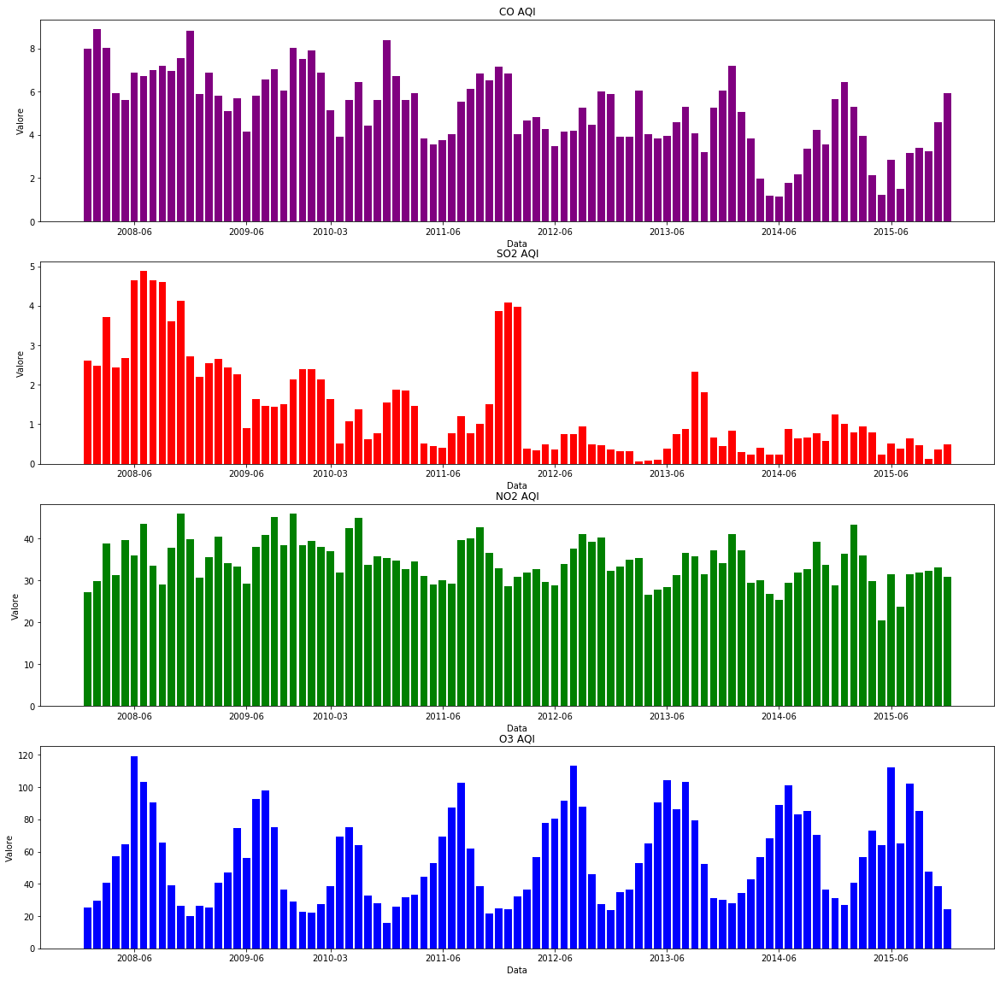

In [88]:
fontana_df_pd = fontana_df.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(fontana_df_pd['year_month'],
        fontana_df_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2008-06','2009-06','2010-03',
                '2011-06','2012-06','2013-06',
                '2014-06','2015-06'])

ax2.bar(fontana_df_pd['year_month'],
        fontana_df_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2008-06','2009-06','2010-03',
                '2011-06','2012-06','2013-06',
                '2014-06','2015-06'])

ax3.bar(fontana_df_pd['year_month'],
        fontana_df_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2008-06','2009-06','2010-03',
                '2011-06','2012-06','2013-06',
                '2014-06','2015-06'])

ax4.bar(fontana_df_pd['year_month'],
        fontana_df_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2008-06','2009-06','2010-03',
                '2011-06','2012-06','2013-06',
                '2014-06','2015-06'])

plt.show()

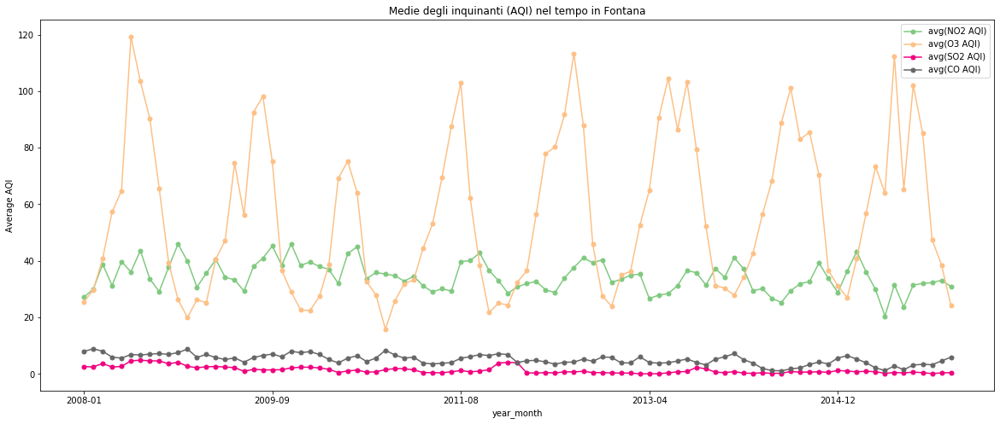

In [89]:
# Plot the aggregate decrease of all pollutants -FONTANA
fontana_df_poll = fontana_df.select("*"
                                   ).sort('year_month')
fontana_df_poll_pd = fontana_df_poll.toPandas()

f, ax = plt.subplots(figsize=[20,8])
fontana_df_poll_pd.plot(x='year_month',
                        colormap='Accent',
                        marker='.',
                        markersize=10,
                        ax=ax,
                        linewidth=1.5)
ax.set_title('Medie degli inquinanti (AQI) nel tempo in Fontana')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### SAN DIEGO

In [90]:
sandiego_df = cal_df.select(['City', 'Date Local', 'NO2 AQI',
                             'O3 AQI', 'SO2 AQI', 'CO AQI']
                           ).where(cal_df['City'] =='San Diego')

sandiego_df = sandiego_df.sort('Date Local')

In [91]:
sandiego_dfs = sandiego_df.withColumn('year',
                                      split(sandiego_df['Date Local'], '-'
                                           ).getItem(0))

sandiego_dfs = sandiego_dfs.withColumn('month',
                                       split(sandiego_df['Date Local'], '-'
                                            ).getItem(1))

sandiego_dfs= sandiego_dfs.withColumn('year_month',
                                      sf.concat(sf.col('year'),
                                                sf.lit('-'),
                                                sf.col('month')))

sandiego_dfs = sandiego_dfs.select('year_month','NO2 AQI',
                                   'O3 AQI','SO2 AQI','CO AQI'
                                  ).sort('year_month'
                                        ).groupby('year_month'
                                                 ).mean()

sandiego_dfs.show()

+----------+------------------+------------------+------------------+------------------+
|year_month|      avg(NO2 AQI)|       avg(O3 AQI)|      avg(SO2 AQI)|       avg(CO AQI)|
+----------+------------------+------------------+------------------+------------------+
|   2000-01| 48.95161290322581|18.532258064516128| 10.32258064516129| 29.64516129032258|
|   2000-02| 40.54385964912281|26.526315789473685|  9.75438596491228| 19.57894736842105|
|   2000-03|41.549019607843135|  32.6078431372549| 9.588235294117647|17.098039215686274|
|   2000-04|             35.25| 35.96666666666667| 9.233333333333333|             17.35|
|   2000-05|             28.25| 35.93333333333333|             11.15|             10.65|
|   2000-06| 24.71186440677966|31.593220338983052| 8.169491525423728| 9.627118644067796|
|   2000-07|              23.0|27.571428571428573|10.428571428571429| 7.089285714285714|
|   2000-08|30.327868852459016|26.983606557377048| 14.40983606557377|11.639344262295081|
|   2000-09| 36.61666

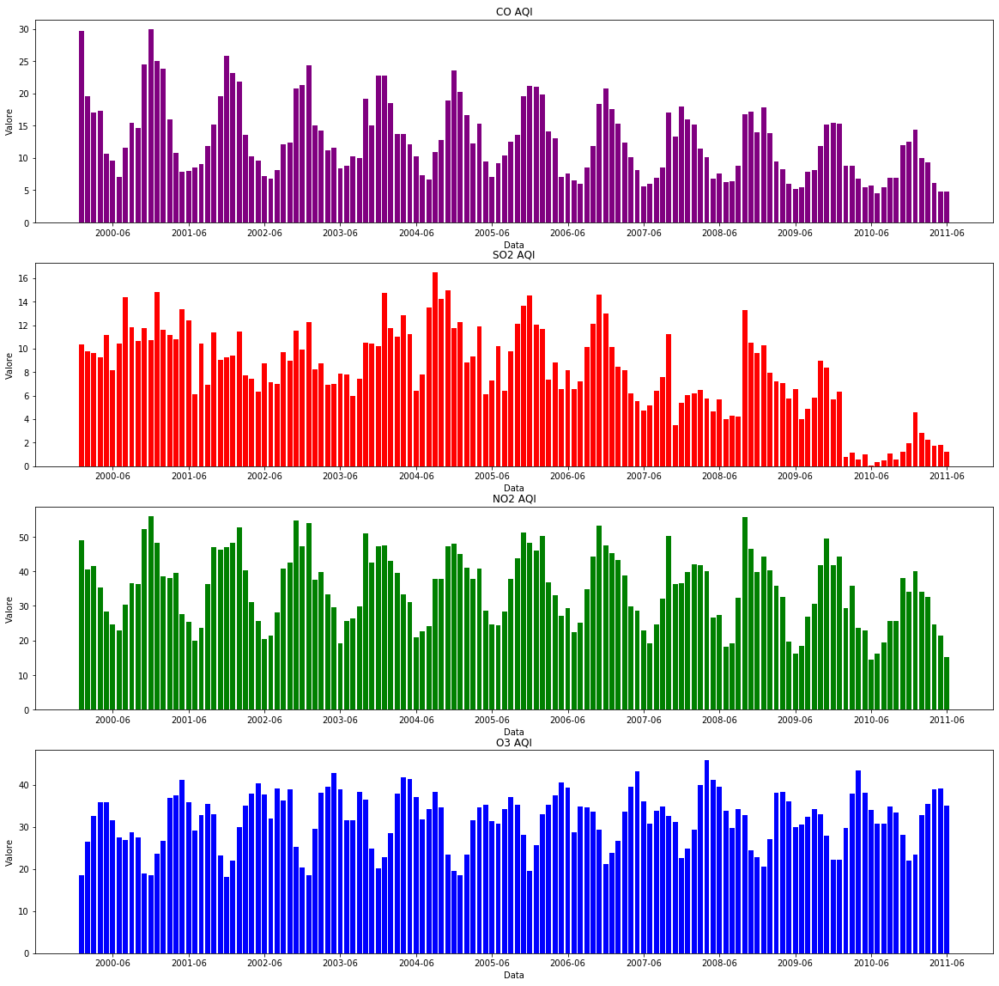

In [92]:
sandiego_dfs_pd = sandiego_dfs.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(CO AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06'])

ax2.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(SO2 AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06'])

ax3.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(NO2 AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06'])

ax4.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(O3 AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06'])

plt.show()

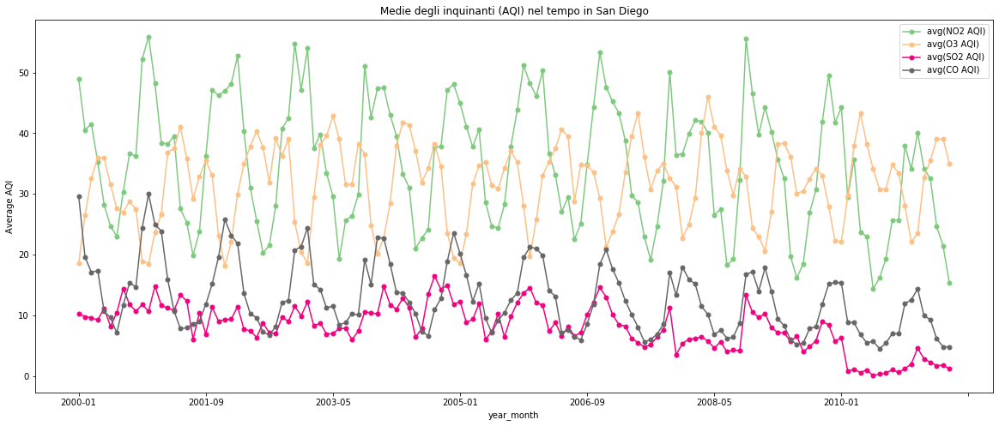

In [93]:
# Plot the aggregate decrease of all pollutants -SAN DIEGO
sandiego_dfs_poll = sandiego_dfs.select("*"
                                       ).sort('year_month')
sandiego_dfs_poll_pd = sandiego_dfs_poll.toPandas()

f, ax = plt.subplots(figsize=[20,8])
sandiego_dfs_poll_pd.plot(x='year_month',
                          colormap='Accent', 
                          marker='.', 
                          markersize=10, 
                          ax=ax, 
                          linewidth=1.5)
ax.set_title('Medie degli inquinanti (AQI) nel tempo in San Diego')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

# OCCHIO I GRAFICI VENGONO UN PO STRANI! I VALORI PLOTTATI NON CORRISPONDONO ALLE DATE SULLE X

### Comparison of pollutants between top 4 cities in CA : O3 

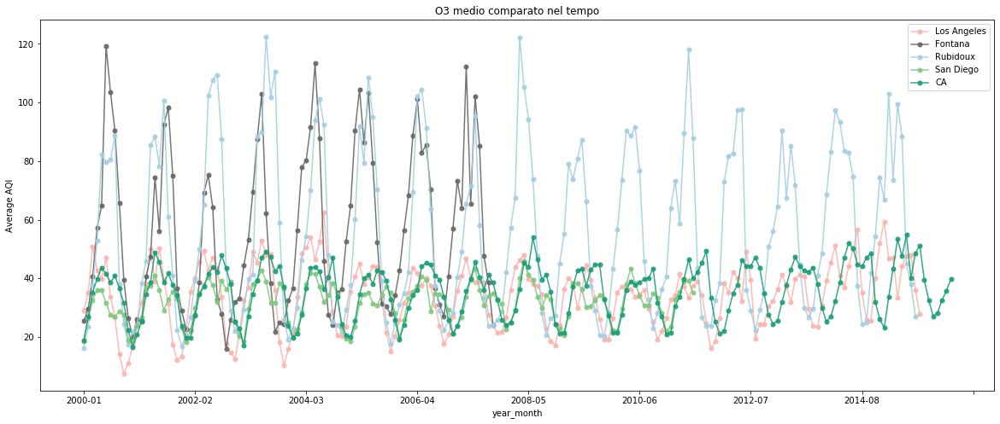

In [94]:
graphs=[losangeles_dfs_pd,
        fontana_df_pd,
        rubidoux_df_pd,
        sandiego_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'Fontana', 'Rubidoux', 'San Diego', "CA"]

color = ['Pastel1', 'Dark2_r', 'Paired', 'Accent', 'Dark2']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(O3 AQI)",
               colormap=color[gg],
               marker='.',
               alpha=0.9,
               markersize=10,
               ax=ax,
               linewidth=1.5,
               label=str(labels[gg]))

ax.set_title('O3 medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### Comparison of pollutants between top 4 cities in CA : SO2

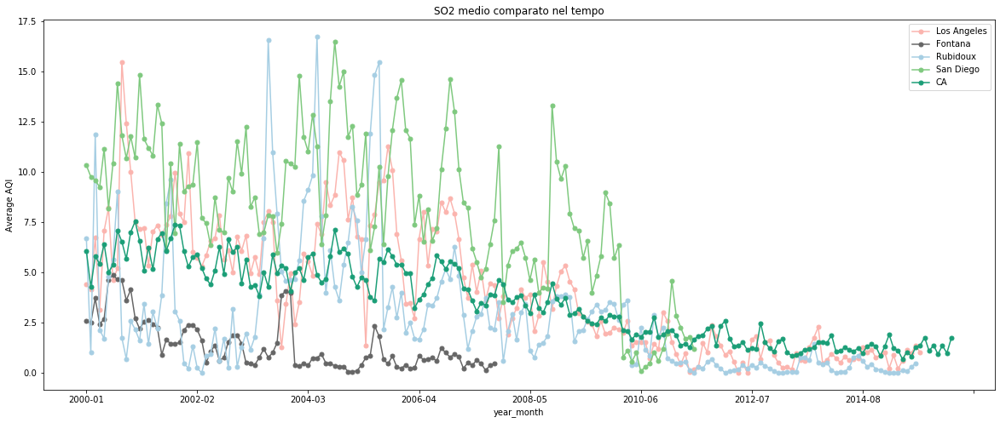

In [95]:
graphs=[losangeles_dfs_pd,
        fontana_df_pd,
        rubidoux_df_pd,
        sandiego_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'Fontana', 'Rubidoux', 'San Diego', "CA"]

color = ['Pastel1', 'Dark2_r', 'Paired', 'Accent', 'Dark2']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(SO2 AQI)",
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               linewidth=1.5,
               label=str(labels[gg]))

ax.set_title('SO2 medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### Comparison of pollutants between top 4 cities in CA : CO

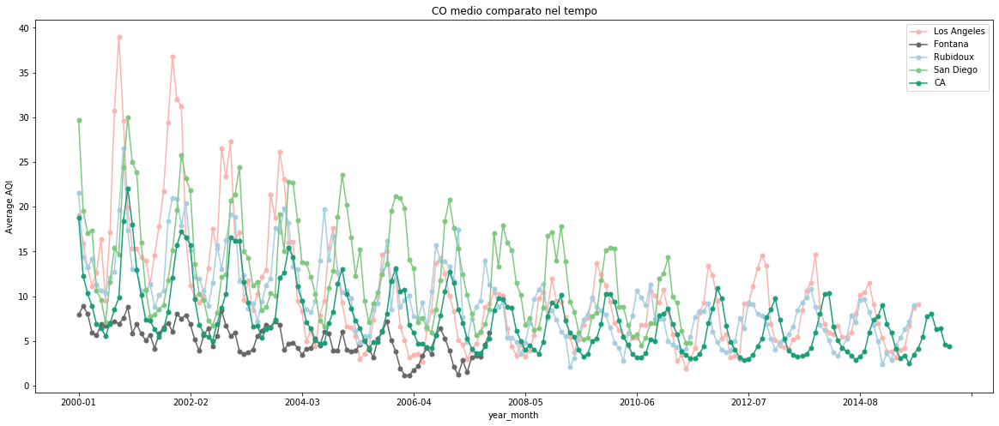

In [96]:
graphs=[losangeles_dfs_pd,
        fontana_df_pd,
        rubidoux_df_pd,
        sandiego_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'Fontana', 'Rubidoux', 'San Diego', "CA"]

color = ['Pastel1', 'Dark2_r', 'Paired', 'Accent', 'Dark2']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(CO AQI)",
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               linewidth=1.5,
               label=str(labels[gg]))

ax.set_title('CO medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### Comparison of pollutants between top 4 cities in CA : NO2

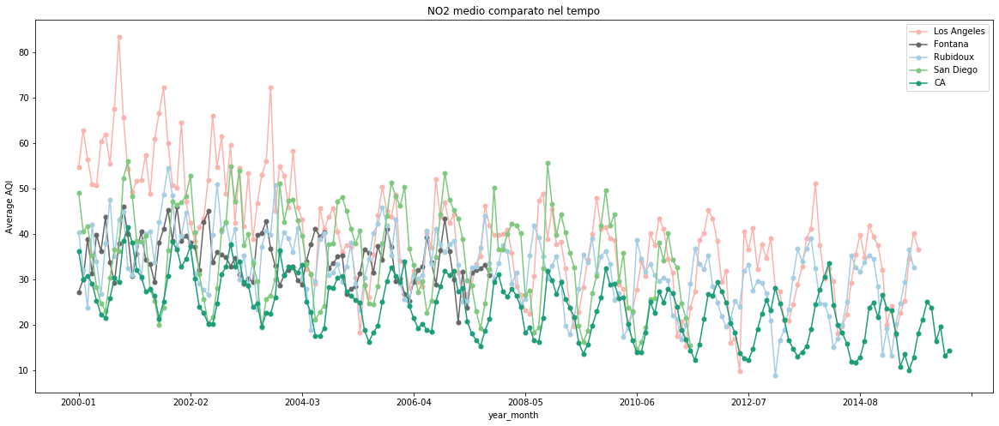

In [97]:
graphs=[losangeles_dfs_pd,
        fontana_df_pd,
        rubidoux_df_pd,
        sandiego_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'Fontana', 'Rubidoux', 'San Diego', "CA"]

color = ['Pastel1', 'Dark2_r', 'Paired', 'Accent', 'Dark2']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    #grid = grid_dict[gg]
    graph.plot(x="year_month",
               y="avg(NO2 AQI)",
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               linewidth=1.5,
               label=str(labels[gg]))

ax.set_title('NO2 medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

# Analisi delle variazioni degli inquinanti

In [98]:
kdd_df_var = kdd_df.select(['Site Num', 'Date Local', 'State', 'City', 'County',
                            'NO2 Mean', 'O3 Mean', 'SO2 Mean', 'CO Mean',
                            'NO2 1st Max Value', 'O3 1st Max Value', 'SO2 1st Max Value',
                            'CO 1st Max Value', 'NO2 AQI', 'O3 AQI', 'SO2 AQI', 'CO AQI'])

kdd_df_var.show()

+--------+----------+----------+-----------+---------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
|Site Num|Date Local|     State|       City|   County| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|
+--------+----------+----------+-----------+---------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
|       1|2000-05-13|California|Chula Vista|San Diego|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|
|       1|2000-05-13|California|Chula Vista|San Diego|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|    61|    3.0|  11.0|
|       1|2000-05-13|California|Chula Vi

In [99]:
# aggiungo colonna anno, mese, giorno
kdd_df_var = kdd_df_var.withColumn('year',
                                   split(kdd_df_var['Date Local'], '-'
                                        ).getItem(0))

kdd_df_var = kdd_df_var.withColumn('month',
                                   split(kdd_df_var['Date Local'], '-'
                                        ).getItem(1))

kdd_df_var = kdd_df_var.withColumn('day',
                                   split(kdd_df_var['Date Local'], '-'
                                        ).getItem(2))

kdd_df_var.show()

+--------+----------+----------+-----------+---------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+---+
|Site Num|Date Local|     State|       City|   County| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|year|month|day|
+--------+----------+----------+-----------+---------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+---+
|       1|2000-05-13|California|Chula Vista|San Diego|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|2000|   05| 13|
|       1|2000-05-13|California|Chula Vista|San Diego|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|   

droppo i duplicati in base al sensore, alla data e al valore di CO registrato (ma potrebbe essere anche SO2, NO2 o O3)

In [100]:
from pyspark.sql.functions import lag, lit, to_timestamp

In [101]:
kdd_df_var = kdd_df_var.dropDuplicates(['Site Num', 'County', 'year',
                                        'month','day', 'CO AQI']
                                      ).sort('Site Num', 'Date Local')

In [102]:
kdd_df_var.count()

432400

In [103]:
kdd_df_var = kdd_df_var.withColumnRenamed('Site Num', 'SiteNum')

In [104]:
kdd_df_var.select('Date Local', 'City',
                  'County', 'SiteNum','CO AQI'
                 ).filter(kdd_df_var.County == 'San Diego'
                         ).orderBy('Date Local'
                                  ).show(50)

+----------+-----------+---------+-------+------+
|Date Local|       City|   County|SiteNum|CO AQI|
+----------+-----------+---------+-------+------+
|2000-01-01|Chula Vista|San Diego|      1|   9.0|
|2000-01-01|  San Diego|San Diego|   1007|  17.0|
|2000-01-01|  San Diego|San Diego|   2007|  11.0|
|2000-01-02|  San Diego|San Diego|   1007|  20.0|
|2000-01-02|Chula Vista|San Diego|      1|  10.0|
|2000-01-02|  San Diego|San Diego|   2007|  10.0|
|2000-01-03|  San Diego|San Diego|   1007|  30.0|
|2000-01-03|  San Diego|San Diego|   2007|  23.0|
|2000-01-03|Chula Vista|San Diego|      1|  20.0|
|2000-01-04|Chula Vista|San Diego|      1|  22.0|
|2000-01-04|  San Diego|San Diego|   1007|  34.0|
|2000-01-04|  San Diego|San Diego|   2007|  28.0|
|2000-01-05|  San Diego|San Diego|   2007|  27.0|
|2000-01-05|  San Diego|San Diego|   1007|  41.0|
|2000-01-05|Chula Vista|San Diego|      1|  24.0|
|2000-01-06|  San Diego|San Diego|   1007|  39.0|
|2000-01-06|  San Diego|San Diego|   2007|  32.0|


Siccome in alcune contee vi sono alcuni sensori che si riferiscono differenti città, non essendo interessati a distinguere ulteriormente, andiamo a calcolare una media del valore a livello di contea allo. Successivamente verrano droppato le righe duplicate.

In [105]:
w2 = Window().partitionBy('Date Local', 'County'
                         ).orderBy('Date Local')

In [106]:
kdd_df_var = kdd_df_var.withColumn('CO AQI',
                            when(kdd_df_var.County == kdd_df_var.County,
                            (avg('CO AQI').over(w2))
                                                ).otherwise(col('CO AQI'))) 

In [107]:
kdd_df_var = kdd_df_var.withColumn('SO2 AQI',
                            when(kdd_df_var.County == kdd_df_var.County,
                            (avg('SO2 AQI').over(w2))
                                                ).otherwise(col('SO2 AQI')))

In [108]:
kdd_df_var = kdd_df_var.withColumn('O3 AQI',
                            when(kdd_df_var.County == kdd_df_var.County,
                            (avg('O3 AQI').over(w2))
                                                ).otherwise(col('O3 AQI')))

In [109]:
kdd_df_var = kdd_df_var.withColumn('NO2 AQI',
                            when(kdd_df_var.County == kdd_df_var.County,
                            (avg('NO2 AQI').over(w2))
                                                ).otherwise(col('NO2 AQI')))

In [110]:
kdd_df_var = kdd_df_var.dropDuplicates(['Date Local', 'CO AQI', 'County'])

In [111]:
kdd_df_var.select('Date Local', 'City',
                  'County', 'SiteNum','CO AQI'
                 ).filter(kdd_df_var.County == 'San Diego'
                         ).orderBy('Date Local'
                                  ).show(20)

+----------+-----------+---------+-------+------------------+
|Date Local|       City|   County|SiteNum|            CO AQI|
+----------+-----------+---------+-------+------------------+
|2000-01-01|Chula Vista|San Diego|      1|12.333333333333334|
|2000-01-02|Chula Vista|San Diego|      1|13.333333333333334|
|2000-01-03|Chula Vista|San Diego|      1|24.333333333333332|
|2000-01-04|Chula Vista|San Diego|      1|              28.0|
|2000-01-05|Chula Vista|San Diego|      1|30.666666666666668|
|2000-01-06|Chula Vista|San Diego|      1|31.666666666666668|
|2000-01-07|Chula Vista|San Diego|      1|              30.0|
|2000-01-08|Chula Vista|San Diego|      1|29.666666666666668|
|2000-01-09|Chula Vista|San Diego|      1|              35.0|
|2000-01-10|Chula Vista|San Diego|      1|29.666666666666668|
|2000-01-11|Chula Vista|San Diego|      1|              31.0|
|2000-01-12|Chula Vista|San Diego|      1|28.666666666666668|
|2000-01-13|Chula Vista|San Diego|      1|              45.0|
|2000-01

In [112]:
kdd_df_var.count()

317074

Prendo solo i dati della California

In [113]:
cal_kdd_df_var = kdd_df_var.filter(kdd_df_var.State == 'California')

In [114]:
cal_kdd_df_var.count()

77894

### Variazione giornaliera CO AQI

Creo la finestra che mi servirà per il fill della colonna Variazione Giornaliera. Prendiamo in considerazione la contea e ordiniamo il tutto per la data.

In [115]:
w3 = Window().partitionBy('County'
                         ).orderBy('Date Local')

Vado dunque a sostituire i valori nulli con quella che è la differenza giornaliera delle osservazioni condizionata al numero del sensore e alla regione a cui fa riferimento

In [116]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_CO_AQI',
                                           (col('CO AQI')-lag('CO AQI',1).over(w3)))

Sostituisco i missing values rimasti nella colonna variazione Giornaliera (49) con il valore 0. Essi infatti rappresentano ogni punto di partenza della time series per ogni sensore (sarebbe giorno 01-01-2000 - giorno 31-12-1999)

In [117]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_CO_AQI',
                            when(col('Daily_variation_CO_AQI').isNull(), 0
                                ).otherwise(col('Daily_variation_CO_AQI'))) 

In [118]:
cal_kdd_df_var.select('Date Local', 'City','County',
                      'SiteNum','CO AQI','Daily_variation_CO_AQI'
                     ).filter(cal_kdd_df_var.County == 'San Diego'
                             ).orderBy('Date Local'
                                      ).show(20)

+----------+-----------+---------+-------+------------------+----------------------+
|Date Local|       City|   County|SiteNum|            CO AQI|Daily_variation_CO_AQI|
+----------+-----------+---------+-------+------------------+----------------------+
|2000-01-01|Chula Vista|San Diego|      1|12.333333333333334|                   0.0|
|2000-01-02|Chula Vista|San Diego|      1|13.333333333333334|                   1.0|
|2000-01-03|Chula Vista|San Diego|      1|24.333333333333332|    10.999999999999998|
|2000-01-04|Chula Vista|San Diego|      1|              28.0|     3.666666666666668|
|2000-01-05|Chula Vista|San Diego|      1|30.666666666666668|     2.666666666666668|
|2000-01-06|Chula Vista|San Diego|      1|31.666666666666668|                   1.0|
|2000-01-07|Chula Vista|San Diego|      1|              30.0|   -1.6666666666666679|
|2000-01-08|Chula Vista|San Diego|      1|29.666666666666668|  -0.33333333333333215|
|2000-01-09|Chula Vista|San Diego|      1|              35.0|    

### Variazione giornaliera SO2 AQI

Ripetiamo i soliti procedimenti implementati prima

In [119]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_SO2_AQI',
                                           (col('SO2 AQI')-lag('SO2 AQI',1).over(w3)))

In [120]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_SO2_AQI',
                            when(col('Daily_variation_SO2_AQI').isNull(), 0
                                ).otherwise(col('Daily_variation_SO2_AQI')))

In [121]:
cal_kdd_df_var.select('Date Local', 'City','County',
                      'SiteNum','SO2 AQI','Daily_variation_SO2_AQI'
                     ).filter(cal_kdd_df_var.County == 'San Diego'
                             ).orderBy('Date Local'
                                      ).show(20)

+----------+-----------+---------+-------+------------------+-----------------------+
|Date Local|       City|   County|SiteNum|           SO2 AQI|Daily_variation_SO2_AQI|
+----------+-----------+---------+-------+------------------+-----------------------+
|2000-01-01|Chula Vista|San Diego|      1|3.6666666666666665|                    0.0|
|2000-01-02|Chula Vista|San Diego|      1|3.6666666666666665|                    0.0|
|2000-01-03|Chula Vista|San Diego|      1|               7.0|     3.3333333333333335|
|2000-01-04|Chula Vista|San Diego|      1|               8.0|                    1.0|
|2000-01-05|Chula Vista|San Diego|      1|               8.0|                    0.0|
|2000-01-06|Chula Vista|San Diego|      1|               7.0|                   -1.0|
|2000-01-07|Chula Vista|San Diego|      1|              15.0|                    8.0|
|2000-01-08|Chula Vista|San Diego|      1| 9.666666666666666|     -5.333333333333334|
|2000-01-09|Chula Vista|San Diego|      1|12.666666666

### Variazione giornaliera NO2 AQI

Ripetiamo i soliti procedimenti implementati prima

In [122]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_NO2_AQI',
                                           (col('NO2 AQI')-lag('NO2 AQI',1).over(w3)))

In [123]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_NO2_AQI',
                            when(col('Daily_variation_NO2_AQI').isNull(), 0
                                ).otherwise(col('Daily_variation_NO2_AQI')))

### Variazione giornaliera O3 AQI

Ripetiamo i soliti procedimenti implementati prima

In [124]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_O3_AQI',
                                           (col('O3 AQI')-lag('O3 AQI',1).over(w3))) 

In [125]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Daily_variation_O3_AQI',
                            when(col('Daily_variation_O3_AQI').isNull(), 0
                                ).otherwise(col('Daily_variation_O3_AQI'))) 

### PLOT DELLE VARIAZIONI GIORNALIERE MEDIE IN UN MESE: CALIFORNIA

In [126]:
california_df_var = cal_kdd_df_var.select(['State', 'year', 'Date Local', 'month',
                                           'Daily_Variation_CO_AQI', 'Daily_Variation_SO2_AQI',
                                           'Daily_Variation_NO2_AQI', 'Daily_Variation_O3_AQI'])

california_df_seas = california_df_var.withColumn('year_month',
                                                   sf.concat(sf.col('year'),
                                                   sf.lit('-'), 
                                                   sf.col('month')))

california_df_seas = california_df_seas.select('year_month','Daily_Variation_CO_AQI',
                                               'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                               'Daily_Variation_O3_AQI'
                                              ).sort('year_month'
                                                    ).groupby('year_month'
                                                             ).mean()

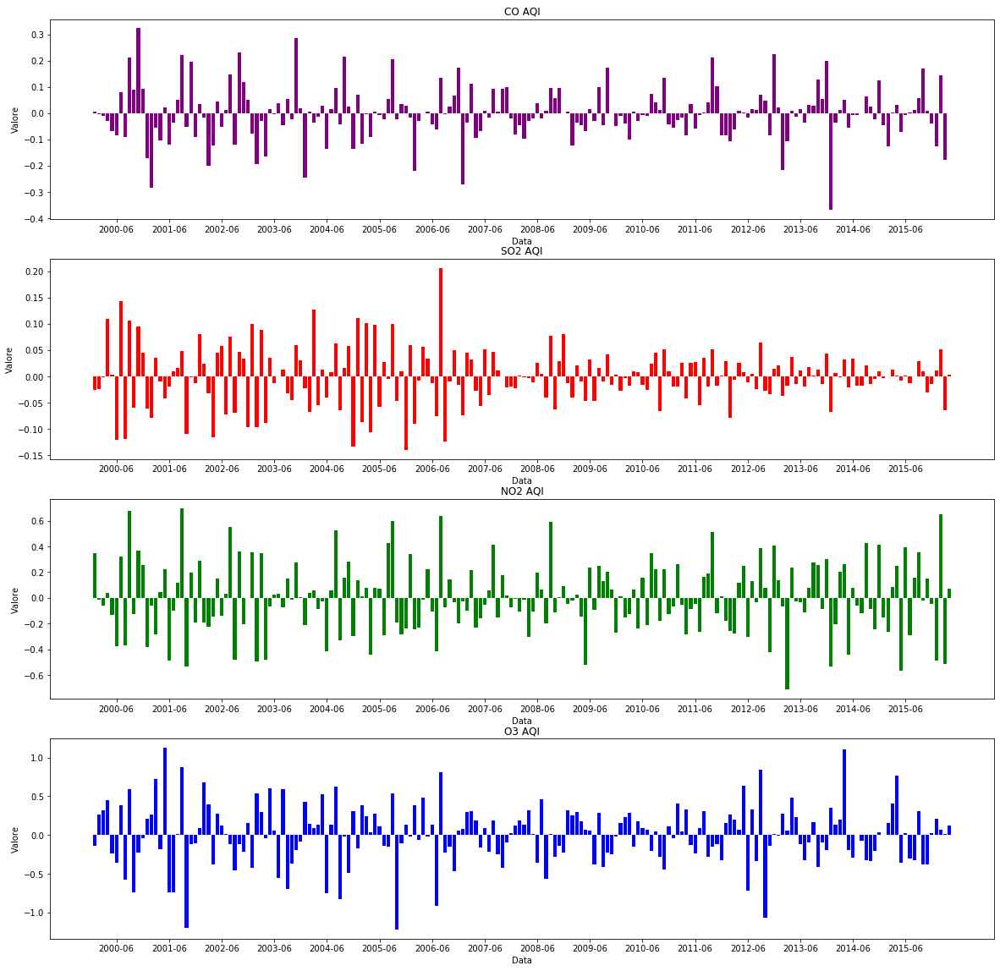

In [127]:
california_df_seas_pd = california_df_seas.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(california_df_seas_pd['year_month'],
        california_df_seas_pd['avg(Daily_Variation_CO_AQI)'],
        color = 'purple')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax2.bar(california_df_seas_pd['year_month'],
        california_df_seas_pd['avg(Daily_Variation_SO2_AQI)'],
        color = 'red')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax3.bar(california_df_seas_pd['year_month'],
        california_df_seas_pd['avg(Daily_Variation_NO2_AQI)'],
        color = 'green')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

ax4.bar(california_df_seas_pd['year_month'],
        california_df_seas_pd['avg(Daily_Variation_O3_AQI)'],
        color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-06','2015-06'])

plt.show()

### PLOT DELLE VARIAZIONI GIORNALIERE MEDIE IN UN MESE : SAN DIEGO

In [128]:
sandiego_df_var = cal_kdd_df_var.select(['County','year', 'Date Local',
                                         'month','Daily_Variation_CO_AQI',
                                         'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                         'Daily_Variation_O3_AQI']
                                       ).where(cal_kdd_df_var['County'] =='San Diego')

sandiego_df_var = sandiego_df_var.withColumn('year_month',
                                             sf.concat(sf.col('year'),
                                                       sf.lit('-'),
                                                       sf.col('month')))

sandiego_df_var = sandiego_df_var.select('year_month','Daily_Variation_CO_AQI',
                                         'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                         'Daily_Variation_O3_AQI'
                                        ).sort('year_month'
                                              ).groupby('year_month'
                                                       ).mean()

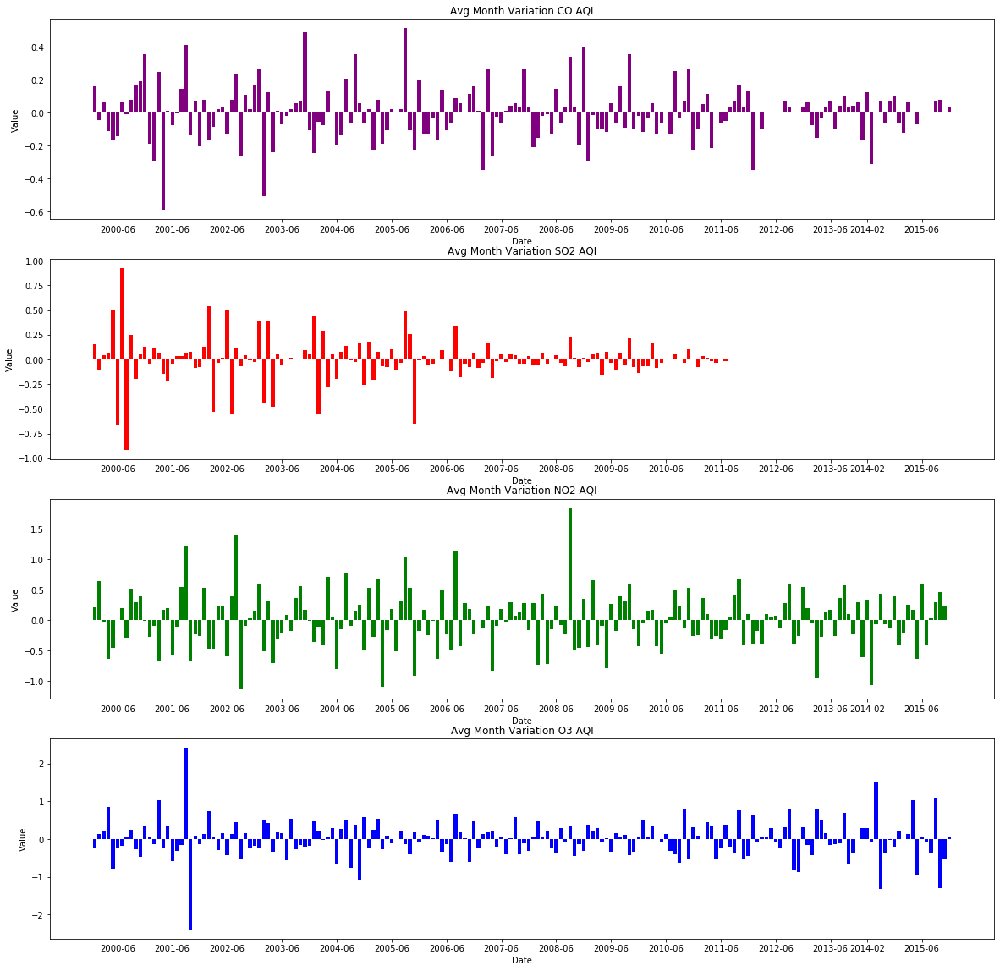

In [129]:
sandiego_dfs_pd = sandiego_df_var.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Date')
    ax.set(ylabel='Value')

ax1.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(Daily_Variation_CO_AQI)'],
        color = 'purple')
ax1.set_title('Avg Month Variation CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax2.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(Daily_Variation_SO2_AQI)'],
        color = 'red')
ax2.set_title('Avg Month Variation SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax3.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(Daily_Variation_NO2_AQI)'],
        color = 'green')
ax3.set_title('Avg Month Variation NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax4.bar(sandiego_dfs_pd['year_month'],
        sandiego_dfs_pd['avg(Daily_Variation_O3_AQI)'],
        color = 'blue')
ax4.set_title('Avg Month Variation O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

plt.show()

### PLOT DELLE VARIAZIONI GIORNALIERE MEDIE IN UN MESE : LOS ANGELES

In [130]:
losangeles_df_var = cal_kdd_df_var.select(['County','year', 'Date Local',
                                           'month','Daily_Variation_CO_AQI',
                                           'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                           'Daily_Variation_O3_AQI']
                                         ).where(cal_kdd_df_var['County'] =='Los Angeles')

losangeles_df_var = losangeles_df_var.withColumn('year_month',
                                                 sf.concat(sf.col('year'),
                                                           sf.lit('-'),
                                                           sf.col('month')))

losangeles_df_var = losangeles_df_var.select('year_month','Daily_Variation_CO_AQI',
                                             'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                             'Daily_Variation_O3_AQI'
                                            ).sort('year_month'
                                                  ).groupby('year_month'
                                                           ).mean()

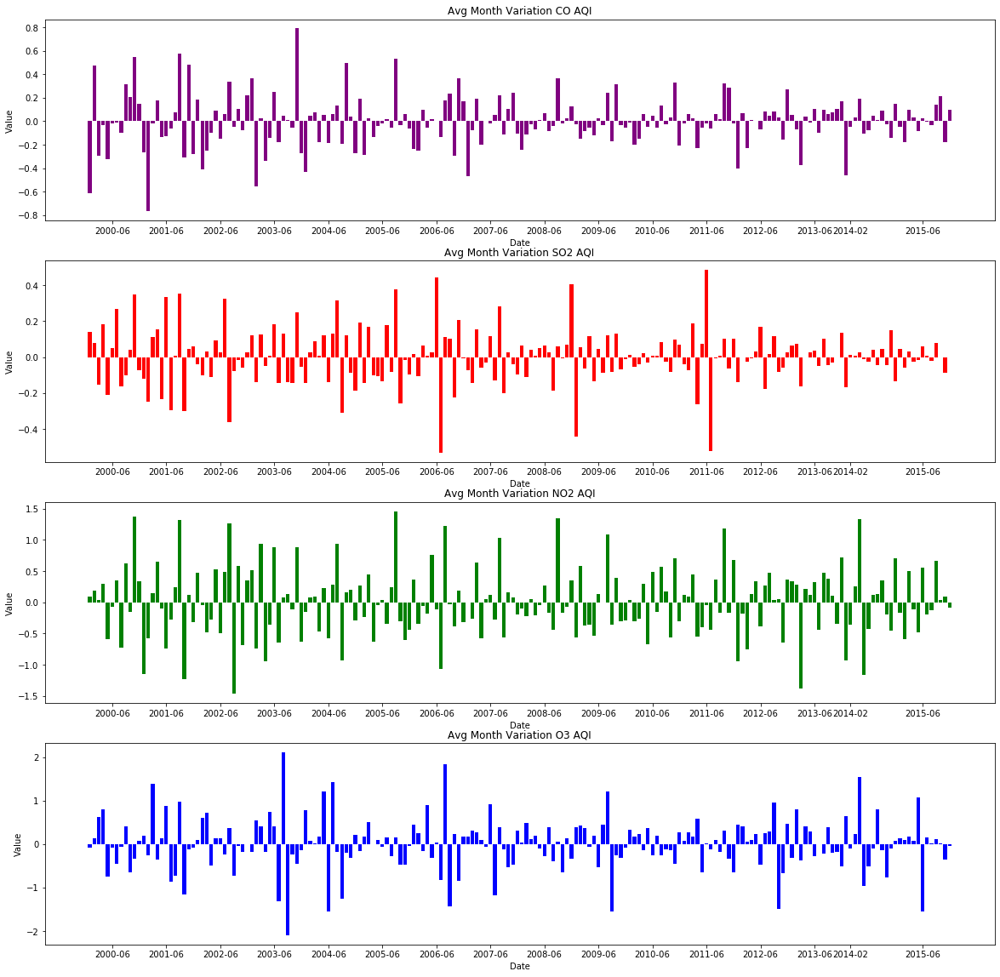

In [131]:
losangeles_dfs_pd = losangeles_df_var.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Date')
    ax.set(ylabel='Value')

ax1.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(Daily_Variation_CO_AQI)'],
        color = 'purple')
ax1.set_title('Avg Month Variation CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax2.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(Daily_Variation_SO2_AQI)'],
        color = 'red')
ax2.set_title('Avg Month Variation SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax3.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(Daily_Variation_NO2_AQI)'],
        color = 'green')
ax3.set_title('Avg Month Variation NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax4.bar(losangeles_dfs_pd['year_month'],
        losangeles_dfs_pd['avg(Daily_Variation_O3_AQI)'],
        color = 'blue')
ax4.set_title('Avg Month Variation O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

plt.show()

### PLOT DELLE VARIAZIONI GIORNALIERE MEDIE IN UN MESE : SANTA BARBARA

In [132]:
santabarbara_df_var = cal_kdd_df_var.select(['County','year', 'Date Local',
                                             'month','Daily_Variation_CO_AQI',
                                             'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                             'Daily_Variation_O3_AQI']
                                         ).where(cal_kdd_df_var['County'] =='Santa Barbara')

santabarbara_df_var = santabarbara_df_var.withColumn('year_month',
                                                     sf.concat(sf.col('year'),
                                                               sf.lit('-'),
                                                               sf.col('month')))

santabarbara_df_var = santabarbara_df_var.select('year_month','Daily_Variation_CO_AQI',
                                                 'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                                 'Daily_Variation_O3_AQI'
                                                ).sort('year_month'
                                                      ).groupby('year_month'
                                                               ).mean()

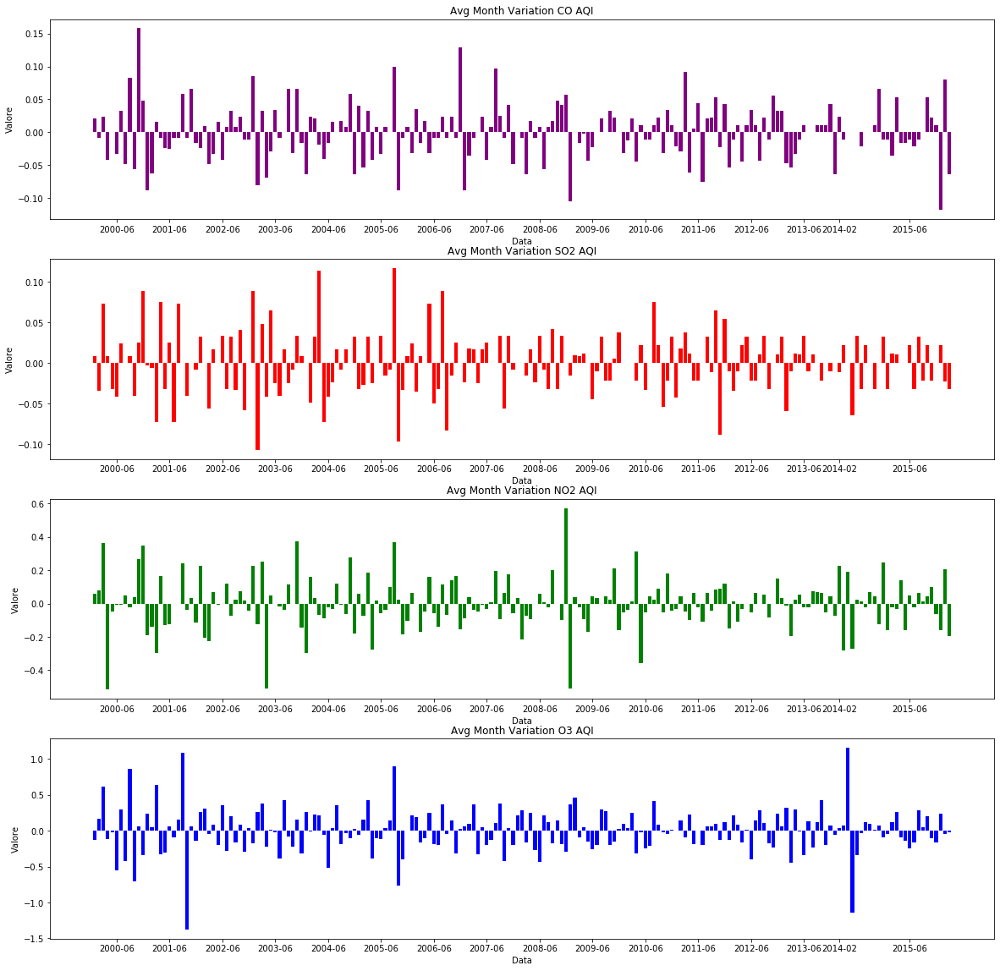

In [133]:
santabarbara_dfs_pd = santabarbara_df_var.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(santabarbara_dfs_pd['year_month'],
        santabarbara_dfs_pd['avg(Daily_Variation_CO_AQI)'],
        color = 'purple')
ax1.set_title('Avg Month Variation CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax2.bar(santabarbara_dfs_pd['year_month'],
        santabarbara_dfs_pd['avg(Daily_Variation_SO2_AQI)'],
        color = 'red')
ax2.set_title('Avg Month Variation SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06', 
                '2012-06','2013-06','2014-02','2015-06'])

ax3.bar(santabarbara_dfs_pd['year_month'],
        santabarbara_dfs_pd['avg(Daily_Variation_NO2_AQI)'],
        color = 'green')
ax3.set_title('Avg Month Variation NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax4.bar(santabarbara_dfs_pd['year_month'],
        santabarbara_dfs_pd['avg(Daily_Variation_O3_AQI)'],
        color = 'blue')
ax4.set_title('Avg Month Variation O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

plt.show()

### PLOT DELLE VARIAZIONI GIORNALIERE MEDIE IN UN MESE : CONTRA COSTA

In [134]:
contracosta_df_var = cal_kdd_df_var.select(['County','year', 'Date Local',
                                            'month','Daily_Variation_CO_AQI',
                                            'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                            'Daily_Variation_O3_AQI']
                                          ).where(cal_kdd_df_var['County'] =='Contra Costa')

contracosta_df_var = contracosta_df_var.withColumn('year_month',
                                                 sf.concat(sf.col('year'),
                                                           sf.lit('-'),
                                                           sf.col('month')))

contracosta_df_var = contracosta_df_var.select('year_month','Daily_Variation_CO_AQI',
                                             'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                             'Daily_Variation_O3_AQI'
                                            ).sort('year_month'
                                                  ).groupby('year_month'
                                                           ).mean()

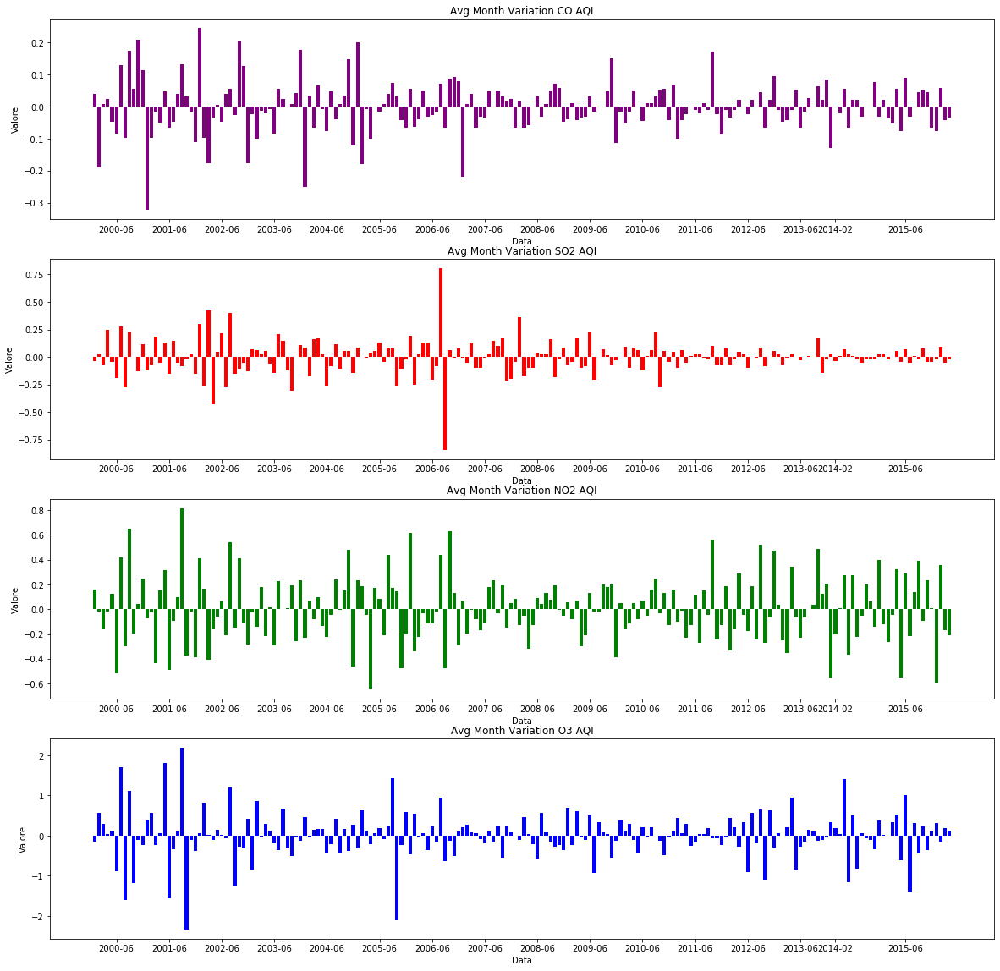

In [135]:
contracosta_dfs_pd = contracosta_df_var.toPandas()

fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20))
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Data')
    ax.set(ylabel='Valore')

ax1.bar(contracosta_dfs_pd['year_month'],
        contracosta_dfs_pd['avg(Daily_Variation_CO_AQI)'],
        color = 'purple')
ax1.set_title('Avg Month Variation CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax2.bar(contracosta_dfs_pd['year_month'],
        contracosta_dfs_pd['avg(Daily_Variation_SO2_AQI)'],
        color = 'red')
ax2.set_title('Avg Month Variation SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax3.bar(contracosta_dfs_pd['year_month'],
        contracosta_dfs_pd['avg(Daily_Variation_NO2_AQI)'],
        color = 'green')
ax3.set_title('Avg Month Variation NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

ax4.bar(contracosta_dfs_pd['year_month'],
        contracosta_dfs_pd['avg(Daily_Variation_O3_AQI)'],
        color = 'blue')
ax4.set_title('Avg Month Variation O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06',
                '2003-06','2004-06','2005-06',
                '2006-06','2007-06','2008-06',
                '2009-06','2010-06','2011-06',
                '2012-06','2013-06','2014-02','2015-06'])

plt.show()

# Confronto delle variazioni medie fra le varie contee con più osservazioni e la California

In [136]:
cal_df = cal_kdd_df_var.select([ 'State','County','Date Local',
                                  'year', 'month','Daily_Variation_CO_AQI',
                                  'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                                  'Daily_Variation_O3_AQI'])

In [137]:
cal_dfs_ym = cal_df.withColumn('year_month',
                               sf.concat(sf.col('year'),
                                         sf.lit('-'),
                                         sf.col('month')))

cal_dfs_ym = cal_dfs_ym.select('year_month', 'Daily_Variation_CO_AQI',
                               'Daily_Variation_SO2_AQI', 'Daily_Variation_NO2_AQI',
                               'Daily_Variation_O3_AQI'
                              ).sort('year_month'
                                    ).groupby('year_month'
                                             ).mean()

In [138]:
cal_dfs_pd = cal_dfs_ym.toPandas()

## O3

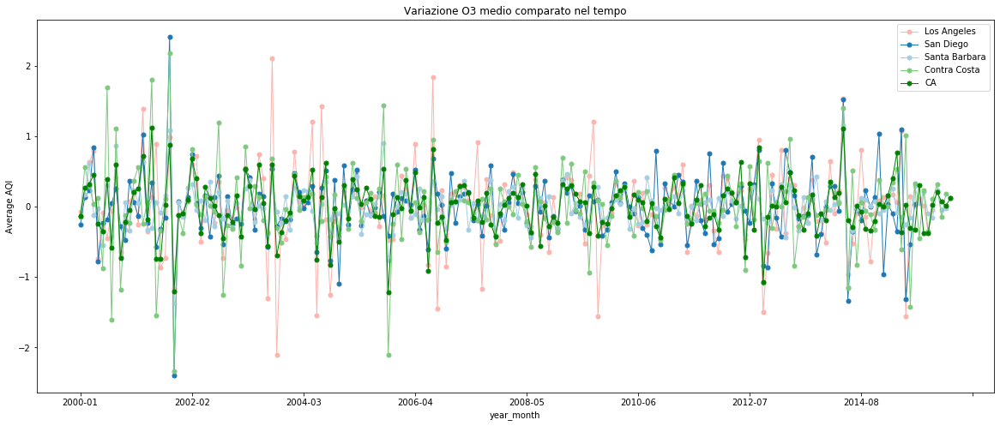

In [139]:
graphs=[losangeles_dfs_pd,
        sandiego_dfs_pd,
        santabarbara_dfs_pd,
        contracosta_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Daily_Variation_O3_AQI)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Variazione O3 medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### SO2

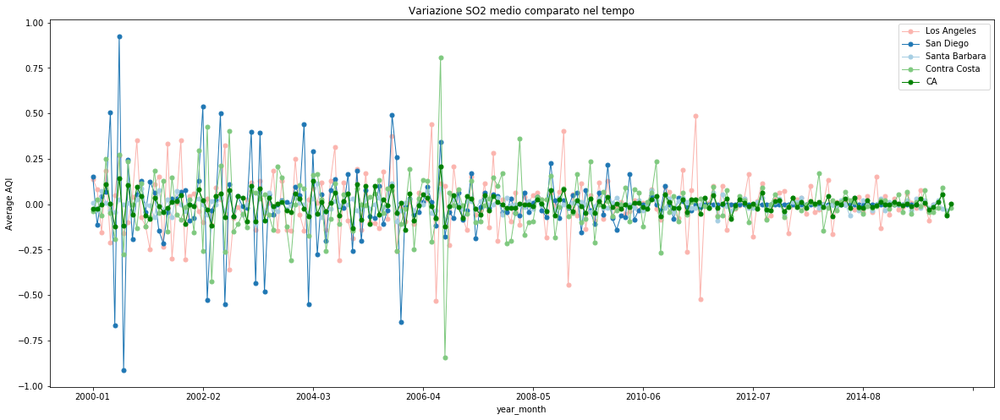

In [140]:
graphs=[losangeles_dfs_pd,
        sandiego_dfs_pd,
        santabarbara_dfs_pd,
        contracosta_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Daily_Variation_SO2_AQI)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Variazione SO2 medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### NO2

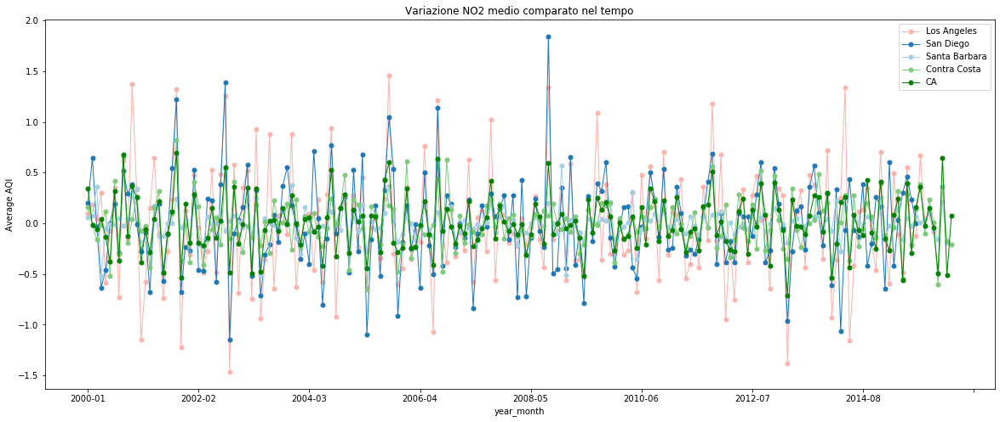

In [141]:
graphs=[losangeles_dfs_pd,
        sandiego_dfs_pd,
        santabarbara_dfs_pd,
        contracosta_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Daily_Variation_NO2_AQI)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Variazione NO2 medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### CO

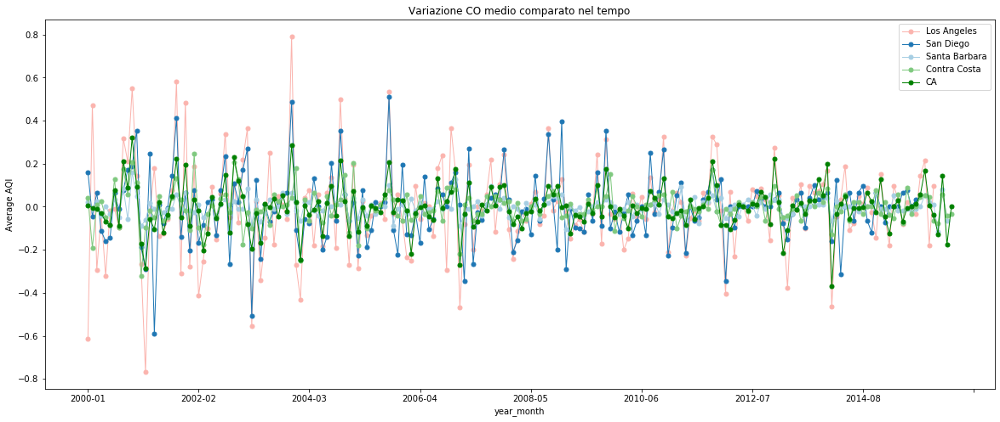

In [142]:
graphs=[losangeles_dfs_pd,
        sandiego_dfs_pd,
        santabarbara_dfs_pd,
        contracosta_dfs_pd,
        cal_dfs_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Daily_Variation_CO_AQI)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Variazione CO medio comparato nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average AQI")

plt.show()

### COSTRUZIONE DELLA COLONNA SOMMA DELLE VARIAZIONI (CUMULATA)

O3

In [143]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Cumulated_AQI_O3',
                                               sf.sum('Daily_variation_O3_AQI').over(w3))

SO2

In [144]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Cumulated_AQI_SO2',
                                               sf.sum('Daily_variation_SO2_AQI').over(w3))

CO

In [145]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Cumulated_AQI_CO',
                                               sf.sum('Daily_variation_CO_AQI').over(w3))

NO2

In [146]:
cal_kdd_df_var = cal_kdd_df_var.withColumn('Cumulated_AQI_NO2',
                                               sf.sum('Daily_variation_NO2_AQI').over(w3))

### COSTRUZIONE DATASET VISUALIZZAZIONE E COMPARAZIONE

In [147]:
### CALIFORNIA

california_df_cml = cal_kdd_df_var.select(['State', 'year', 'Date Local',
                                           'month', 'day', 'Cumulated_AQI_CO',
                                           'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                           'Cumulated_AQI_O3'])


california_df_cml = california_df_cml.withColumn('year_month',
                                                 sf.concat(sf.col('year'),
                                                           sf.lit('-'),
                                                           sf.col('month')))
california_df_cml = california_df_cml.select('year_month','Cumulated_AQI_CO',
                                             'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                             'Cumulated_AQI_O3'
                                            ).sort('year_month'
                                                  ).groupby('year_month'
                                                           ).mean()

california_cml_pd = california_df_cml.toPandas()


In [148]:
### SAN DIEGO

sandiego_df_cml = cal_kdd_df_var.select(['County','year', 'Date Local',
                                         'month','Cumulated_AQI_CO',
                                         'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                         'Cumulated_AQI_O3']
                                       ).where(cal_kdd_df_var['County'] =='San Diego')

sandiego_df_cml = sandiego_df_cml.sort('Date Local')

sandiego_df_cml= sandiego_df_cml.withColumn('year_month',
                                            sf.concat(sf.col('year'),
                                                      sf.lit('-'),
                                                      sf.col('month')))

sandiego_df_cml = sandiego_df_cml.select('year_month','Cumulated_AQI_CO',
                                         'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                         'Cumulated_AQI_O3'
                                        ).sort('year_month'
                                              ).groupby('year_month'
                                                       ).mean()

sandiego_cml_pd = sandiego_df_cml.toPandas()


In [149]:
### LOS ANGELES

losangeles_df_cml = cal_kdd_df_var.select(['County','year', 'Date Local',
                                           'month','Cumulated_AQI_CO',
                                           'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                           'Cumulated_AQI_O3']
                                         ).where(cal_kdd_df_var['County'] =='Los Angeles')

losangeles_df_cml = losangeles_df_cml.sort('Date Local')

losangeles_df_cml= losangeles_df_cml.withColumn('year_month',
                                                sf.concat(sf.col('year'),
                                                          sf.lit('-'),
                                                          sf.col('month')))

losangeles_df_cml = losangeles_df_cml.select('year_month','Cumulated_AQI_CO',
                                             'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                             'Cumulated_AQI_O3'
                                            ).sort('year_month'
                                                  ).groupby('year_month'
                                                           ).mean()
losangeles_cml_pd = losangeles_df_cml.toPandas()

In [150]:
### SANTA BARBARA

santabarbara_df_cml = cal_kdd_df_var.select(['County','year', 'Date Local',
                                             'month','Cumulated_AQI_CO',
                                             'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                             'Cumulated_AQI_O3']
                                           ).where(cal_kdd_df_var['County'] =='Santa Barbara')

santabarbara_df_cml = santabarbara_df_cml.sort('Date Local')

santabarbara_df_cml= santabarbara_df_cml.withColumn('year_month',
                                                    sf.concat(sf.col('year'),
                                                              sf.lit('-'),
                                                              sf.col('month')))

santabarbara_df_cml = santabarbara_df_cml.select('year_month','Cumulated_AQI_CO',
                                                 'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                                 'Cumulated_AQI_O3'
                                                ).sort('year_month'
                                                      ).groupby('year_month'
                                                               ).mean()

santabarbara_cml_pd = santabarbara_df_cml.toPandas()

In [151]:
### CONTRA COSTA 

contracosta_df_cml = cal_kdd_df_var.select(['County','year', 'Date Local',
                                            'month','Cumulated_AQI_CO',
                                            'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                            'Cumulated_AQI_O3']
                                          ).where(cal_kdd_df_var['County'] =='Contra Costa')

contracosta_df_cml = contracosta_df_cml.sort('Date Local')

contracosta_df_cml= contracosta_df_cml.withColumn('year_month',
                                                  sf.concat(sf.col('year'),
                                                            sf.lit('-'),
                                                            sf.col('month')))

contracosta_df_cml = contracosta_df_cml.select('year_month','Cumulated_AQI_CO',
                                               'Cumulated_AQI_SO2', 'Cumulated_AQI_NO2',
                                               'Cumulated_AQI_O3'
                                              ).sort('year_month'
                                                    ).groupby('year_month'
                                                             ).mean()

contracosta_cml_pd = contracosta_df_cml.toPandas()

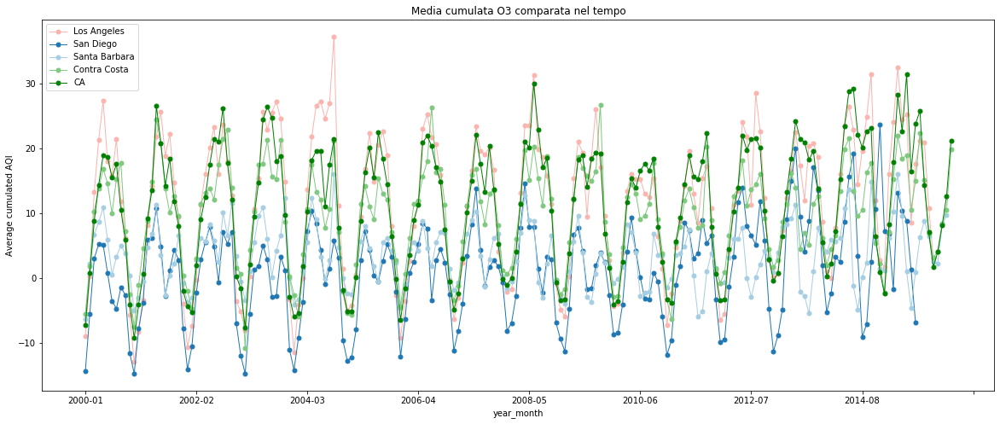

In [152]:
graphs=[losangeles_cml_pd,
        sandiego_cml_pd,
        santabarbara_cml_pd,
        contracosta_cml_pd,
        california_cml_pd,
        ]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA", 'Imperial']

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Cumulated_AQI_O3)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Media cumulata O3 comparata nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average cumulated AQI")

plt.show()

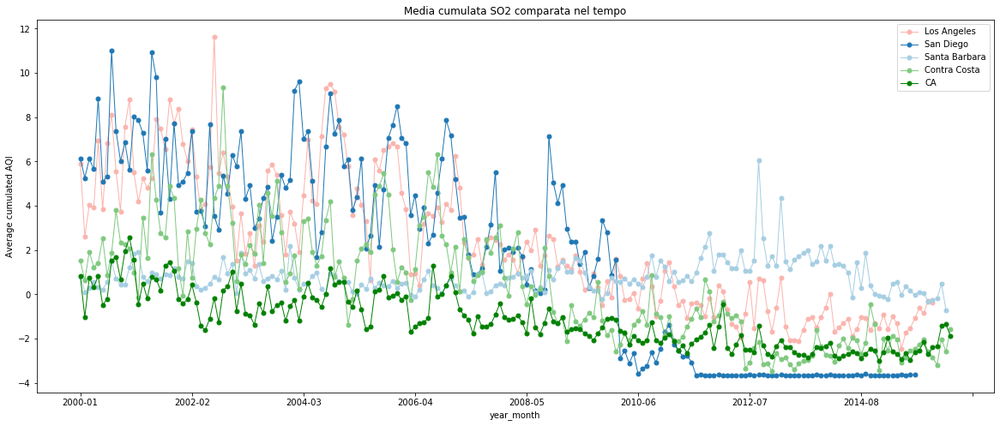

In [153]:
graphs=[losangeles_cml_pd,
        sandiego_cml_pd,
        santabarbara_cml_pd,
        contracosta_cml_pd,
        california_cml_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Cumulated_AQI_SO2)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Media cumulata SO2 comparata nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average cumulated AQI")

plt.show()

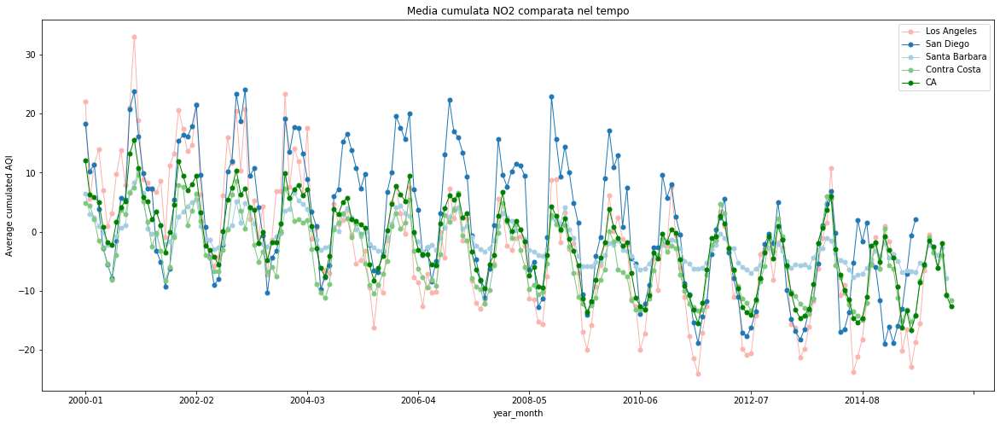

In [154]:
graphs=[losangeles_cml_pd,
        sandiego_cml_pd,
        santabarbara_cml_pd,
        contracosta_cml_pd,
        california_cml_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Cumulated_AQI_NO2)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Media cumulata NO2 comparata nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average cumulated AQI")

plt.show()

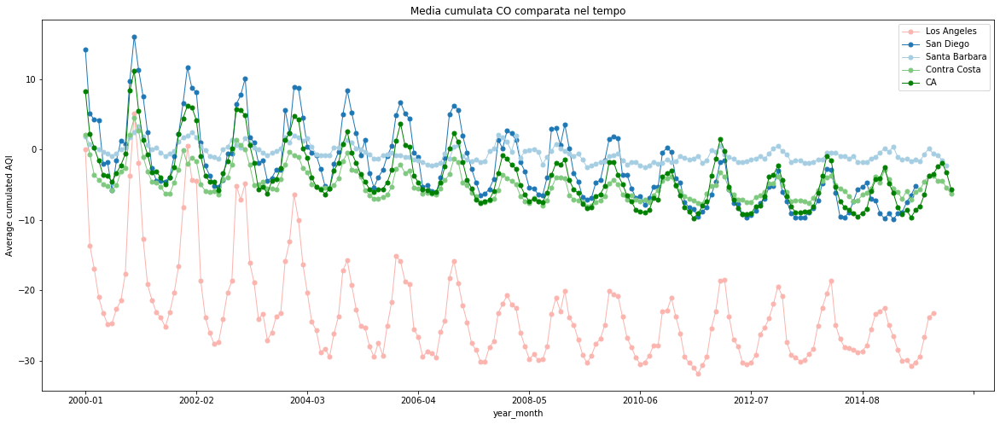

In [155]:
graphs=[losangeles_cml_pd,
        sandiego_cml_pd,
        santabarbara_cml_pd,
        contracosta_cml_pd,
        california_cml_pd]

labels = ['Los Angeles', 'San Diego', 'Santa Barbara', 'Contra Costa', "CA"]

color = ['Pastel1', 'tab10', 'Paired', 'Accent', 'ocean']

f, ax = plt.subplots(figsize=[20,8])

for gg,graph in enumerate(graphs):
    graph.plot(x="year_month",
               y="avg(Cumulated_AQI_CO)",
               lw=1,
               colormap=color[gg],
               marker='.',
               markersize=10,
               ax=ax,
               label=str(labels[gg]))

ax.set_title('Media cumulata CO comparata nel tempo')
ax.set(xlabel="year_month",
       ylabel="Average cumulated AQI")

plt.show()

# CLUSTERING NELLA CALIFORNIA
### Osserviamo se ci sono sensori nelle contee californiane che si comportano in modo simile

#### Applico Regressione Lineare sulle TS dei sensori delle conteee della California

In [10]:
# elenco delle contee della california
kdd_df.filter(col('State')=='California'
             ).select('County'
                     ).distinct().show()

+--------------+
|        County|
+--------------+
|       Ventura|
|        Orange|
|   Los Angeles|
|    Sacramento|
|     San Diego|
| San Francisco|
|    Santa Cruz|
|   Santa Clara|
|  Contra Costa|
|        Fresno|
|          Kern|
|        Solano|
|      Humboldt|
|     Riverside|
|      Imperial|
| Santa Barbara|
|San Bernardino|
|       Alameda|
+--------------+



In [249]:
# vedo i sensori per countea in california
county_ca = kdd_df.filter(col('State')=='California'
                         ).select('County'
                                 ).distinct().toPandas()['County'].tolist()
num_sens_county = {}

for c in county_ca:
    if c not in num_sens_county:
        num_sens_county[c] = []
        num_sens_county[c].append(kdd_df.filter(col('County')==c
                                               ).select('Site Num'
                                                       ).distinct().toPandas()['Site Num'].tolist())
    else:
        continue   

In [250]:
print(num_sens_county)

{'Ventura': [[3001]], 'Orange': [[1003, 2002]], 'Los Angeles': [[31, 5001, 1002, 4006, 4002, 1103, 5005, 30]], 'Sacramento': [[6, 2]], 'San Diego': [[2007, 1, 3, 1010, 1007, 1018]], 'San Francisco': [[6, 5]], 'Santa Cruz': [[3]], 'Santa Clara': [[5, 2009]], 'Contra Costa': [[3001, 1002, 10, 1003, 2, 1004]], 'Fresno': [[243, 8, 244, 11]], 'Kern': [[14]], 'Solano': [[6, 4]], 'Humboldt': [[1005, 1004]], 'Riverside': [[8001]], 'Imperial': [[5]], 'Santa Barbara': [[1025, 2004, 4003, 2011]], 'San Bernardino': [[306, 2002]], 'Alameda': [[2004, 10, 11]]}


In [11]:
# rendo i sensori unici concatenando il nome della contea al num del sensore.
california_df = kdd_df.filter(col('State')=='California')
california_df = california_df.withColumn('C-Sensor',
                                         sf.concat(sf.col('Site Num'),
                                                   sf.lit('-'),
                                                   sf.col('County')))

In [12]:
california_df.select('C-Sensor','County','Site Num').distinct().show()

+-------------------+--------------+--------+
|           C-Sensor|        County|Site Num|
+-------------------+--------------+--------+
|           6-Solano|        Solano|       6|
|     8001-Riverside|     Riverside|    8001|
|      1004-Humboldt|      Humboldt|    1004|
|     31-Los Angeles|   Los Angeles|      31|
|          11-Fresno|        Fresno|      11|
|       3001-Ventura|       Ventura|    3001|
|   1002-Los Angeles|   Los Angeles|    1002|
|     30-Los Angeles|   Los Angeles|      30|
|  1002-Contra Costa|  Contra Costa|    1002|
|   5001-Los Angeles|   Los Angeles|    5001|
|     1007-San Diego|     San Diego|    1007|
|     1018-San Diego|     San Diego|    1018|
|    10-Contra Costa|  Contra Costa|      10|
|       6-Sacramento|    Sacramento|       6|
|        1-San Diego|     San Diego|       1|
|  3001-Contra Costa|  Contra Costa|    3001|
|2002-San Bernardino|San Bernardino|    2002|
|    6-San Francisco| San Francisco|       6|
|            14-Kern|          Ker

### Regressione Linear per estrarre gli attributi per clustering

In [13]:
df_reg = california_df.select(['C-Sensor', 'Date Local',
                              'NO2 Mean', 'O3 Mean', 'SO2 Mean', 'CO Mean',
                              'NO2 1st Max Value', 'O3 1st Max Value', 'SO2 1st Max Value', 'CO 1st Max Value',
                              'NO2 AQI', 'O3 AQI', 'SO2 AQI', 'CO AQI',
                             ])
df_reg.show(2)

+-----------+----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
|   C-Sensor|Date Local| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|
+-----------+----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
|1-San Diego|2000-05-13|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|
|1-San Diego|2000-05-13|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|    61|    3.0|  11.0|
+-----------+----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
only showing top 2 rows



In [255]:
df_reg = df_reg.withColumn('year',
                           split(df_reg['Date Local'], '-'
                                ).getItem(0))

df_reg = df_reg.withColumn('month',
                           split(df_reg['Date Local'], '-'
                                ).getItem(1))

df_reg = df_reg.withColumn('month_year',
                           sf.concat(sf.col("month"),
                                     sf.lit('-'),
                                     sf.col("year")))

df_reg = df_reg.drop('Date Local')
df_reg.show(2)

+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+----------+
|   C-Sensor| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|year|month|month_year|
+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+----------+
|1-San Diego|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|2000|   05|   05-2000|
|1-San Diego|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|    61|    3.0|  11.0|2000|   05|   05-2000|
+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+

In [256]:
df_2000 = df_reg.select('*').filter(df_reg['year']==2000)
df_2001 = df_reg.select('*').filter(df_reg['year']==2001)
df_2002 = df_reg.select('*').filter(df_reg['year']==2002)
df_2003 = df_reg.select('*').filter(df_reg['year']==2003)

df_0003 = df_2000.union(df_2001).union(df_2002).union(df_2003)


df_2004 = df_reg.select('*').filter(df_reg['year']==2004)
df_2005 = df_reg.select('*').filter(df_reg['year']==2005)
df_2006 = df_reg.select('*').filter(df_reg['year']==2006)
df_2007 = df_reg.select('*').filter(df_reg['year']==2007)
df_2008 = df_reg.select('*').filter(df_reg['year']==2008)

df_0407 = df_2004.union(df_2005).union(df_2006).union(df_2007)


df_2009 = df_reg.select('*').filter(df_reg['year']==2009)
df_2010 = df_reg.select('*').filter(df_reg['year']==2010)
df_2011 = df_reg.select('*').filter(df_reg['year']==2011)
df_2012 = df_reg.select('*').filter(df_reg['year']==2012)

df_0811 = df_2008.union(df_2009).union(df_2010).union(df_2011)

df_2013 = df_reg.select('*').filter(df_reg['year']==2013)
df_2014 = df_reg.select('*').filter(df_reg['year']==2014)
df_2015 = df_reg.select('*').filter(df_reg['year']==2015)

df_1215 = df_2012.union(df_2013).union(df_2014).union(df_2015)

### Estraggo faetures per il quadriennio 2000 - 2003 usando la regressione lineare - [COMPLETED]

In [257]:
# Estraggo faetures per il quadriennio 2000 - 2003 usando la regressione lineare
df_0003 = df_0003.groupby('C-Sensor','month_year'
                         ).mean().sort('month_year')
sensors = df_0003.select('C-Sensor').distinct().toPandas()['C-Sensor']

coeff_NO2_0003 = []
coeff_O3_0003 = []
coeff_SO2_0003 = []
coeff_CO_0003 = []

poll = [('avg(SO2 Mean)', 'avg(SO2 AQI)'), ('avg(NO2 Mean)', 'avg(NO2 AQI)'),
        ('avg(CO Mean)', 'avg(CO AQI)'), ('avg(O3 Mean)', 'avg(O3 AQI)')]

for sensor in tqdm(sensors):
    for p in poll:        
        training = df_0003.filter(df_0003['C-Sensor']==sensor
                                 ).sort('month_year'
                                       ).select(str(p[0]), str(p[1]))
        cols = training.columns[:1]
        assemble=VectorAssembler(inputCols=cols,
                                 outputCol='features')
        assembled_data=assemble.transform(training)
        assembled_data = assembled_data.drop(str(p[0]))
        assembled_data = assembled_data.withColumnRenamed(str(p[1]), 'label')
         
        # eseguo linear regression
        lr = LinearRegression(maxIter=10) 

        # Fit the model
        lrModel = lr.fit(assembled_data)
        
        # ---------------------------- statistiche ----------------------------------------#
        # Print the coefficients and intercept for linear regression
        #print("Coefficients: %s" % str(lrModel.coefficients))
        #print("Intercept: %s" % str(lrModel.intercept))

        # Summarize the model over the training set and print out some metrics
        #trainingSummary = lrModel.summary
        #print("numIterations: %d" % trainingSummary.totalIterations)
        #print("objectiveHistory: %s" % str(trainingSummary.objectiveHistory))
        #trainingSummary.residuals.show()
        #print("RMSE: %f" % trainingSummary.rootMeanSquaredError)
        #print("r2: %f" % trainingSummary.r2)
        
        if p[1] == 'avg(SO2 AQI)':
            coeff_SO2_0003.append([sensor]+ [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(NO2 AQI)':
            coeff_NO2_0003.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(CO AQI)':
            coeff_CO_0003.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        else:
            coeff_O3_0003.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
                      
c1no20003 = ['C-Sensor', 'x1_NO2_0003']
c1so20003 = ['C-Sensor', 'x1_SO2_0003']
c1co0003 = ['C-Sensor', 'x1_CO_0003']
c1o30003 = ['C-Sensor', 'x1_O3_0003']

sensor_coeffNO2_0003 = spark.createDataFrame(coeff_NO2_0003, c1no20003)
sensor_coeffSO2_0003 = spark.createDataFrame(coeff_SO2_0003, c1so20003)
sensor_coeffCO_0003 = spark.createDataFrame(coeff_CO_0003, c1co0003)
sensor_coeffO3_0003 = spark.createDataFrame(coeff_O3_0003, c1o30003)
# unisco i dataframes
sonsor_0003 = sensor_coeffNO2_0003.join(sensor_coeffSO2_0003, 'C-Sensor'
                                       ).join(sensor_coeffCO_0003, 'C-Sensor'
                                             ).join(sensor_coeffO3_0003, 'C-Sensor')

regr0003 = sonsor_0003.toPandas()
regr0003.to_csv("regression_0003.csv")
regr0003.to_csv("http://kddrtserver11.isti.cnr.it:8889/tree/regression_0003.csv")

100%|██████████| 33/33 [2:51:50<00:00, 312.44s/it]  


### Estraggo faetures per il quadriennio 2004 - 2007 usando la regressione lineare [COMPLETED]

In [258]:
# Estraggo faetures per il quadriennio 2004 - 2007 usando la regressione lineare
df_0407 = df_0407.groupby('C-Sensor','month_year'
                         ).mean().sort('month_year')
sensors = df_0407.select('C-Sensor').distinct().toPandas()['C-Sensor']

coeff_NO2_0407 = []
coeff_O3_0407 = []
coeff_SO2_0407 = []
coeff_CO_0407 = []

poll = [('avg(SO2 Mean)', 'avg(SO2 AQI)'), ('avg(NO2 Mean)', 'avg(NO2 AQI)'),
        ('avg(CO Mean)', 'avg(CO AQI)'), ('avg(O3 Mean)', 'avg(O3 AQI)')]

for sensor in tqdm(sensors):
    for p in poll:        
        training = df_0407.filter(df_0407['C-Sensor']==sensor
                                 ).sort('month_year'
                                       ).select(str(p[0]), str(p[1]))
        cols = training.columns[:1]
        assemble=VectorAssembler(inputCols=cols,
                                 outputCol='features')
        assembled_data=assemble.transform(training)
        assembled_data = assembled_data.drop(str(p[0]))
        assembled_data = assembled_data.withColumnRenamed(str(p[1]), 'label')
         
        # eseguo linear regression
        lr = LinearRegression(maxIter=10) 

        # Fit the model
        lrModel = lr.fit(assembled_data)
        
        # ---------------------------- statistiche ----------------------------------------#
        # Print the coefficients and intercept for linear regression
        #print("Coefficients: %s" % str(lrModel.coefficients))
        #print("Intercept: %s" % str(lrModel.intercept))

        # Summarize the model over the training set and print out some metrics
        #trainingSummary = lrModel.summary
        #print("numIterations: %d" % trainingSummary.totalIterations)
        #print("objectiveHistory: %s" % str(trainingSummary.objectiveHistory))
        #trainingSummary.residuals.show()
        #print("RMSE: %f" % trainingSummary.rootMeanSquaredError)
        #print("r2: %f" % trainingSummary.r2)
        
        if p[1] == 'avg(SO2 AQI)':
            coeff_SO2_0407.append([sensor]+ [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(NO2 AQI)':
            coeff_NO2_0407.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(CO AQI)':
            coeff_CO_0407.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        else:
            coeff_O3_0407.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
                      
c1no20407 = ['C-Sensor', 'x1_NO2_0407']
c1so20407 = ['C-Sensor', 'x1_SO2_0407']
c1co0407 = ['C-Sensor', 'x1_CO_0407']
c1o30407 = ['C-Sensor', 'x1_O3_0407']

sensor_coeffNO2_0407 = spark.createDataFrame(coeff_NO2_0407, c1no20407)
sensor_coeffSO2_0407 = spark.createDataFrame(coeff_SO2_0407, c1so20407)
sensor_coeffCO_0407= spark.createDataFrame(coeff_CO_0407, c1co0407)
sensor_coeffO3_0407 = spark.createDataFrame(coeff_O3_0407, c1o30407)
# unisco i dataframes
sonsor_0407 = sensor_coeffNO2_0407.join(sensor_coeffSO2_0407, 'C-Sensor'
                                       ).join(sensor_coeffCO_0407, 'C-Sensor'
                                             ).join(sensor_coeffO3_0407, 'C-Sensor')

regr0407 = sonsor_0407.toPandas()
regr0407.to_csv("regression_0407.csv")
regr0407.to_csv("http://kddrtserver11.isti.cnr.it:8889/tree/regression_0407.csv")

100%|██████████| 32/32 [2:48:49<00:00, 316.55s/it]  


### Estraggo faetures per il quadriennio 2008 - 2011 usando la regressione lineare [COMPLETED]

In [259]:
# Estraggo faetures per il quadriennio 2008 - 2011 usando la regressione lineare
df_0811 = df_0811.groupby('C-Sensor','month_year'
                         ).mean().sort('month_year')
sensors = df_0811.select('C-Sensor').distinct().toPandas()['C-Sensor']

coeff_NO2_0811 = []
coeff_O3_0811 = []
coeff_SO2_0811 = []
coeff_CO_0811 = []

poll = [('avg(SO2 Mean)', 'avg(SO2 AQI)'), ('avg(NO2 Mean)', 'avg(NO2 AQI)'),
        ('avg(CO Mean)', 'avg(CO AQI)'), ('avg(O3 Mean)', 'avg(O3 AQI)')]

for sensor in tqdm(sensors):
    for p in poll:        
        training = df_0811.filter(df_0811['C-Sensor']==sensor
                                 ).sort('month_year'
                                       ).select(str(p[0]), str(p[1]))
        cols = training.columns[:1]
        assemble=VectorAssembler(inputCols=cols,
                                 outputCol='features')
        assembled_data=assemble.transform(training)
        assembled_data = assembled_data.drop(str(p[0]))
        assembled_data = assembled_data.withColumnRenamed(str(p[1]), 'label')
         
        # eseguo linear regression
        lr = LinearRegression(maxIter=10) 

        # Fit the model
        lrModel = lr.fit(assembled_data)
        
        # ---------------------------- statistiche ----------------------------------------#
        # Print the coefficients and intercept for linear regression
        #print("Coefficients: %s" % str(lrModel.coefficients))
        #print("Intercept: %s" % str(lrModel.intercept))

        # Summarize the model over the training set and print out some metrics
        #trainingSummary = lrModel.summary
        #print("numIterations: %d" % trainingSummary.totalIterations)
        #print("objectiveHistory: %s" % str(trainingSummary.objectiveHistory))
        #trainingSummary.residuals.show()
        #print("RMSE: %f" % trainingSummary.rootMeanSquaredError)
        #print("r2: %f" % trainingSummary.r2)
        
        if p[1] == 'avg(SO2 AQI)':
            coeff_SO2_0811.append([sensor]+ [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(NO2 AQI)':
            coeff_NO2_0811.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(CO AQI)':
            coeff_CO_0811.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        else:
            coeff_O3_0811.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
                      
c1no20811 = ['C-Sensor', 'x1_NO2_0811']
c1so20811 = ['C-Sensor', 'x1_SO2_0811']
c1co0811 = ['C-Sensor', 'x1_CO_0811']
c1o30811 = ['C-Sensor', 'x1_O3_0811']

sensor_coeffNO2_0811 = spark.createDataFrame(coeff_NO2_0811, c1no20811)
sensor_coeffSO2_0811 = spark.createDataFrame(coeff_SO2_0811, c1so20811)
sensor_coeffCO_0811= spark.createDataFrame(coeff_CO_0811, c1co0811)
sensor_coeffO3_0811 = spark.createDataFrame(coeff_O3_0811, c1o30811)
# unisco i dataframes
sonsor_0811 = sensor_coeffNO2_0811.join(sensor_coeffSO2_0811, 'C-Sensor'
                                       ).join(sensor_coeffCO_0811, 'C-Sensor'
                                             ).join(sensor_coeffO3_0811, 'C-Sensor')

regr0811 = sonsor_0811.toPandas()
regr0811.to_csv("regression_0811.csv")
regr0811.to_csv("http://kddrtserver11.isti.cnr.it:8889/tree/regression_0811.csv")

100%|██████████| 35/35 [2:59:18<00:00, 307.39s/it]  


### Estraggo faetures per il quadriennio 2012 - 2015 usando la regressione lineare [COMPLETED]

In [260]:
# Estraggo faetures per il quadriennio 2012 - 2015 usando la regressione lineare
df_1215 = df_1215.groupby('C-Sensor','month_year'
                         ).mean().sort('month_year')
sensors = df_1215.select('C-Sensor').distinct().toPandas()['C-Sensor']

coeff_NO2_1215 = []
coeff_O3_1215 = []
coeff_SO2_1215 = []
coeff_CO_1215 = []

poll = [('avg(SO2 Mean)', 'avg(SO2 AQI)'), ('avg(NO2 Mean)', 'avg(NO2 AQI)'),
        ('avg(CO Mean)', 'avg(CO AQI)'), ('avg(O3 Mean)', 'avg(O3 AQI)')]

for sensor in tqdm(sensors):
    for p in poll:        
        training = df_1215.filter(df_1215['C-Sensor']==sensor
                                 ).sort('month_year'
                                       ).select(str(p[0]), str(p[1]))
        cols = training.columns[:1]
        assemble=VectorAssembler(inputCols=cols,
                                 outputCol='features')
        assembled_data=assemble.transform(training)
        assembled_data = assembled_data.drop(str(p[0]))
        assembled_data = assembled_data.withColumnRenamed(str(p[1]), 'label')
         
        # eseguo linear regression
        lr = LinearRegression(maxIter=10) 

        # Fit the model
        lrModel = lr.fit(assembled_data)
        
        # ---------------------------- statistiche ----------------------------------------#
        # Print the coefficients and intercept for linear regression
        #print("Coefficients: %s" % str(lrModel.coefficients))
        #print("Intercept: %s" % str(lrModel.intercept))

        # Summarize the model over the training set and print out some metrics
        #trainingSummary = lrModel.summary
        #print("numIterations: %d" % trainingSummary.totalIterations)
        #print("objectiveHistory: %s" % str(trainingSummary.objectiveHistory))
        #trainingSummary.residuals.show()
        #print("RMSE: %f" % trainingSummary.rootMeanSquaredError)
        #print("r2: %f" % trainingSummary.r2)
        
        if p[1] == 'avg(SO2 AQI)':
            coeff_SO2_1215.append([sensor]+ [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(NO2 AQI)':
            coeff_NO2_1215.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        elif p[1] == 'avg(CO AQI)':
            coeff_CO_1215.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
        else:
            coeff_O3_1215.append([sensor] + [float(lrModel.coefficients.astype(float)[0])])
                      
c1no21215 = ['C-Sensor', 'x1_NO2_1215']
c1so21215 = ['C-Sensor', 'x1_SO2_1215']
c1co1215 = ['C-Sensor', 'x1_CO_1215']
c1o31215 = ['C-Sensor', 'x1_O3_1215']

sensor_coeffNO2_1215 = spark.createDataFrame(coeff_NO2_1215, c1no21215)
sensor_coeffSO2_1215 = spark.createDataFrame(coeff_SO2_1215, c1so21215)
sensor_coeffCO_1215= spark.createDataFrame(coeff_CO_1215, c1co1215)
sensor_coeffO3_1215 = spark.createDataFrame(coeff_O3_1215, c1o31215)
# unisco i dataframes
sonsor_1215 = sensor_coeffNO2_1215.join(sensor_coeffSO2_1215, 'C-Sensor'
                                       ).join(sensor_coeffCO_1215, 'C-Sensor'
                                             ).join(sensor_coeffO3_1215, 'C-Sensor')

regr1215 = sonsor_1215.toPandas()
regr1215.to_csv("regression_1215.csv")
regr1215.to_csv("http://kddrtserver11.isti.cnr.it:8889/tree/regression_1215.csv")

100%|██████████| 26/26 [2:14:27<00:00, 310.30s/it]  


### Carico i csv dei coefficienti di regressione per i vari quadrienni

In [14]:
r1_rdd = sc.textFile('regression_0003.csv')
r2_rdd = sc.textFile('regression_0407.csv')
r3_rdd = sc.textFile('regression_0811.csv')
r4_rdd = sc.textFile('regression_1215.csv')

r1 = spark.read.options(inferSchema=True,
                        delimiter=',',
                        header=True).csv(r1_rdd)

r2 = spark.read.options(inferSchema=True,
                        delimiter=',',
                        header=True).csv(r2_rdd)

r3 = spark.read.options(inferSchema=True,
                        delimiter=',',
                        header=True).csv(r3_rdd)

r4 = spark.read.options(inferSchema=True,
                        delimiter=',',
                        header=True).csv(r4_rdd)

r1 = r1.drop('_c0')
r2 = r2.drop('_c0')
r3 = r3.drop('_c0')
r4 = r4.drop('_c0')

##### Preparo il dataset per il clustering

In [15]:
kdd_df_clust = california_df.select(['C-Sensor', 'Date Local',
                                     'NO2 Mean', 'O3 Mean', 'SO2 Mean', 'CO Mean',
                                     'NO2 1st Max Value', 'O3 1st Max Value', 'SO2 1st Max Value', 'CO 1st Max Value',
                                     'NO2 AQI', 'O3 AQI', 'SO2 AQI', 'CO AQI',
                                    ])

kdd_df_clust.show(2)

+-----------+----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
|   C-Sensor|Date Local| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|
+-----------+----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
|1-San Diego|2000-05-13|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|
|1-San Diego|2000-05-13|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|    61|    3.0|  11.0|
+-----------+----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+
only showing top 2 rows



In [16]:
# aggiungo colonna anno
kdd_df_clust = kdd_df_clust.withColumn('year',
                                       split(kdd_df_clust['Date Local'], '-'
                                            ).getItem(0))

kdd_df_clust = kdd_df_clust.drop('Date Local')
kdd_df_clust.show(2)

+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+
|   C-Sensor| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|year|
+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+
|1-San Diego|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|2000|
|1-San Diego|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|    61|    3.0|  11.0|2000|
+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+
only showing top 2 rows



In [17]:
def groupyear(value):
    if int(value) >= 2000 and int(value) < 2004: return 1 #"2000-2003" 
    elif int(value)>= 2004 and int(value) < 2008: return 2 # "2004-2007" 
    elif int(value)>= 2008 and int(value)< 2012: return 3 # "2008-2011" 
    else: return 4# "2012-2016" 

udf_groupyear = udf(groupyear, IntegerType())

kdd_df_clust = kdd_df_clust.withColumn('4year',
                                       udf_groupyear("year"))
kdd_df_clust.show(2)

+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+
|   C-Sensor| NO2 Mean| O3 Mean|SO2 Mean| CO Mean|NO2 1st Max Value|O3 1st Max Value|SO2 1st Max Value|CO 1st Max Value|NO2 AQI|O3 AQI|SO2 AQI|CO AQI|year|4year|
+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+
|1-San Diego|16.347826|0.041708| 1.73913|0.582609|             35.0|           0.063|              2.0|             1.5|     33|    61|    3.0|  11.0|2000|    1|
|1-San Diego|16.347826|0.041708| 1.73913|0.620833|             35.0|           0.063|              2.0|             1.0|     33|    61|    3.0|  11.0|2000|    1|
+-----------+---------+--------+--------+--------+-----------------+----------------+-----------------+----------------+-------+------+-------+------+----+-----+
only showing top 2 rows



Calcolo i valori massimi per ogni 4 anni per sensore

In [18]:
max_year = kdd_df_clust.select('*'
                              ).groupby('C-Sensor','4year'
                                       ).max().select('4year','C-Sensor','max(NO2 1st Max Value)',
                                                      'max(O3 1st Max Value)', 'max(SO2 1st Max Value)',
                                                      'max(CO 1st Max Value)')

#max_year.show(2)

Calcolo i valori medi degli inquinanti per ogni 4 anni per sensore

In [19]:
mean_year = kdd_df_clust.select('*'
                               ).groupby('C-Sensor','4year'
                                        ).mean().select('4year','C-Sensor','avg(NO2 Mean)',
                                                        'avg(O3 Mean)', 'avg(SO2 Mean)', 'avg(CO Mean)')

#mean_year.show(2)

Calcolo i valori minimi per ogni 4 anni per sensore

In [20]:
min_year = kdd_df_clust.select('*'
                              ).groupby('C-Sensor','4year'
                                       ).min().select('4year','C-Sensor','min(NO2 1st Max Value)',
                                                      'min(O3 1st Max Value)', 'min(SO2 1st Max Value)',
                                                      'min(CO 1st Max Value)')

#min_year.show(2)

Unisco i dataframe per ottenere il dataframe finale da usare nel clustering dei sensori

In [21]:
df_clust_year = min_year.join(max_year, ['4year', 'C-Sensor'], 'inner'
                             ).join(mean_year, ['4year', 'C-Sensor'], 'inner'
                                   ).sort('4year', 'C-Sensor')

df_clust_year.show(2)

+-----+-----------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+------------------+--------------------+------------------+------------------+
|4year|   C-Sensor|min(NO2 1st Max Value)|min(O3 1st Max Value)|min(SO2 1st Max Value)|min(CO 1st Max Value)|max(NO2 1st Max Value)|max(O3 1st Max Value)|max(SO2 1st Max Value)|max(CO 1st Max Value)|     avg(NO2 Mean)|        avg(O3 Mean)|     avg(SO2 Mean)|      avg(CO Mean)|
+-----+-----------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+------------------+--------------------+------------------+------------------+
|    1|1-San Diego|                   4.0|                0.004|                   0.0|                  0.1|                 102.0|                0.079|            

## Eseguo Clustering sul comportamento dei sensori nel 2000-2003

In [21]:
cluster_20002003raw = df_clust_year.select('*'
                                          ).where(df_clust_year['4year'] == 1)
cluster_20002003raw = cluster_20002003raw.drop('4year')
cluster_20002003_data = cluster_20002003raw.select('C-Sensor', 'min(NO2 1st Max Value)',
                                                   'min(O3 1st Max Value)', 'min(SO2 1st Max Value)','min(CO 1st Max Value)',
                                                   'max(NO2 1st Max Value)','max(O3 1st Max Value)','max(SO2 1st Max Value)',
                                                   'max(CO 1st Max Value)','avg(NO2 Mean)','avg(O3 Mean)',
                                                   'avg(SO2 Mean)','avg(CO Mean)')

cluster_20002003_data.show(2)

+-----------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+------------------+--------------------+------------------+------------------+
|   C-Sensor|min(NO2 1st Max Value)|min(O3 1st Max Value)|min(SO2 1st Max Value)|min(CO 1st Max Value)|max(NO2 1st Max Value)|max(O3 1st Max Value)|max(SO2 1st Max Value)|max(CO 1st Max Value)|     avg(NO2 Mean)|        avg(O3 Mean)|     avg(SO2 Mean)|      avg(CO Mean)|
+-----------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+------------------+--------------------+------------------+------------------+
|1-San Diego|                   4.0|                0.004|                   0.0|                  0.1|                 102.0|                0.079|                  49.0|             

In [22]:
join_df = cluster_20002003_data.join(r1, 'C-Sensor', 'inner')

In [23]:
cols = join_df.columns[1:]
assemble = VectorAssembler(inputCols=cols,
                           outputCol='features')
assembled_data=assemble.transform(join_df)

In [24]:
assembled_data_filtered = assembled_data.select('C-Sensor','features')
assembled_data_filtered.show(5)

+------------------+--------------------+
|          C-Sensor|            features|
+------------------+--------------------+
|    2007-San Diego|[6.0,0.004,0.6,0....|
| 3001-Contra Costa|[2.0,0.0,0.0,0.2,...|
|306-San Bernardino|[2.0,0.001,0.0,0....|
|       1-San Diego|[4.0,0.004,0.0,0....|
|  5001-Los Angeles|[3.0,0.0,0.0,0.0,...|
+------------------+--------------------+
only showing top 5 rows



In [25]:
# construct spark dataframe with dense vectors (otherwise k-means return an error)
from pyspark.ml.linalg import Vectors
data = []

features = assembled_data_filtered.sort('C-Sensor').toPandas()['features'].tolist()
sites = assembled_data_filtered.sort('C-Sensor').toPandas()['C-Sensor'].tolist()

for f, s in zip(features, sites):
    data.append((Vectors.dense(f), s))

df = spark.createDataFrame(data, ["features", "C-Sensor"])

#### Find optimal k

In [26]:
from pyspark.ml.clustering import KMeans

silhouette_score=[]
evaluator = ClusteringEvaluator(predictionCol='prediction',
                                featuresCol='features', \
                                metricName='silhouette',
                                distanceMeasure='squaredEuclidean')
for i in tqdm(range(2,15)):

    KMeans_algo=KMeans(featuresCol ='features',
                       k=i)
    
    KMeans_fit=KMeans_algo.fit(df)
    
    output=KMeans_fit.transform(df)
    
    score=evaluator.evaluate(output)  
    silhouette_score.append(score)
    
    print('K = ',i)
    print("Silhouette Score:",score)

  8%|▊         | 1/13 [00:02<00:30,  2.52s/it]

K =  2
Silhouette Score: 0.8653264499723341


 15%|█▌        | 2/13 [00:03<00:18,  1.72s/it]

K =  3
Silhouette Score: 0.8483273481270839


 23%|██▎       | 3/13 [00:04<00:14,  1.49s/it]

K =  4
Silhouette Score: 0.7258843985895546


 31%|███       | 4/13 [00:05<00:11,  1.32s/it]

K =  5
Silhouette Score: 0.6791829092727526


 38%|███▊      | 5/13 [00:06<00:09,  1.19s/it]

K =  6
Silhouette Score: 0.6449419701412215


 46%|████▌     | 6/13 [00:08<00:08,  1.16s/it]

K =  7
Silhouette Score: 0.5105937740763259


 54%|█████▍    | 7/13 [00:09<00:06,  1.11s/it]

K =  8
Silhouette Score: 0.5529959027618516


 62%|██████▏   | 8/13 [00:10<00:05,  1.09s/it]

K =  9
Silhouette Score: 0.5423793726939954


 69%|██████▉   | 9/13 [00:11<00:04,  1.04s/it]

K =  10
Silhouette Score: 0.5927502075465262


 77%|███████▋  | 10/13 [00:11<00:02,  1.01it/s]

K =  11
Silhouette Score: 0.5244005219434329


 85%|████████▍ | 11/13 [00:12<00:01,  1.06it/s]

K =  12
Silhouette Score: 0.612306807381887


 92%|█████████▏| 12/13 [00:13<00:00,  1.05it/s]

K =  13
Silhouette Score: 0.4253868764006


100%|██████████| 13/13 [00:14<00:00,  1.12s/it]

K =  14
Silhouette Score: 0.5181021088959104


Text(0, 0.5, 'Silhouette')

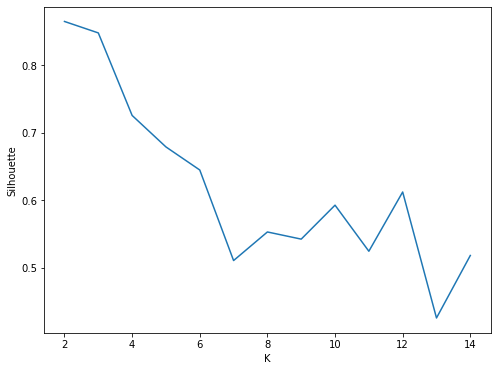

In [27]:
# visualizzo i silhouette scores in un plot 
fig, ax = plt.subplots(1,1, figsize = (8,6))
ax.plot(range(2,15), silhouette_score)
ax.set_xlabel('K')
ax.set_ylabel('Silhouette')

##### NOTE:
Osserviamo che la silhouette più alta è ottenuta con ***K= 2***

In [47]:
# run k-means
KMeans_algo=KMeans(featuresCol='features',
                   k=2)
KMeans_fit=KMeans_algo.fit(df)
centers = KMeans_fit.clusterCenters()

print('Cluster Centers: ')
for center in centers:
    print(center)

Cluster Centers: 
[4.64000000e+00 3.96000000e-03 1.12000000e-01 7.20000000e-02
 9.37200000e+01 7.92400000e-02 4.65600000e+01 6.18400000e+00
 1.61187537e+01 2.45230796e-02 1.84534706e+00 5.99632080e-01
 1.45659723e+00 2.37021993e+00 1.78457811e+01 1.01989144e+03]
[7.37500000e+00 1.75000000e-03 0.00000000e+00 3.75000000e-02
 1.23500000e+02 1.13000000e-01 3.70000000e+01 5.72500000e+00
 2.23001481e+01 2.62050311e-02 1.44390788e+00 6.73144107e-01
 1.29655677e+00 2.18317630e+00 1.71969649e+01 2.07188467e+03]


In [48]:
transformed = KMeans_fit.transform(assembled_data_filtered
                                  ).select('C-Sensor','prediction')
rows= transformed.collect()
print(rows[:3])

[Row(C-Sensor='2007-San Diego', prediction=0), Row(C-Sensor='3001-Contra Costa', prediction=0), Row(C-Sensor='306-San Bernardino', prediction=1)]


In [49]:
df_pred0003 = spark.createDataFrame(rows)
df_pred0003.show(5)

+------------------+----------+
|          C-Sensor|prediction|
+------------------+----------+
|    2007-San Diego|         0|
| 3001-Contra Costa|         0|
|306-San Bernardino|         1|
|       1-San Diego|         0|
|  5001-Los Angeles|         0|
+------------------+----------+
only showing top 5 rows



In [50]:
# vedere quanti sensori ci sono per cluster
df_pred0003.groupby('prediction'
                   ).count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         0|   25|
|         1|    8|
+----------+-----+



In [51]:
df_pred = df_pred0003.join(join_df,'C-Sensor', 'inner')
df_pred.show(2)

+-----------------+----------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+------------------+--------------------+------------------+------------------+------------------+------------------+------------------+------------------+
|         C-Sensor|prediction|min(NO2 1st Max Value)|min(O3 1st Max Value)|min(SO2 1st Max Value)|min(CO 1st Max Value)|max(NO2 1st Max Value)|max(O3 1st Max Value)|max(SO2 1st Max Value)|max(CO 1st Max Value)|     avg(NO2 Mean)|        avg(O3 Mean)|     avg(SO2 Mean)|      avg(CO Mean)|       x1_NO2_0003|       x1_SO2_0003|        x1_CO_0003|        x1_O3_0003|
+-----------------+----------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+----------------------+---------------------+------------------+--------------------+------------------+-

In [52]:
df_pd = df_pred.toPandas()
print(df_pd.shape)
sensors = df_pd['C-Sensor']
df_pd.set_index('C-Sensor',
                inplace=True)
cluster_labels = df_pd['prediction']
df_pd.drop('prediction',
           axis = 1,
           inplace=True)

(33, 18)


In [53]:
pca = PCA(3,random_state=42)
pca.fit(df_pd)
pca_proj = pca.transform(df_pd)

In [54]:
pca_proj = pd.DataFrame(pca_proj,
                        columns=['pca1', 'pca2','pca3'])
pca_proj['C-Sensor'] = sensors
pca_proj.set_index('C-Sensor',
                   inplace=True)
pca_proj = pca_proj.join(cluster_labels,
                         on ='C-Sensor')

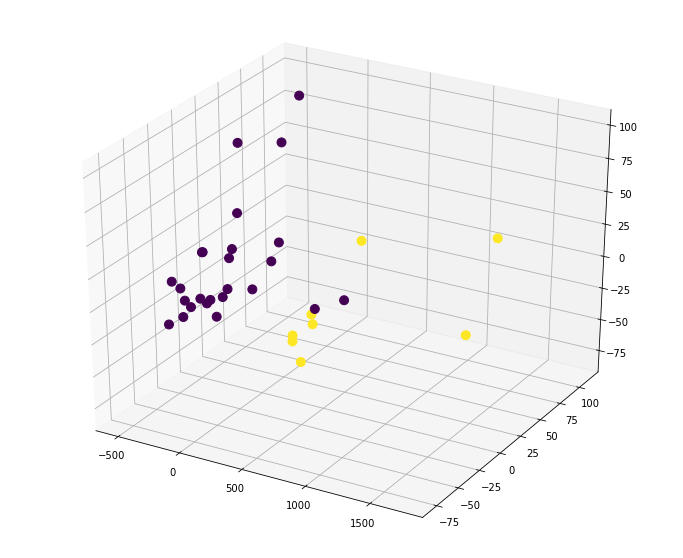

In [55]:
from mpl_toolkits.mplot3d import Axes3D

threedee = plt.figure(figsize=(12,10)).gca(projection='3d')
threedee.scatter(pca_proj.pca1,
                 pca_proj.pca2,
                 pca_proj.pca3,
                 c=pca_proj.prediction,
                 alpha=1,
                 s=80)

plt.show()

In [56]:
sensor_map = {}
for sensor, label in zip(cluster_labels.index, cluster_labels):
    if label not in sensor_map:
        sensor_map[label] = []
        sensor_map[label].append(sensor)
    else:
        sensor_map[label].append(sensor)

print('Cluster composition: 2000 -2003')
for k,v in sensor_map.items():
    sensor_map[k] = v.sort()
    print(k, '-->', v,'\n')


Cluster composition: 2000 -2003
0 --> ['1-San Diego', '10-Alameda', '10-Contra Costa', '1002-Contra Costa', '1003-Contra Costa', '1003-Orange', '1004-Contra Costa', '1007-San Diego', '1025-Santa Barbara', '14-Kern', '2-Contra Costa', '2004-Santa Barbara', '2007-San Diego', '2011-Santa Barbara', '3-Santa Cruz', '30-Los Angeles', '3001-Contra Costa', '3001-Ventura', '31-Los Angeles', '4-Solano', '4002-Los Angeles', '4003-Santa Barbara', '5-Imperial', '5-San Francisco', '5001-Los Angeles'] 

1 --> ['1002-Los Angeles', '1103-Los Angeles', '2-Sacramento', '243-Fresno', '244-Fresno', '306-San Bernardino', '6-Sacramento', '8001-Riverside'] 



## Clustering dei sensori nel 2004-2007

In [22]:
cluster_20042007raw = df_clust_year.select('*').where(df_clust_year['4year'] == 2)
cluster_20042007raw = cluster_20042007raw.drop('4year')
cluster_20042007_data = cluster_20042007raw.select('C-Sensor', 'min(NO2 1st Max Value)',
                                                   'min(O3 1st Max Value)','min(SO2 1st Max Value)','min(CO 1st Max Value)',
                                                   'max(NO2 1st Max Value)','max(O3 1st Max Value)','max(SO2 1st Max Value)',
                                                   'max(CO 1st Max Value)','avg(NO2 Mean)','avg(O3 Mean)',
                                                   'avg(SO2 Mean)','avg(CO Mean)')

join_df2 = cluster_20042007_data.join(r2, 'C-Sensor', 'inner')

cols = join_df2.columns[1:]
assemble2=VectorAssembler(inputCols=cols,
                          outputCol='features')
assembled_data2=assemble2.transform(join_df2)
#######################################################################
data = []

features = assembled_data2.sort('C-Sensor').toPandas()['features'].tolist()
sites = assembled_data2.sort('C-Sensor').toPandas()['C-Sensor'].tolist()

for f, s in zip(features, sites):
    data.append((Vectors.dense(f), s))

df2 = spark.createDataFrame(data, ["features", "C-Sensor"])

######################################################################

silhouette_score=[]
evaluator = ClusteringEvaluator(predictionCol='prediction',
                                featuresCol='features', \
                                metricName='silhouette',
                                distanceMeasure='squaredEuclidean')
for i in range(2,14):
    
    KMeans_algo=KMeans(featuresCol='features',
                       k=i,
                       seed=2)
    
    KMeans_fit=KMeans_algo.fit(df2)
    
    output=KMeans_fit.transform(df2)
    
    score=evaluator.evaluate(output)  
    silhouette_score.append(score)
    
    print('K = ',i)
    print("Silhouette Score:",score)

K =  2
Silhouette Score: 0.7782402492119563
K =  3
Silhouette Score: 0.7603049262290831
K =  4
Silhouette Score: 0.7635133208863718
K =  5
Silhouette Score: 0.7386768285428589
K =  6
Silhouette Score: 0.6859508970350521
K =  7
Silhouette Score: 0.669317602212151
K =  8
Silhouette Score: 0.4966720155210612
K =  9
Silhouette Score: 0.5015272909750594
K =  10
Silhouette Score: 0.5089092595332855
K =  11
Silhouette Score: 0.5056234159990335
K =  12
Silhouette Score: 0.4974153587722041
K =  13
Silhouette Score: 0.5055865397589352


Text(0, 0.5, 'Silhouette')

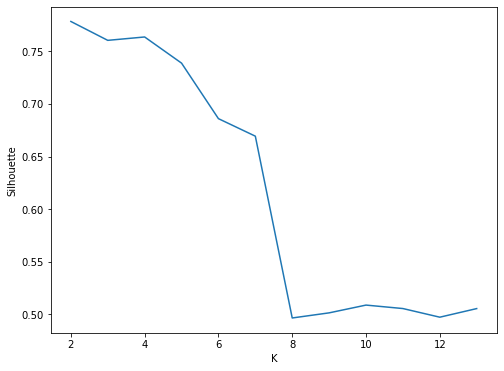

In [23]:
# visualizzo i silhouette scores in un plot 
fig, ax = plt.subplots(1,1, figsize = (8,6))
ax.plot(range(2,14), silhouette_score)
ax.set_xlabel('K')
ax.set_ylabel('Silhouette')

In [39]:
# run k-means with k = 3
KMeans_algo=KMeans(featuresCol='features',
                   k=2,
                   seed=1)
KMeans_fit=KMeans_algo.fit(df2)
centers = KMeans_fit.clusterCenters()

In [40]:
transformed = KMeans_fit.transform(assembled_data2
                                  ).select('C-Sensor','prediction')

rows= transformed.collect()

In [41]:
df_pred0407 = spark.createDataFrame(rows)
df_pred = df_pred0407.join(join_df2,'C-Sensor')

In [42]:
# sensor per cluster
df_pred0407.groupby('prediction'
                   ).count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         0|   25|
|         1|    7|
+----------+-----+



In [43]:
df_pd = df_pred.toPandas()
print(df_pd.shape)
sensors = df_pd['C-Sensor']
df_pd.set_index('C-Sensor',
                inplace=True)
cluster_labels = df_pd['prediction']
df_pd.drop('prediction',
           axis = 1,
           inplace=True)

(32, 18)


In [44]:
from sklearn.decomposition import PCA
pca = PCA(3,random_state=42)
pca.fit(df_pd)
pca_proj = pca.transform(df_pd)

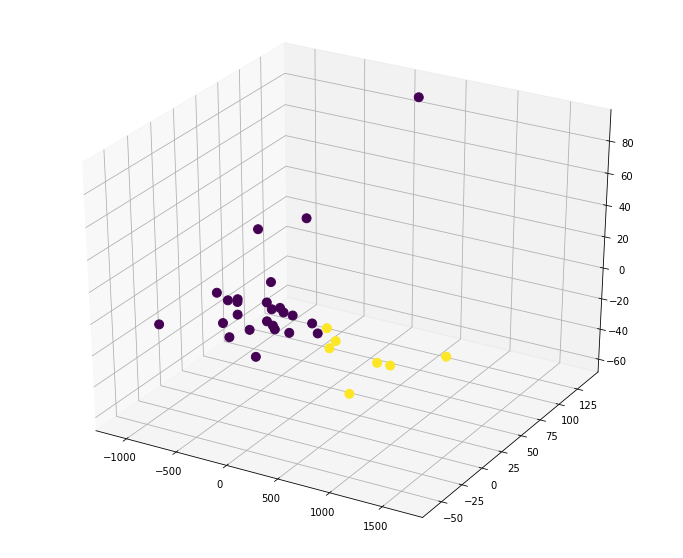

In [45]:
pca_proj = pd.DataFrame(pca_proj,
                        columns=['pca1', 'pca2','pca3'])
pca_proj['C-Sensor'] = sensors
pca_proj.set_index('C-Sensor',
                   inplace=True)
pca_proj = pca_proj.join(cluster_labels,
                         on ='C-Sensor')

threedee = plt.figure(figsize=(12,10)).gca(projection='3d')
threedee.scatter(pca_proj.pca1,
                 pca_proj.pca2,
                 pca_proj.pca3,
                 c=pca_proj.prediction,
                 alpha=1,
                 s=80)

plt.show()

In [46]:
sensor_map = {}
for sensor, label in zip(cluster_labels.index, cluster_labels):
    if label not in sensor_map:
        sensor_map[label] = []
        sensor_map[label].append(sensor)
    else:
        sensor_map[label].append(sensor)

print('Clustering composition: 2004 - 2007')
for k,v in sensor_map.items():
    sensor_map[k] = v.sort()
    print(k, '-->', v, '\n')


Clustering composition: 2004 - 2007
0 --> ['1-San Diego', '1002-Contra Costa', '1003-Orange', '1004-Contra Costa', '1004-Humboldt', '1007-San Diego', '1010-San Diego', '1025-Santa Barbara', '2-Contra Costa', '2004-Alameda', '2004-Santa Barbara', '2007-San Diego', '2011-Santa Barbara', '3-Santa Cruz', '3001-Contra Costa', '3001-Ventura', '4-Solano', '4002-Los Angeles', '4003-Santa Barbara', '5-Imperial', '5-San Francisco', '5001-Los Angeles', '5005-Los Angeles', '6-San Francisco', '6-Solano'] 

1 --> ['1002-Los Angeles', '1103-Los Angeles', '2-Sacramento', '306-San Bernardino', '6-Sacramento', '8-Fresno', '8001-Riverside'] 



### Clustering  2008 - 2011 - run da qui

In [57]:
cluster_20082011raw = df_clust_year.select('*'
                                          ).where(df_clust_year['4year'] == 3)
cluster_20082011raw = cluster_20082011raw.drop('4year')
cluster_20082011_data = cluster_20082011raw.select('C-Sensor', 'min(NO2 1st Max Value)',
                                                   'min(O3 1st Max Value)','min(SO2 1st Max Value)','min(CO 1st Max Value)',
                                                   'max(NO2 1st Max Value)','max(O3 1st Max Value)','max(SO2 1st Max Value)',
                                                   'max(CO 1st Max Value)','avg(NO2 Mean)','avg(O3 Mean)',
                                                   'avg(SO2 Mean)','avg(CO Mean)')

join_df3 = cluster_20082011_data.join(r3, 'C-Sensor', 'inner')

cols = join_df3.columns[1:]
assemble3=VectorAssembler(inputCols=cols, outputCol='features')
assembled_data3=assemble3.transform(join_df3)
#######################################################################
data = []

features = assembled_data3.sort('C-Sensor').toPandas()['features'].tolist()
sites = assembled_data3.sort('C-Sensor').toPandas()['C-Sensor'].tolist()

for f, s in zip(features, sites):
    data.append((Vectors.dense(f), s))

df3 = spark.createDataFrame(data, ["features", "C-Sensor"])

######################################################################


silhouette_score=[]
evaluator = ClusteringEvaluator(predictionCol='prediction',
                                featuresCol='features', \
                                metricName='silhouette',
                                distanceMeasure='squaredEuclidean')
for i in range(2,14):
    
    KMeans_algo=KMeans(featuresCol='features',
                       k=i,
                       seed=0)
    
    KMeans_fit=KMeans_algo.fit(df3)
    
    output=KMeans_fit.transform(df3)
    
    score=evaluator.evaluate(output)  
    silhouette_score.append(score)
    
    print('K = ',i)
    print("Silhouette Score:",score)

K =  2
Silhouette Score: 0.8997628545480049
K =  3
Silhouette Score: 0.8200456188853326
K =  4
Silhouette Score: 0.7758564496558766
K =  5
Silhouette Score: 0.7370249106113259
K =  6
Silhouette Score: 0.7036578404888516
K =  7
Silhouette Score: 0.6295159401793319
K =  8
Silhouette Score: 0.5642523028328906
K =  9
Silhouette Score: 0.521347628055294
K =  10
Silhouette Score: 0.5187841742604608
K =  11
Silhouette Score: 0.4837748130563135
K =  12
Silhouette Score: 0.47718971398935356
K =  13
Silhouette Score: 0.47262487785047197


Text(0, 0.5, 'Silhouette')

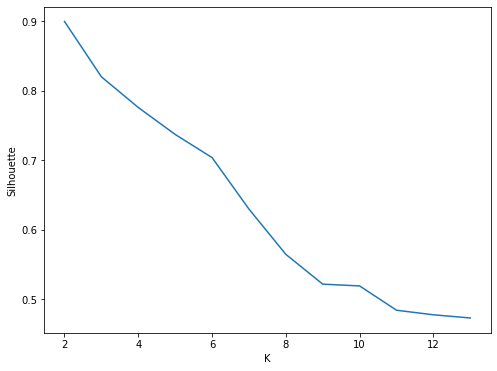

In [58]:
# visualizzo i silhouette scores in un plot 
fig, ax = plt.subplots(1,1, figsize = (8,6))
ax.plot(range(2,14), silhouette_score)
ax.set_xlabel('K')
ax.set_ylabel('Silhouette')

In [59]:
# run k-means with k = 3
KMeans_algo=KMeans(featuresCol='features',
                   k=2,
                   seed=0)
KMeans_fit=KMeans_algo.fit(df3)
centers = KMeans_fit.clusterCenters()

In [60]:
transformed = KMeans_fit.transform(assembled_data3
                                  ).select('C-Sensor','prediction')
rows= transformed.collect()

In [61]:
df_pred0811 = spark.createDataFrame(rows)
df_pred = df_pred0811.join(join_df3,'C-Sensor')
# sensor per cluster
df_pred0811.groupby('prediction'
                   ).count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         0|   32|
|         1|    3|
+----------+-----+



(35, 18)


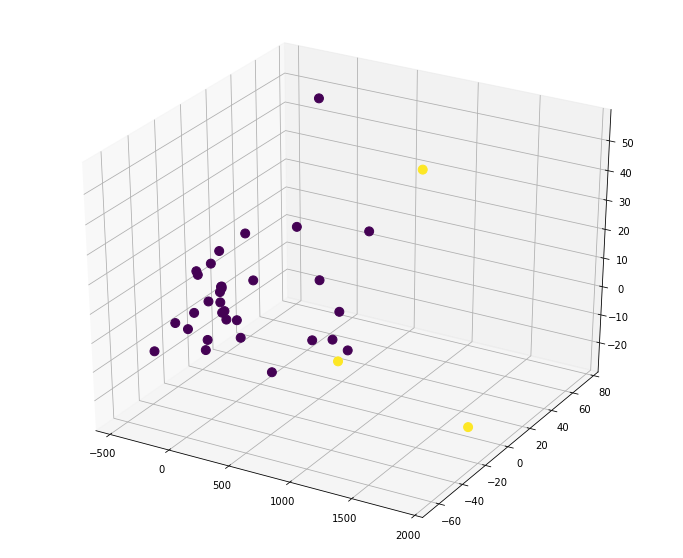

In [62]:
df_pd = df_pred.toPandas()
print(df_pd.shape)
sensors = df_pd['C-Sensor']
df_pd.set_index('C-Sensor',
                inplace=True)
cluster_labels = df_pd['prediction']
df_pd.drop('prediction',
           axis = 1,
           inplace=True)

pca = PCA(3,random_state=42)
pca.fit(df_pd)
pca_proj = pca.transform(df_pd)

pca_proj = pd.DataFrame(pca_proj,
                        columns=['pca1', 'pca2','pca3'])
pca_proj['C-Sensor'] = sensors
pca_proj.set_index('C-Sensor',
                   inplace=True)
pca_proj = pca_proj.join(cluster_labels,
                         on ='C-Sensor')

threedee = plt.figure(figsize=(12,10)).gca(projection='3d')
threedee.scatter(pca_proj.pca1,
                 pca_proj.pca2,
                 pca_proj.pca3,
                 c=pca_proj.prediction,
                 alpha=1,
                 s=80)
plt.show()

In [63]:
sensor_map = {}
for sensor, label in zip(cluster_labels.index, cluster_labels):
    if label not in sensor_map:
        sensor_map[label] = []
        sensor_map[label].append(sensor)
    else:
        sensor_map[label].append(sensor)

print('Clustering composition: 2008 - 2011')
for k,v in sensor_map.items():
    sensor_map[k] = v.sort()
    print(k, '-->', v, '\n')


Clustering composition: 2008 - 2011
0 --> ['1-San Diego', '1002-Contra Costa', '1002-Los Angeles', '1003-Orange', '1004-Contra Costa', '1004-Humboldt', '1005-Humboldt', '1010-San Diego', '1025-Santa Barbara', '11-Alameda', '1103-Los Angeles', '2-Contra Costa', '2-Sacramento', '2004-Alameda', '2004-Santa Barbara', '2007-San Diego', '2009-Santa Clara', '2011-Santa Barbara', '3-San Diego', '3-Santa Cruz', '3001-Contra Costa', '306-San Bernardino', '4-Solano', '4002-Los Angeles', '4003-Santa Barbara', '4006-Los Angeles', '5-Imperial', '5-San Francisco', '5-Santa Clara', '5005-Los Angeles', '6-Sacramento', '6-Solano'] 

1 --> ['2002-San Bernardino', '8-Fresno', '8001-Riverside'] 



## Clustering 2012- 2015

In [26]:
from pyspark.ml.linalg import Vectors
from pyspark.ml.clustering import KMeans

cluster_20122015raw = df_clust_year.select('*').where(df_clust_year['4year'] == 4)
cluster_20122015raw = cluster_20122015raw.drop('4year')
cluster_20122015_data = cluster_20122015raw.select('C-Sensor', 'min(NO2 1st Max Value)',
                                                   'min(O3 1st Max Value)','min(SO2 1st Max Value)','min(CO 1st Max Value)',
                                                   'max(NO2 1st Max Value)','max(O3 1st Max Value)','max(SO2 1st Max Value)',
                                                   'max(CO 1st Max Value)','avg(NO2 Mean)','avg(O3 Mean)',
                                                   'avg(SO2 Mean)','avg(CO Mean)')

join_df4 = cluster_20122015_data.join(r4, 'C-Sensor', 'inner')

cols = join_df4.columns[1:]
assemble4=VectorAssembler(inputCols=cols,
                          outputCol='features')
assembled_data4=assemble4.transform(join_df4)
#######################################################################
data = []

features = assembled_data4.sort('C-Sensor').toPandas()['features'].tolist()
sites = assembled_data4.sort('C-Sensor').toPandas()['C-Sensor'].tolist()

for f, s in zip(features, sites):
    data.append((Vectors.dense(f), s))

df4 = spark.createDataFrame(data, ["features", "C-Sensor"])

######################################################################
silhouette_score=[]
evaluator = ClusteringEvaluator(predictionCol='prediction',
                                featuresCol='features', \
                                metricName='silhouette',
                                distanceMeasure='squaredEuclidean')
for i in range(2,14):
    
    KMeans_algo=KMeans(featuresCol='features',
                       k=i,
                       seed=3)
    
    KMeans_fit=KMeans_algo.fit(df4)
    
    output=KMeans_fit.transform(df4)
    
    score=evaluator.evaluate(output)  
    silhouette_score.append(score)
    
    print('K = ',i)
    print("Silhouette Score:",score)

K =  2
Silhouette Score: 0.8838991139339714
K =  3
Silhouette Score: 0.9029977457115108
K =  4
Silhouette Score: 0.7331643739752081
K =  5
Silhouette Score: 0.5880045080358809
K =  6
Silhouette Score: 0.5762327508817484
K =  7
Silhouette Score: 0.5143566871039061
K =  8
Silhouette Score: 0.5119291628355045
K =  9
Silhouette Score: 0.37171161680810216
K =  10
Silhouette Score: 0.23957645436378813
K =  11
Silhouette Score: 0.45253958838157265
K =  12
Silhouette Score: 0.42465324269882837
K =  13
Silhouette Score: 0.35855710420074244


Text(0, 0.5, 'Silhouette')

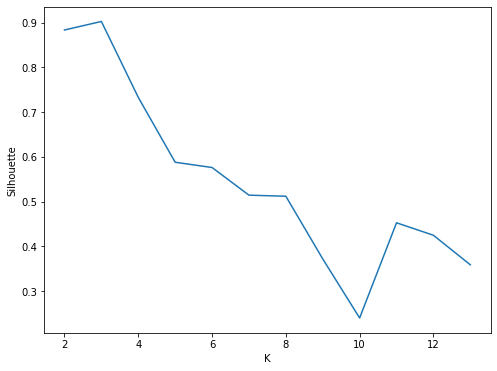

In [27]:
# visualizzo i silhouette scores in un plot 
fig, ax = plt.subplots(1,1, figsize = (8,6))
ax.plot(range(2,14), silhouette_score)
ax.set_xlabel('K')
ax.set_ylabel('Silhouette')

In [68]:
# run k-means with k = 2
KMeans_algo= KMeans(featuresCol='features',
                    k=2,
                    seed=0)
KMeans_fit=KMeans_algo.fit(df4)
centers = KMeans_fit.clusterCenters()

transformed = KMeans_fit.transform(assembled_data4
                                  ).select('C-Sensor','prediction')
rows= transformed.collect()

In [69]:
df_pred1215 = spark.createDataFrame(rows)
df_pred = df_pred1215.join(join_df4,'C-Sensor')
# sensor per cluster
df_pred1215.groupby('prediction'
                   ).count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         0|   24|
|         1|    2|
+----------+-----+



(26, 18)


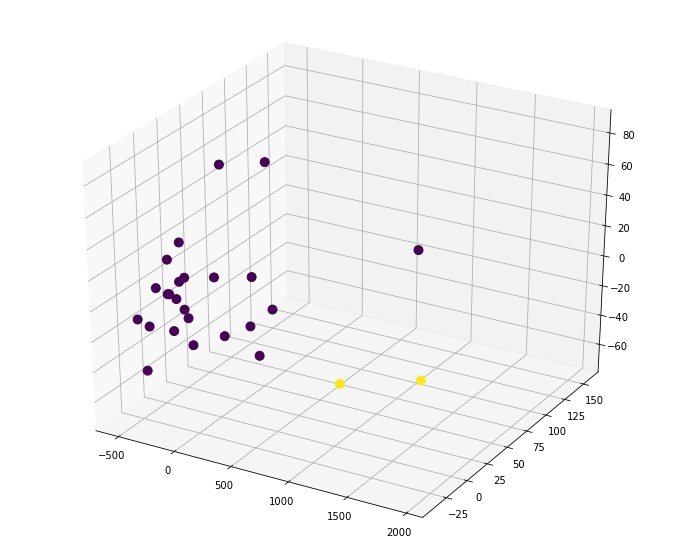

In [70]:
df_pd = df_pred.toPandas()
print(df_pd.shape)
sensors = df_pd['C-Sensor']
df_pd.set_index('C-Sensor',
                inplace=True)
cluster_labels = df_pd['prediction']
df_pd.drop('prediction',
           axis = 1,
           inplace=True)

pca = PCA(3,random_state=42)
pca.fit(df_pd)
pca_proj = pca.transform(df_pd)

pca_proj = pd.DataFrame(pca_proj,
                        columns=['pca1', 'pca2','pca3'])
pca_proj['C-Sensor'] = sensors
pca_proj.set_index('C-Sensor',
                   inplace=True)
pca_proj = pca_proj.join(cluster_labels,
                         on ='C-Sensor')

threedee = plt.figure(figsize=(12,10)).gca(projection='3d')
threedee.scatter(pca_proj.pca1,
                 pca_proj.pca2,
                 pca_proj.pca3,
                 c=pca_proj.prediction,
                 alpha=1,
                 s=80)

plt.show()

In [71]:
sensor_map = {}
for sensor, label in zip(cluster_labels.index, cluster_labels):
    if label not in sensor_map:
        sensor_map[label] = []
        sensor_map[label].append(sensor)
    else:
        sensor_map[label].append(sensor)

print('Clustering composition: 2013 - 2015')
for k,v in sensor_map.items():
    sensor_map[k] = v.sort()
    print(k, '-->', v, '\n')


Clustering composition: 2013 - 2015
0 --> ['1002-Contra Costa', '1002-Los Angeles', '1003-Orange', '1004-Contra Costa', '1004-Humboldt', '1005-Humboldt', '1018-San Diego', '1025-Santa Barbara', '11-Alameda', '11-Fresno', '1103-Los Angeles', '2-Contra Costa', '2004-Santa Barbara', '2009-Santa Clara', '3-San Diego', '306-San Bernardino', '4-Solano', '4002-Los Angeles', '4003-Santa Barbara', '4006-Los Angeles', '5-Imperial', '5-Santa Clara', '5005-Los Angeles', '6-Sacramento'] 

1 --> ['2002-San Bernardino', '8001-Riverside'] 



In [72]:
# rinonimo le colonne 
df_pred0003 = df_pred0003.withColumnRenamed('prediction',
                                            'cluster 2000-2003')

df_pred0407 = df_pred0407.withColumnRenamed('prediction',
                                            'cluster 2004-2007')

df_pred0811 = df_pred0811.withColumnRenamed('prediction',
                                            'cluster 2008-2011')

df_pred1215 = df_pred1215.withColumnRenamed('prediction',
                                            'cluster 2012-2015')

In [87]:
output_clustering = df_pred0003.join(df_pred0407, 'C-Sensor', 'outer'
                                    ).join(df_pred0811, 'C-Sensor', 'outer'
                                          ).join(df_pred1215, 'C-Sensor', 'outer')

output_clustering.show(70)

+-------------------+-----------------+-----------------+-----------------+-----------------+
|           C-Sensor|cluster 2000-2003|cluster 2004-2007|cluster 2008-2011|cluster 2012-2015|
+-------------------+-----------------+-----------------+-----------------+-----------------+
|     2007-San Diego|                0|                0|                0|             null|
|  3001-Contra Costa|                0|                0|                0|             null|
| 306-San Bernardino|                1|                1|                0|                0|
|      1004-Humboldt|             null|                0|                0|                0|
|        1-San Diego|                0|                0|                0|             null|
|   5001-Los Angeles|                0|                0|             null|             null|
|     1018-San Diego|             null|             null|             null|                0|
| 1025-Santa Barbara|                0|                0|   

In [95]:
LA_sensors = output_clustering.filter(col('C-Sensor'
                                         ).isin(['1103-Los Angeles', '4006-Los Angeles',
                                                 '31-Los Angeles','1002-Los Angeles',
                                                 '30-Los Angeles', '4002-Los Angeles', '5001-Los Angeles'])).show()

+----------------+-----------------+-----------------+-----------------+-----------------+
|        C-Sensor|cluster 2000-2003|cluster 2004-2007|cluster 2008-2011|cluster 2012-2015|
+----------------+-----------------+-----------------+-----------------+-----------------+
|5001-Los Angeles|                0|                0|             null|             null|
|4002-Los Angeles|                0|                0|                0|                0|
|  30-Los Angeles|                0|             null|             null|             null|
|1002-Los Angeles|                1|                1|                0|                0|
|1103-Los Angeles|                1|                1|                0|                0|
|  31-Los Angeles|                0|             null|             null|             null|
|4006-Los Angeles|             null|             null|                0|                0|
+----------------+-----------------+-----------------+-----------------+-----------------+

Il valore **NULL** indica che in quel quadriennio il **sensore non era attivo**.

In [74]:
# seleziono i sensori che non cambiano mai cluster dal 2000 al 2015
output_clustering.select('C-Sensor'
                        ).where(output_clustering['cluster 2000-2003'] == output_clustering['cluster 2004-2007']
                               ).where(output_clustering['cluster 2004-2007'] == output_clustering['cluster 2008-2011']
                                      ).where(output_clustering['cluster 2008-2011'] == output_clustering['cluster 2012-2015']
                                             ).show()

+------------------+
|          C-Sensor|
+------------------+
|        5-Imperial|
|1025-Santa Barbara|
|       1003-Orange|
|          4-Solano|
|2004-Santa Barbara|
| 1002-Contra Costa|
|4003-Santa Barbara|
| 1004-Contra Costa|
|    2-Contra Costa|
|    8001-Riverside|
|  4002-Los Angeles|
+------------------+



Sensori che cambiano cluster solo nell'ultimo quadriennio (2012-2015)

In [75]:
output_clustering.select('C-Sensor'
                        ).where(output_clustering['cluster 2000-2003'] == output_clustering['cluster 2004-2007']
                               ).where(output_clustering['cluster 2004-2007'] == output_clustering['cluster 2008-2011']
                                      ).where(output_clustering['cluster 2008-2011'] != output_clustering['cluster 2012-2015']
                                             ).show()

+--------+
|C-Sensor|
+--------+
+--------+



Sensori che cambiano cluster solo nel penultimo quadriennio (2008-2011) per poi ritornare in quello di partenza

In [84]:
output_clustering.select('C-Sensor'
                        ).where(output_clustering['cluster 2000-2003'] == output_clustering['cluster 2004-2007']
                               ).where(output_clustering['cluster 2004-2007'] != output_clustering['cluster 2008-2011']
                                      ).where(output_clustering['cluster 2008-2011'] == output_clustering['cluster 2012-2015']
                                             ).show()

+------------------+
|          C-Sensor|
+------------------+
|      6-Sacramento|
|  1103-Los Angeles|
|306-San Bernardino|
|  1002-Los Angeles|
+------------------+



In [85]:
output_clustering.select('C-Sensor'
                        ).where(output_clustering['cluster 2000-2003'] != output_clustering['cluster 2004-2007']
                               ).where(output_clustering['cluster 2004-2007'] == output_clustering['cluster 2008-2011']
                                      ).where(output_clustering['cluster 2008-2011'] == output_clustering['cluster 2012-2015']
                                             ).show()

+--------+
|C-Sensor|
+--------+
+--------+



In [88]:
output_clustering.select('C-Sensor'
                        ).where(output_clustering['cluster 2000-2003'] == output_clustering['cluster 2004-2007']
                               ).where(output_clustering['cluster 2004-2007'] != output_clustering['cluster 2008-2011']
                                      ).where(output_clustering['cluster 2008-2011'] != output_clustering['cluster 2012-2015']
                                             ).show()

+--------+
|C-Sensor|
+--------+
+--------+



### Studio la composizione dei cluster per anno

##### 2012 - 2015

In [78]:
join1215 = cluster_20122015_data.join(df_pred1215,'C-Sensor')
join1215.groupby('cluster 2012-2015'
                ).mean().toPandas().head()

,cluster 2012-2015,avg(min(NO2 1st Max Value)),avg(min(O3 1st Max Value)),avg(min(SO2 1st Max Value)),avg(min(CO 1st Max Value)),avg(max(NO2 1st Max Value)),avg(max(O3 1st Max Value)),avg(max(SO2 1st Max Value)),avg(max(CO 1st Max Value)),avg(avg(NO2 Mean)),avg(avg(O3 Mean)),avg(avg(SO2 Mean)),avg(avg(CO Mean)),avg(cluster 2012-2015)
0,0,1.804167,0.005417,-0.233333,-0.000542,64.75,0.07975,27.154167,3.320625,10.422891,0.026652,0.517011,0.345523,0.0
1,1,2.000000,0.001500,-0.100000,-0.050000,75.40,0.11350,5.900000,3.427500,17.874586,0.028740,0.311830,0.303344,1.0


**NOTA :** Cluster 2 ha valori alti di max SO2, seguito da Cluster 0 e Cluster 1.
Cluster 0 ha val max di NO2 seguito da Cluster 2 e 1. 
Cluster 0 risulta essere il cluster con valori max di O3 più alti. 

##### 2008 - 2011

In [79]:
join0811 = cluster_20082011_data.join(df_pred0811,'C-Sensor')
join0811.groupby('cluster 2008-2011'
                ).mean().toPandas().head()

,cluster 2008-2011,avg(min(NO2 1st Max Value)),avg(min(O3 1st Max Value)),avg(min(SO2 1st Max Value)),avg(min(CO 1st Max Value)),avg(max(NO2 1st Max Value)),avg(max(O3 1st Max Value)),avg(max(SO2 1st Max Value)),avg(max(CO 1st Max Value)),avg(avg(NO2 Mean)),avg(avg(O3 Mean)),avg(avg(SO2 Mean)),avg(avg(CO Mean)),avg(cluster 2008-2011)
0,0,2.95,0.005844,1.734723e-18,0.058219,71.646875,0.080375,20.696875,3.410562,11.866717,0.025174,0.919681,0.377912,0.0
1,1,1.00,0.002333,0.000000e+00,0.000000,91.666667,0.125333,37.933333,2.900000,17.336169,0.029118,0.900869,0.362876,1.0


##### 2004 - 2007

In [80]:
join0407 = cluster_20042007_data.join(df_pred0407,'C-Sensor')
join0407.groupby('cluster 2004-2007'
                ).mean().toPandas().head()

,cluster 2004-2007,avg(min(NO2 1st Max Value)),avg(min(O3 1st Max Value)),avg(min(SO2 1st Max Value)),avg(min(CO 1st Max Value)),avg(max(NO2 1st Max Value)),avg(max(O3 1st Max Value)),avg(max(SO2 1st Max Value)),avg(max(CO 1st Max Value)),avg(avg(NO2 Mean)),avg(avg(O3 Mean)),avg(avg(SO2 Mean)),avg(avg(CO Mean)),avg(cluster 2004-2007)
0,0,4.160000,0.00524,0.132,0.080000,70.560000,0.07496,39.520000,3.764000,12.927713,0.024955,1.539806,0.451968,0.0
1,1,4.142857,0.00300,0.000,0.057143,103.285714,0.11100,21.428571,4.485714,19.751609,0.025627,1.178840,0.488447,1.0


##### 2000 - 2003

In [81]:
join0003 = cluster_20002003_data.join(df_pred0003,'C-Sensor')
join0003.groupby('cluster 2000-2003'
                ).mean().toPandas().head()

,cluster 2000-2003,avg(min(NO2 1st Max Value)),avg(min(O3 1st Max Value)),avg(min(SO2 1st Max Value)),avg(min(CO 1st Max Value)),avg(max(NO2 1st Max Value)),avg(max(O3 1st Max Value)),avg(max(SO2 1st Max Value)),avg(max(CO 1st Max Value)),avg(avg(NO2 Mean)),avg(avg(O3 Mean)),avg(avg(SO2 Mean)),avg(avg(CO Mean)),avg(cluster 2000-2003)
0,0,4.640,0.00396,0.112,0.0720,93.72,0.07924,46.56,6.184,16.118754,0.024523,1.845347,0.599632,0.0
1,1,7.375,0.00175,0.000,0.0375,123.50,0.11300,37.00,5.725,22.300148,0.026205,1.443908,0.673144,1.0


# ---------------------------------------------------------------------------------------------------------------

# Random Forest AQI

#### Genero DataSet

In [10]:
p = kdd_df.select('NO2 Mean','NO2 1st Max Value','NO2 1st Max Hour','NO2 AQI','O3 Mean','O3 1st Max Value',\
                  'O3 1st Max Hour','O3 AQI','SO2 Mean','SO2 1st Max Value','SO2 1st Max Hour','SO2 AQI','CO Mean',\
                  'CO 1st Max Value','CO 1st Max Hour','CO AQI')

La Label "AQI" viene generata considerando il valore massimo di ogni riga tra le colonne dei vari AQI, ovvero:
"NO2 AQI", "O3 AQI", "SO2 AQI", "CO AQI"

In [11]:


p = kdd_df.select('NO2 Mean','NO2 1st Max Value','NO2 1st Max Hour','NO2 AQI','O3 Mean','O3 1st Max Value',\
                  'O3 1st Max Hour','O3 AQI','SO2 Mean','SO2 1st Max Value','SO2 1st Max Hour','SO2 AQI','CO Mean',\
                  'CO 1st Max Value','CO 1st Max Hour','CO AQI')

from pyspark.sql.functions import greatest
aqi = p.withColumn('AQI',
                   greatest("NO2 AQI", "O3 AQI", "SO2 AQI", "CO AQI"))
aqi.show(3)

+---------+-----------------+----------------+-------+--------+----------------+---------------+------+--------+-----------------+----------------+-------+--------+----------------+---------------+------+----+
| NO2 Mean|NO2 1st Max Value|NO2 1st Max Hour|NO2 AQI| O3 Mean|O3 1st Max Value|O3 1st Max Hour|O3 AQI|SO2 Mean|SO2 1st Max Value|SO2 1st Max Hour|SO2 AQI| CO Mean|CO 1st Max Value|CO 1st Max Hour|CO AQI| AQI|
+---------+-----------------+----------------+-------+--------+----------------+---------------+------+--------+-----------------+----------------+-------+--------+----------------+---------------+------+----+
|16.347826|             35.0|               5|     33|0.041708|           0.063|              9|    61| 1.73913|              2.0|               0|    3.0|0.582609|             1.5|              6|  11.0|61.0|
|16.347826|             35.0|               5|     33|0.041708|           0.063|              9|    61| 1.73913|              2.0|               0|    3.0|0.620

In [12]:
aqi = aqi.select('NO2 Mean','NO2 1st Max Value','NO2 1st Max Hour','O3 Mean','O3 1st Max Value',\
                  'O3 1st Max Hour','SO2 Mean','SO2 1st Max Value','SO2 1st Max Hour','CO Mean',\
                  'CO 1st Max Value','CO 1st Max Hour','AQI')

In [13]:
aqi.groupby().count().show()

+-------+
|  count|
+-------+
|1746262|
+-------+



Conversione di AQI in Label Numerico per la classificazione, considerando i range reali di tasso d'inquinamento

In [14]:
def labelrisk(value):
    if int(value) >= 0 and int(value) < 51: return 0 # eccellente
    elif int(value) >= 51 and int(value) < 100: return 1 # buono
    elif int(value) >= 101 and int(value) < 150: return 2 # lievemente inquinato
    elif int(value) >= 150 and int(value) < 200: return 3 # discretamente inquinato
    else: return 4 # altamente inquinato 
    
udf_labelrisk = udf(labelrisk, IntegerType())
aqi = aqi.withColumn('risk',
                     udf_labelrisk("AQI"))

aqi = aqi.drop('AQI')
aqi.show()

+---------+-----------------+----------------+--------+----------------+---------------+--------+-----------------+----------------+--------+----------------+---------------+----+
| NO2 Mean|NO2 1st Max Value|NO2 1st Max Hour| O3 Mean|O3 1st Max Value|O3 1st Max Hour|SO2 Mean|SO2 1st Max Value|SO2 1st Max Hour| CO Mean|CO 1st Max Value|CO 1st Max Hour|risk|
+---------+-----------------+----------------+--------+----------------+---------------+--------+-----------------+----------------+--------+----------------+---------------+----+
|16.347826|             35.0|               5|0.041708|           0.063|              9| 1.73913|              2.0|               0|0.582609|             1.5|              6|   1|
|16.347826|             35.0|               5|0.041708|           0.063|              9| 1.73913|              2.0|               0|0.620833|             1.0|              9|   1|
|16.347826|             35.0|               5|0.041708|           0.063|              9|1.685714|   

In [15]:
aqi.groupby('risk').count().show()

+----+-------+
|risk|  count|
+----+-------+
|   1| 229348|
|   3|   4234|
|   4|   4766|
|   2|  35534|
|   0|1472380|
+----+-------+



Raggruppiamo i vari valori delle colonne nella colonna Features, utile al modello per l'esecuzione del task

In [16]:
from pyspark.ml.feature import VectorAssembler

assemble=VectorAssembler(inputCols=aqi.columns[:-1],
                         outputCol='features')
assembled_df=assemble.transform(aqi)

assembled_df.show(2)

+---------+-----------------+----------------+--------+----------------+---------------+--------+-----------------+----------------+--------+----------------+---------------+----+--------------------+
| NO2 Mean|NO2 1st Max Value|NO2 1st Max Hour| O3 Mean|O3 1st Max Value|O3 1st Max Hour|SO2 Mean|SO2 1st Max Value|SO2 1st Max Hour| CO Mean|CO 1st Max Value|CO 1st Max Hour|risk|            features|
+---------+-----------------+----------------+--------+----------------+---------------+--------+-----------------+----------------+--------+----------------+---------------+----+--------------------+
|16.347826|             35.0|               5|0.041708|           0.063|              9| 1.73913|              2.0|               0|0.582609|             1.5|              6|   1|[16.347826,35.0,5...|
|16.347826|             35.0|               5|0.041708|           0.063|              9| 1.73913|              2.0|               0|0.620833|             1.0|              9|   1|[16.347826,35.0,5

Rinomino "risk" in "label"

In [17]:
df = assembled_df.withColumnRenamed('risk','label')

Si divide il DataSet in Training e Test Set mediante hold out (70% train - 30% test)

In [18]:
# Split the data into training and test sets (30% held out for testing)
(trainingData, testData) = df.randomSplit([0.7, 0.3], seed=0)
print("Training Dataset Count: " + str(trainingData.count()))
print("Test Dataset Count: " + str(testData.count()))

Training Dataset Count: 1222348
Test Dataset Count: 523914


In [19]:
trainingData.columns

['NO2 Mean',
 'NO2 1st Max Value',
 'NO2 1st Max Hour',
 'O3 Mean',
 'O3 1st Max Value',
 'O3 1st Max Hour',
 'SO2 Mean',
 'SO2 1st Max Value',
 'SO2 1st Max Hour',
 'CO Mean',
 'CO 1st Max Value',
 'CO 1st Max Hour',
 'label',
 'features']

In [21]:
trainingData.groupby('label').count().show()

+-----+-------+
|label|  count|
+-----+-------+
|    1| 160643|
|    3|   2989|
|    4|   3352|
|    2|  24908|
|    0|1030456|
+-----+-------+



In [22]:
testData.groupby('label').count().show()

+-----+------+
|label| count|
+-----+------+
|    1| 68705|
|    3|  1245|
|    4|  1414|
|    2| 10626|
|    0|441924|
+-----+------+



In [23]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(featuresCol = 'features',
                            labelCol = 'label')
rfModel = rf.fit(trainingData)
predictions = rfModel.transform(testData)
predictions.select('label', 'rawPrediction',
                   'prediction', 'probability'
                  ).show(2)

+-----+--------------------+----------+--------------------+
|label|       rawPrediction|prediction|         probability|
+-----+--------------------+----------+--------------------+
|    0|[19.5527054906201...|       0.0|[0.97763527453100...|
|    0|[19.4814446743588...|       0.0|[0.97407223371794...|
+-----+--------------------+----------+--------------------+
only showing top 2 rows



In [24]:
predictions.select("label", "prediction").show(10)

+-----+----------+
|label|prediction|
+-----+----------+
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
|    0|       0.0|
+-----+----------+
only showing top 10 rows



#### Valutazione delle performance del modello

In [25]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator = MulticlassClassificationEvaluator(labelCol="label",
                                              predictionCol="prediction")

accuracy = evaluator.evaluate(predictions)
print("Accuracy = %s" % (accuracy))
print("Test Error = %s" % (1.0 - accuracy))

Accuracy = 0.9463457462881496
Test Error = 0.0536542537118504


In [26]:
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.sql.types import FloatType
import pyspark.sql.functions as F

preds_and_labels = predictions.select(['prediction','label']
                                     ).withColumn('label',
                                                  F.col('label').cast(FloatType())
                                                 ).orderBy('prediction')

preds_and_labels = preds_and_labels.select(['prediction','label'])
metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))
cf_matrix = metrics.confusionMatrix().toArray()
print(cf_matrix)

[[4.37108e+05 4.81600e+03 0.00000e+00 0.00000e+00 0.00000e+00]
 [1.07390e+04 5.68150e+04 1.15100e+03 0.00000e+00 0.00000e+00]
 [6.33000e+02 5.82300e+03 4.17000e+03 0.00000e+00 0.00000e+00]
 [3.30000e+01 2.27000e+02 9.85000e+02 0.00000e+00 0.00000e+00]
 [3.20000e+01 9.79000e+02 4.03000e+02 0.00000e+00 0.00000e+00]]


#### Confusion Matrix in Percentuale

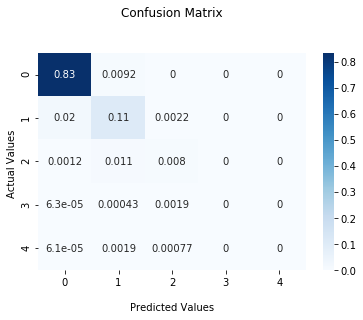

In [27]:
import seaborn as sns

ax = sns.heatmap(cf_matrix/np.sum(cf_matrix),
                 annot=True,
                 cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0','1', '2', '3', '4'])

## Visualizzazione confusion matrix
plt.show()

#### Confusion Matrix in valore assoluto

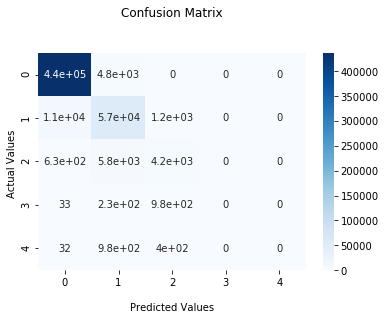

In [28]:
ax = sns.heatmap(cf_matrix,
                 annot=True,
                 cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0','1', '2', '3', '4'])

## Visualizzazione Confusion Matrix.
plt.show()

In [29]:
# Statistics by class
for label in range(0,5):
    print("Class %s precision = %s" % (label, metrics.precision(label)))
    print("Class %s recall = %s" % (label, metrics.recall(label)))
    print("--------------------- \n")
    #print("Class %s F1 Measure = %s" % (label, metrics.fMeasure(label, beta=1.0)))
    

Class 0 precision = 0.9745020009140666
Class 0 recall = 0.9891021985680796
--------------------- 

Class 1 precision = 0.8274832508010487
Class 1 recall = 0.8269412706498799
--------------------- 

Class 2 precision = 0.62155313757639
Class 2 recall = 0.3924336533032185
--------------------- 

Class 3 precision = 0.0
Class 3 recall = 0.0
--------------------- 

Class 4 precision = 0.0
Class 4 recall = 0.0
--------------------- 



# undersampling

In [30]:
from pyspark.sql.functions import col, explode, array, lit
_0_df = trainingData.filter(col("label") == 0)
_1_df = trainingData.filter(col("label") == 1)
_2_df = trainingData.filter(col("label") == 2)
_3_df = trainingData.filter(col("label") == 3)
_4_df = trainingData.filter(col("label") == 4)


#### Riduzione del numero di record appartenenti alle due classi di maggioranza, considerando una frazione del loro numero iniziale

In [31]:
ratio = 85
ratio_1 = 24
ratio_2 = 6

under0_df = _0_df.sample(False, 1/ratio)
under1_df = _1_df.sample(False, 1/ratio_1)
under2_df = _2_df.sample(False, 1/ratio_2)

# combine both oversampled minority rows and previous majority rows 
train = under0_df.unionAll(_4_df
                                ).unionAll(_3_df
                                          ).unionAll(under2_df
                                                    ).unionAll(under1_df)

In [32]:
train.groupby('label').count().show()

+-----+-----+
|label|count|
+-----+-----+
|    1| 6784|
|    3| 2989|
|    4| 3352|
|    2| 4100|
|    0|12093|
+-----+-----+



In [34]:
train = train.select("features","label")
train.show(2)

+--------------------+-----+
|            features|label|
+--------------------+-----+
|[0.041667,1.0,19....|    0|
|[0.104167,0.9,10....|    0|
+--------------------+-----+
only showing top 2 rows



In [35]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(featuresCol = 'features',
                            labelCol = 'label')
rfModel = rf.fit(train)
predictions = rfModel.transform(testData)

In [36]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator = MulticlassClassificationEvaluator(labelCol="label",
                                              predictionCol="prediction")

accuracy = evaluator.evaluate(predictions)
print("Accuracy = %s" % (accuracy))
print("Test Error = %s" % (1.0 - accuracy))

Accuracy = 0.9574001301690992
Test Error = 0.042599869830900805


In [37]:
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.sql.types import FloatType
import pyspark.sql.functions as F

preds_and_labels = predictions.select(['prediction','label']
                                     ).withColumn('label',
                                                  F.col('label').cast(FloatType())
                                                 ).orderBy('prediction')

preds_and_labels = preds_and_labels.select(['prediction','label'])
metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))
cf_matrix = metrics.confusionMatrix().toArray()
print(cf_matrix)

[[4.30677e+05 1.12400e+04 0.00000e+00 0.00000e+00 7.00000e+00]
 [7.57300e+03 6.02780e+04 0.00000e+00 0.00000e+00 8.54000e+02]
 [2.99000e+02 1.75900e+03 8.25000e+03 1.19000e+02 1.99000e+02]
 [1.10000e+01 3.70000e+01 1.38000e+02 1.05700e+03 2.00000e+00]
 [2.20000e+01 2.84000e+02 0.00000e+00 1.05000e+02 1.00300e+03]]


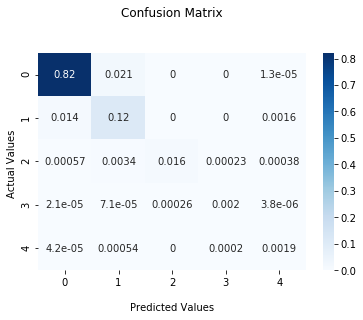

In [38]:
# percentuale
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0','1', '2', '3', '4'])

## Visualizzazione Confusion Matrix.
plt.show()

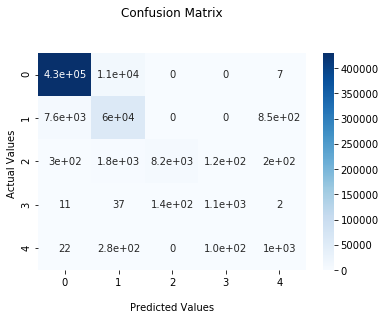

In [39]:
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0','1', '2', '3', '4'])

## Visualizzazione Confusion Matrix.
plt.show()

In [40]:
# Statistics by class
for label in range(0,5):
    print("Class %s precision = %s" % (label, metrics.precision(label)))
    print("Class %s recall = %s" % (label, metrics.recall(label)))
    print("--------------------- \n")
    #print("Class %s F1 Measure = %s" % (label, metrics.fMeasure(label, beta=1.0)))

Class 0 precision = 0.9819760044871882
Class 0 recall = 0.9745499226111277
--------------------- 

Class 1 precision = 0.8190168211092693
Class 1 recall = 0.8773451713849065
--------------------- 

Class 2 precision = 0.9835479256080114
Class 2 recall = 0.7763975155279503
--------------------- 

Class 3 precision = 0.825136612021858
Class 3 recall = 0.8489959839357429
--------------------- 

Class 4 precision = 0.4857142857142857
Class 4 recall = 0.7093352192362093
--------------------- 



##### Considerazioni:
Il modello ottiene performance migliori sull'undersampling



# Logistic Regression

In [41]:
# preparo il dataset

df_low= df.filter(df['label']== 0)
df_high1= df.filter(df['label']== 3)
df_high2 = df.filter(df['label']==4)

new_df = df_low.unionAll(df_high1
                        ).unionAll(df_high2)


def binary_encoding(value):
    if int(value) == 3 or int(value) == 4: return 1 
    else:
        return 0
    
udf_labelrisk = udf(binary_encoding, IntegerType())
new_df = new_df.withColumn('label_encoded',
                           udf_labelrisk("label"))

new_df = new_df.drop('label')
new_df = new_df.withColumnRenamed('label_encoded', 'label')
new_df = new_df.select('features', 'label')
new_df.show(2)

+--------------------+-----+
|            features|label|
+--------------------+-----+
|[28.652174,46.0,1...|    0|
|[28.652174,46.0,1...|    0|
+--------------------+-----+
only showing top 2 rows



In [42]:
new_df.groupby('label').count().show()

+-----+-------+
|label|  count|
+-----+-------+
|    1|   9000|
|    0|1472380|
+-----+-------+



In [43]:
# Split the data into training and test sets (30% held out for testing)
(train, test) = new_df.randomSplit([0.7, 0.3], seed=1)
print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))

Training Dataset Count: 1036661
Test Dataset Count: 444719


In [44]:
# test distribuzione dati
test.groupby('label').count().show()

+-----+------+
|label| count|
+-----+------+
|    1|  2751|
|    0|441968|
+-----+------+



In [45]:
# train distribuzione dati
train.groupby('label').count().show()

+-----+-------+
|label|  count|
+-----+-------+
|    1|   6249|
|    0|1030412|
+-----+-------+



In [47]:
from pyspark.ml.classification import LogisticRegression
lr = LogisticRegression(maxIter=10,
                        regParam=0.5,
                        elasticNetParam=0)

In [48]:
# Fit del modello
lrModel = lr.fit(train)
predictions = lrModel.transform(test)
#predictions_train = lrModel.transform(train)
predictions.select('label','features',
                   'rawPrediction','prediction','probability'
                  ).show()

+-----+--------------------+--------------------+----------+--------------------+
|label|            features|       rawPrediction|prediction|         probability|
+-----+--------------------+--------------------+----------+--------------------+
|    0|(12,[0,1,2,3,4,5]...|[5.03833636305108...|       0.0|[0.99355725093306...|
|    0|(12,[0,1,2,3,4,5]...|[5.03833636305108...|       0.0|[0.99355725093306...|
|    0|(12,[0,1,2,3,4,5]...|[5.08270934810307...|       0.0|[0.99383516106317...|
|    0|(12,[0,1,2,3,4,5]...|[5.08270934810307...|       0.0|[0.99383516106317...|
|    0|(12,[0,1,2,3,4,8]...|[5.13836793209199...|       0.0|[0.99416696624563...|
|    0|(12,[0,1,2,3,4,8]...|[5.13836793209199...|       0.0|[0.99416696624563...|
|    0|(12,[3,4,5],[0.01...|[5.25100743128098...|       0.0|[0.99478510316534...|
|    0|[0.0,0.0,0.0,0.03...|[5.11202903777032...|       0.0|[0.99401222156632...|
|    0|[0.0,0.0,0.0,0.03...|[5.10975238710620...|       0.0|[0.99399865586104...|
|    0|[0.0,0.0,

In [49]:
# Print dei coefficienti e dell'intercetta della regressione logistica
print("Coefficients: " + str(lrModel.coefficients))
print("Intercept: " + str(lrModel.intercept))

Coefficients: [0.0010741788314132105,0.0009255001273387684,-0.00041222960407184627,2.8221774252621867,3.824311619914269,0.00026478208509232476,0.005361786308477482,0.0031194281005624174,0.00025505336917200355,0.015153505959905835,0.007239034299650863,-0.00014104759608474373]
Intercept: -5.382968963943451


#### Model Evaluation

In [50]:
# Model Evaluation
from pyspark.ml.evaluation import BinaryClassificationEvaluator
evaluator = BinaryClassificationEvaluator()
print('Test AUC:', evaluator.evaluate(predictions))

Test AUC: 0.9954595891897438


In [51]:
# vedo l'accuracy del modello
accuracy = predictions.filter(predictions.label == predictions.prediction).count() / float(predictions.count())
print("Accuracy : ",accuracy)

Accuracy :  0.993814071357419


In [52]:
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.sql.types import FloatType
import pyspark.sql.functions as F

preds_and_labels = predictions.select(['prediction','label']
                                     ).withColumn('label',
                                                  F.col('label').cast(FloatType())
                                                 ).orderBy('prediction')

preds_and_labels = preds_and_labels.select(['prediction','label'])
metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))

In [53]:
# Statistics by class
for label in range(0,2):
    print("Class %s precision = %s" % (label, metrics.precision(label)))
    print("Class %s recall = %s" % (label, metrics.recall(label)))
    print("--------------------- \n")

Class 0 precision = 0.993814071357419
Class 0 recall = 1.0
--------------------- 

Class 1 precision = 0.0
Class 1 recall = 0.0
--------------------- 



#### Undersampling

In [54]:
_0_df = train.filter(col("label") == 0)
_1_df = train.filter(col("label") == 1)

In [55]:
ratio = 100

under0_df = _0_df.sample(False, 1/ratio)

# combine both oversampled minority rows and previous majority rows 
train = under0_df.unionAll(_1_df)

In [56]:
train.groupby('label').count().show()

+-----+-----+
|label|count|
+-----+-----+
|    1| 6249|
|    0|10204|
+-----+-----+



#### Cross Validation e Parameter Tuning

In [39]:
# parameter tuning
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

paramGrid = (ParamGridBuilder()
            .addGrid(lr.regParam, [ 0.01, 0.5, 1])# regularization
            .addGrid(lr.elasticNetParam, [0.0, 0.5]) #elastic net parameter ridge=0
            .addGrid(lr.maxIter, [10]) # numero iterazioni
            .build())

cv = CrossValidator(estimator=lr,
                    estimatorParamMaps=paramGrid,
                    evaluator = evaluator, numFolds= 5)

cvModel = cv.fit(train)

Exception ignored in: <function JavaModelWrapper.__del__ at 0x7f63ac340700>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/pyspark/mllib/common.py", line 137, in __del__
    self._sc._gateway.detach(self._java_model)
AttributeError: 'MulticlassMetrics' object has no attribute '_sc'


In [40]:
# Best Model Performance
predictions = cvModel.transform(test)
print('Best Model Test AUC:', evaluator.evaluate(predictions))

Best Model Test AUC: 0.9942776357495542


In [41]:
# Best MOdel Feature Weights

weights = cvModel.bestModel.coefficients
weights = [(float(w),) for w in weights]
weightsDF = spark.createDataFrame(weights, ['Feature Weight'])
weightsDF.toPandas().head(10)

,Feature Weight
0,0.014007
1,0.009971
2,-0.006335
3,23.739286
4,16.008521
5,0.006557
6,0.013861
7,0.006687
8,0.005218
9,0.140429


In [42]:
# Best Model Parameters
best_model = cvModel.bestModel

print('Best Param(reg_params): ', best_model._java_obj.getRegParam())
print('Best Param(MaxIter): ', best_model._java_obj.getMaxIter())
print('Best Param(elasticNetParam): ', best_model._java_obj.getElasticNetParam())


Best Param(reg_params):  0.5
Best Param(MaxIter):  10
Best Param(elasticNetParam):  0.0


In [57]:
lr = LogisticRegression(maxIter=10,
                        regParam=0.5,
                        elasticNetParam=0.0)
# Fit the model
lrModel = lr.fit(train)
predictions = lrModel.transform(test)
#predictions_train = lrModel.transform(train)
predictions.select('label','features','rawPrediction',
                   'prediction','probability'
                  ).show()

+-----+--------------------+--------------------+----------+--------------------+
|label|            features|       rawPrediction|prediction|         probability|
+-----+--------------------+--------------------+----------+--------------------+
|    0|(12,[0,1,2,3,4,5]...|[0.79853242821867...|       0.0|[0.68966046580176...|
|    0|(12,[0,1,2,3,4,5]...|[0.79853242821867...|       0.0|[0.68966046580176...|
|    0|(12,[0,1,2,3,4,5]...|[1.09910071543203...|       0.0|[0.75009156883524...|
|    0|(12,[0,1,2,3,4,5]...|[1.09910071543203...|       0.0|[0.75009156883524...|
|    0|(12,[0,1,2,3,4,8]...|[1.52037358247967...|       0.0|[0.82059348592412...|
|    0|(12,[0,1,2,3,4,8]...|[1.52037358247967...|       0.0|[0.82059348592412...|
|    0|(12,[3,4,5],[0.01...|[2.16867539124114...|       0.0|[0.89740107084696...|
|    0|[0.0,0.0,0.0,0.03...|[1.30574386624561...|       0.0|[0.78680007917974...|
|    0|[0.0,0.0,0.0,0.03...|[1.30116488928877...|       0.0|[0.78603096672423...|
|    0|[0.0,0.0,

In [58]:
evaluator = BinaryClassificationEvaluator()
print('Test AUC:', evaluator.evaluate(predictions))

Test AUC: 0.9944274816891493


In [59]:
# vedo l'accuracy del modello
accuracy = predictions.filter(predictions.label == predictions.prediction).count() / float(predictions.count())
print("Accuracy : ",accuracy)

Accuracy :  0.997508539099971


In [60]:
preds_and_labels = predictions.select(['prediction','label']
                                     ).withColumn('label',
                                                  F.col('label').cast(FloatType())
                                                 ).orderBy('prediction')

preds_and_labels = preds_and_labels.select(['prediction','label'])
metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))

In [61]:
# Statistics by class
for label in range(0,2):
    print("Class %s precision = %s" % (label, metrics.precision(label)))
    print("Class %s recall = %s" % (label, metrics.recall(label)))
    print("--------------------- \n")

Class 0 precision = 0.9986382062325817
Class 0 recall = 0.9988551207327228
--------------------- 

Class 1 precision = 0.8094161958568739
Class 1 recall = 0.7811704834605598
--------------------- 



In [62]:
cf_matrix = metrics.confusionMatrix().toArray()

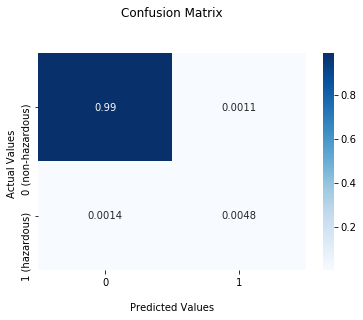

In [63]:
# percentuale
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix),
                 annot=True,
                 cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0 (non-hazardous)','1 (hazardous)'])

## Visualizzazione Confusion Matrix.
plt.show()

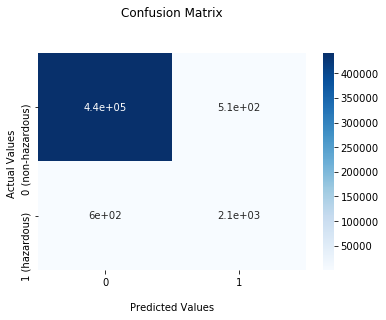

In [64]:
ax = sns.heatmap(cf_matrix,
                 annot=True,
                 cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels 
ax.yaxis.set_ticklabels(['0 (non-hazardous)','1 (hazardous)'])

## Visualizzazione Confusion Matrix.
plt.show()

# SVM

In [65]:
from pyspark.ml.classification import LinearSVC


Utilizzo il dataset generato nella sezione Logistic Regression - con Undersampling in quanto lo sbilanciamento è troppo elevato. Di conseguenza eseguire un test su un dataset sbilanciato porterebbe a risultati non interessanti.

In [30]:
# inizializzo il modello
lsvc = LinearSVC()

#### Ricerca configurazione ottimale tramite Grid Search

In [46]:
# parameter tuning
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

paramGrid = (ParamGridBuilder()
            .addGrid(lsvc.regParam, [0, 0.1, 0.2, 0.5, 2])# regularization
            .addGrid(lsvc.maxIter, [10, 20]) # numero iterazioni
            .build())

cv = CrossValidator(estimator=lsvc,
                    estimatorParamMaps=paramGrid,
                    evaluator = evaluator, numFolds= 5)

cvModel = cv.fit(train)

In [47]:
# Best Model Parameters
best_model = cvModel.bestModel

print('Best Param(reg_params): ', best_model._java_obj.getRegParam())
print('Best Param(MaxIter): ', best_model._java_obj.getMaxIter())


Best Param(reg_params):  0.1
Best Param(MaxIter):  10


#### Alleno il modello

In [66]:
lsvc = LinearSVC(regParam=0.1)

In [67]:
# eseguo il fit sul training set - train: definito nella logistic regression è stato undersampled
lsvcModel = lsvc.fit(train)

In [68]:
# stampo i coefficienti e l'intercetta del linear SVC
print("Coefficients: " + str(lsvcModel.coefficients))
print("Intercept: " + str(lsvcModel.intercept))

Coefficients: [0.020973990102895464,0.010058208868440187,-0.0008869526693641935,40.339477145786255,35.406938718218015,0.010158253340204287,0.0174854975811389,0.01415092659749429,0.00852821181859124,0.22107279326999457,0.06289357706643456,6.107984773325019e-05]
Intercept: -4.7111630844578185


In [69]:
# eseguo il test
predictions = lsvcModel.transform(test)
predictions.select('label','features',
                   'rawPrediction','prediction'
                  ).show()

+-----+--------------------+--------------------+----------+
|label|            features|       rawPrediction|prediction|
+-----+--------------------+--------------------+----------+
|    0|(12,[0,1,2,3,4,5]...|[0.72400701303938...|       0.0|
|    0|(12,[0,1,2,3,4,5]...|[0.72400701303938...|       0.0|
|    0|(12,[0,1,2,3,4,5]...|[1.20516718119894...|       0.0|
|    0|(12,[0,1,2,3,4,5]...|[1.20516718119894...|       0.0|
|    0|(12,[0,1,2,3,4,8]...|[1.83175578242540...|       0.0|
|    0|(12,[0,1,2,3,4,8]...|[1.83175578242540...|       0.0|
|    0|(12,[3,4,5],[0.01...|[3.22295791816455...|       0.0|
|    0|[0.0,0.0,0.0,0.03...|[1.61939507415744...|       0.0|
|    0|[0.0,0.0,0.0,0.03...|[1.60651922912424...|       0.0|
|    0|[0.0,0.0,0.0,0.03...|[1.52327066205326...|       0.0|
|    0|[0.0,0.0,0.0,0.03...|[1.48062960296030...|       0.0|
|    0|[0.0,0.0,0.0,0.04...|[1.42556439262113...|       0.0|
|    0|[0.041667,1.0,19....|[1.65034088331302...|       0.0|
|    0|[0.041667,1.0,19.

In [70]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

evaluator = BinaryClassificationEvaluator()
print('Test AUC:', evaluator.evaluate(predictions))

Test AUC: 0.9950968079581088


In [71]:
# vedo l'accuracy del modello
accuracy = predictions.filter(predictions.label == predictions.prediction).count() / float(predictions.count())
print("Accuracy : ",accuracy)

Accuracy :  0.9898790022463623


In [72]:
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.sql.types import FloatType
import pyspark.sql.functions as F

preds_and_labels = predictions.select(['prediction','label']
                                     ).withColumn('label',
                                                  F.col('label').cast(FloatType())
                                                 ).orderBy('prediction')

preds_and_labels = preds_and_labels.select(['prediction','label'])
metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))

In [73]:
# Statistics by class
for label in range(0,2):
    print("Class %s precision = %s" % (label, metrics.precision(label)))
    print("Class %s recall = %s" % (label, metrics.recall(label)))
    print("--------------------- \n")

Class 0 precision = 0.9998126275332415
Class 0 recall = 0.9900015385729284
--------------------- 

Class 1 precision = 0.37655191873589167
Class 1 recall = 0.970192657215558
--------------------- 



In [74]:
cf_matrix = metrics.confusionMatrix().toArray()

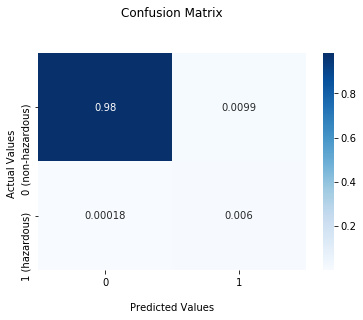

In [75]:
# percentuale
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix),
                 annot=True,
                 cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0 (non-hazardous)','1 (hazardous)'])

## Visualizzazione Confusion Matrix.
plt.show()

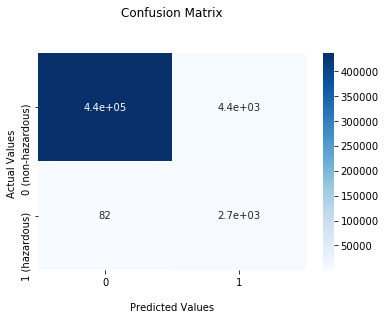

In [76]:
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels
ax.yaxis.set_ticklabels(['0 (non-hazardous)','1 (hazardous)'])

## Visualizzazione Confusion Matrix.
plt.show()